In [2]:
import csv
import matplotlib.pyplot as plt
import os
import imageio
import numpy as np

def median_perc(data) : 
    median = np.zeros(data.shape[1]) 
    perc_25 = np.zeros(data.shape[1]) 
    perc_75 = np.zeros(data.shape[1]) 
    for i in range(0, len(median)): 
        median[i] = np.median(data[:, i]) 
        perc_25[i] = np.percentile(data[:, i], 25) 
        perc_75[i] = np.percentile(data[:, i], 75) 
    return median, perc_75, perc_25    

def load_all_fitnesses(filename) :
    with open(filename) as file :
        csv_data = csv.reader(file,delimiter=',')
        best_fitnesses = []
        avg_fitnesses = []
        pop_size= []
        nb_eval = []
        nb_eval_tot = 0
        for row in csv_data :
            best_fitness = 0
            avg_fitness = 0
            nb_eval_tot += int(row[1])
            for cell in row[2:-1] :
                if(float(cell) > best_fitness) :
                    best_fitness = float(cell)
                avg_fitness += float(cell)
            avg_fitness = avg_fitness/float(row[1])
            avg_fitnesses.append(avg_fitness)
            best_fitnesses.append(best_fitness)
            nb_eval.append(nb_eval_tot)
            pop_size.append(float(row[1]))
            
    return nb_eval, best_fitnesses, avg_fitnesses, pop_size

def load_fit_from_folder(foldername,nb_gen) :
    best_fits = []
    for folder in os.listdir(foldername) :
        if(not os.path.isdir(foldername + folder)) :
            continue
        print(folder)
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(foldername + folder + "/fitnesses.csv")
        best_fits.append(best_fit)
    data = np.zeros((len(best_fits),nb_gen))
    for i in range(len(best_fits)) :
        data[i,:] = best_fits[i][:nb_gen]
    median, perc_75, perc_25 = median_perc(data)
    return neval, median, perc_75, perc_25

def load_nov_from_folder(foldername) :
    best_novs = []
    for folder in os.listdir(foldername) :
        if(not os.path.isdir(foldername + folder)) :
            continue
        print(folder)
        neval, best_nov, avg_nov,pop_size = load_all_fitnesses(foldername + folder + "/novelty.csv")
        best_novs.append(best_nov)
    data = np.zeros((len(best_novs),len(neval)))
    for i in range(len(best_novs)) :
        data[i,:] = best_novs[i]
    median, perc_75, perc_25 = median_perc(data)
    return neval, median, perc_75, perc_25

def load_te_from_folder(foldername) :
    tes = []
    for folder in os.listdir(foldername) :
        if(not os.path.isdir(foldername + folder)) :
            continue
        print(folder)
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(foldername + folder + "/fitnesses.csv")
        nbeval, eval_time = load_eval_time(foldername + folder + "/eval_durations.csv")
        te = [abs(best_fit[i] - best_fit[i-1])/eval_time[i-1] for i in range(1,len(best_fit))]
        tes.append(te)
    data = np.zeros((len(tes),len(tes[0])))
    for i in range(len(tes)) :
        data[i,:] = tes[i]
    median, perc_75, perc_25 = median_perc(data)
    return neval, median, perc_75, perc_25

def histo_nbeval(nbeval,bins) :
    histo = [0 for b in bins]
    for nbe in nbeval :
        for i in range(0,len(bins)) :
            if(nbe < int(bins[i])) :
                histo[i] += 1
                break
    for i in range(0,len(histo)) :
        histo[i] = float(histo[i])/float(len(nbeval))
    return histo

def load_final_pos(filename,pop,gen) :
    with open(filename) as file :
        csv_data = csv.reader(file,delimiter=',')
        x = []
        y = []
        for row in csv_data :
            if(float(row[1]) == gen) :
                i = 0
                j = 2
                while(i < pop - 1):
                    if(j >= len(row) -1) :
                        break
                    if(float(row[j]) == i and float(row[j+1]) != i+1) :
                        x.append(float(row[j+1]))
                        y.append(float(row[j+2]))
                        j+=3
                    
                    j+=1
                    i+=1
                break
        return x, y
    
def load_eval_time(filename) :
    with open(filename) as file :
        csv_data = csv.reader(file,delimiter=',')
        durations = []
        eval_nb = []
        i = 1
        for row in csv_data :
            durations.append(float(row[1])*1e-9)
            eval_nb.append(int(row[0]))
            i+=1
    return eval_nb, durations

def animation_pop(foldername,pop_size,step) :
    plt.ioff()
    images = []
    for i in range(0,len(pop_size),step) :
        x_vec = []
        y_vec = []
        if(not os.path.isdir(foldername)) :
            continue
        x, y = load_final_pos(foldername + "/final_pos.csv",pop_size[i],i)
        x_vec = x_vec + x
        y_vec = y_vec + y   
                
        fig2, ax2 = plt.subplots(figsize=[10,10])
        ax2.set_ylim(-1.,1.)
        ax2.set_xlim(-1.,1.)
        plt.title("Generation " + str(i))
        plt.plot(x_vec,y_vec,'o')
        plt.savefig(foldername + "/pop_" + str(i) + ".jpg")
        plt.close(fig2)
        images.append(imageio.imread(foldername + "/pop_" + str(i) + ".jpg"))
    imageio.mimwrite(foldername + "_pop_gen.gif",images)
    
def load_stop_crit(foldername) :
    filename = folder + '/stop_crit.csv'
    generation = []
    criteria = []
    if not os.path.isfile(filename) :
        return generation, criteria
    with open(filename) as file :
        
        csv_data = csv.reader(file,delimiter=',')
        for row in csv_data :
            generation.append(int(row.split(',')[0]))
            criteria.append(row.split(',')[1])
    return generation, criteria

def load_samples(foldername) :
    samples = []
    for filename in os.listdir(foldername) :
        if(filename.split("_")[0] != "genome") :
            continue
        s = []
        with open(foldername +'/'+ filename) as file :
            lines = file.readlines()
            for i in range(2,len(lines)) :
                s.append(float(lines[i]))
        samples.append(s)
    return samples

FileNotFoundError: [Errno 2] No such file or directory: '/home/leni/are-logs/are_ipop_escape_0/'

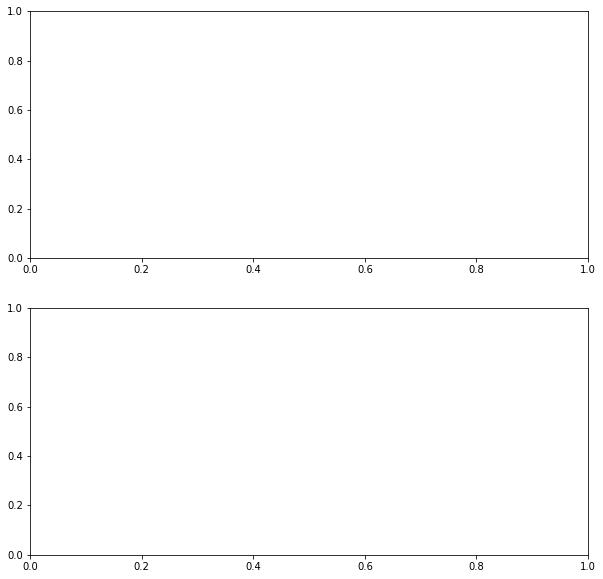

In [2]:
list_dir = [ "/home/leni/are-logs/are_ipop_escape_0/", \
            "/home/leni/are-logs/are_ipop_escape_005/", \
           "/home/leni/are-logs/are_ipop_escape_01/", \
           "/home/leni/are-logs/are_ipop_escape_02/", \
           "/home/leni/are-logs/are_ipop_escape_04/", \
           "/home/leni/are-logs/are_ipop_escape_08/"]
list_label = ["no noise","0.05","0.1","0.2","0.4","0.8"]
best_fits = []
i = 0   
nbevals = []
bins = ['100','500','1000','2000','3000','4000','5000']
xbar = np.arange(len(bins))
width = 1./float(len(list_label))
fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(2,1,1)
ax2 = fig.add_subplot(2,1,2)
i = -len(list_dir)
j = 0
for dire in list_dir :
    nevals = []
    for folder in os.listdir(dire) :
        if(folder.split("_")[0] != "ipop") :
            continue
        if(not os.path.isdir(dire + folder)) :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses_hn.csv")
        nevals.append(neval[-1])
    print(len(nevals))
    nbevals.append(nevals)
    histo = histo_nbeval(nevals,bins)
    print(histo)
    ax2.bar(xbar + width*i+width/2.,histo,width - 0.02,label=list_label[j])
    i += 1
    j += 1
    
ax2.set_xticks(xbar)
ax2.set_xticklabels(bins)
ax2.legend()
ax1.boxplot(nbevals,labels=list_label)
ax1.set_ylabel("total nb of evaluations")
ax1.set_xlabel("experiment name")
plt.show()

20
[0.05, 0.0, 0.25, 0.3, 0.3, 0.1, 0.0, 0.0, 0.0]
20
[0.15, 0.1, 0.25, 0.35, 0.1, 0.05, 0.0, 0.0, 0.0]
20
[0.05, 0.05, 0.15, 0.35, 0.3, 0.05, 0.05, 0.0, 0.0]
20
[0.0, 0.15, 0.1, 0.2, 0.35, 0.15, 0.05, 0.0, 0.0]


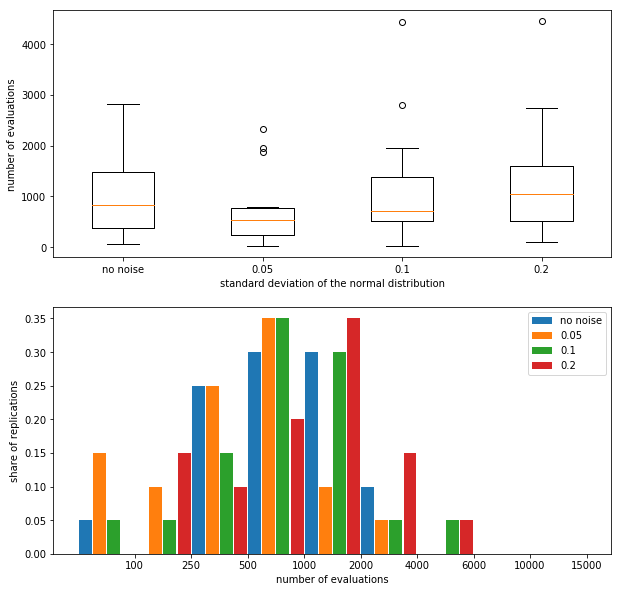

In [11]:
list_dir = [ "/home/leni/are-logs/are_ipop_escape_0/", \
            "/home/leni/are-logs/are_ipop_escape_005/", \
           "/home/leni/are-logs/are_ipop_escape_01/", \
           "/home/leni/are-logs/are_ipop_escape_02/"]
list_label = ["no noise","0.05","0.1","0.2"]
best_fits = []
i = 0   
nbevals = []
bins = ['100','250','500','1000','2000','4000','6000','10000','15000']
xbar = np.arange(len(bins))
width = 1./float(len(list_label))
fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(2,1,1)
ax2 = fig.add_subplot(2,1,2)
i = -len(list_dir)
j = 0
for dire in list_dir :
    nevals = []
    for folder in os.listdir(dire) :
        if(folder.split("_")[0] != "ipop") :
            continue
        if(not os.path.isdir(dire + folder)) :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses_hn.csv")
        nevals.append(neval[-1])
    print(len(nevals))
    nbevals.append(nevals)
    histo = histo_nbeval(nevals,bins)
    print(histo)
    ax2.bar(xbar + width*i+width/2.,histo,width - 0.02,label=list_label[j])
    i += 1
    j += 1
    
ax2.set_xticks(xbar)
ax2.set_xticklabels(bins)
ax2.legend()
ax1.boxplot(nbevals,labels=list_label)
ax1.set_ylabel("number of evaluations")
ax1.set_xlabel("standard deviation of the normal distribution")
ax2.set_xlabel("number of evaluations")
ax2.set_ylabel("share of replications")
plt.show()

21
[0.0, 0.23809523809523808, 0.38095238095238093, 0.2857142857142857, 0.047619047619047616, 0.0, 0.0, 0.047619047619047616, 0.0, 0.0]
20
[0.05, 0.0, 0.25, 0.3, 0.15, 0.15, 0.0, 0.1, 0.0, 0.0]
10
[0.0, 0.2, 0.1, 0.2, 0.2, 0.2, 0.0, 0.1, 0.0, 0.0]
10
[0.0, 0.2, 0.3, 0.4, 0.0, 0.1, 0.0, 0.0, 0.0, 0.0]
10
[0.1, 0.2, 0.3, 0.3, 0.0, 0.1, 0.0, 0.0, 0.0, 0.0]
10
[0.1, 0.1, 0.6, 0.2, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
11
[0.09090909090909091, 0.2727272727272727, 0.36363636363636365, 0.18181818181818182, 0.09090909090909091, 0.0, 0.0, 0.0, 0.0, 0.0]
10
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0]


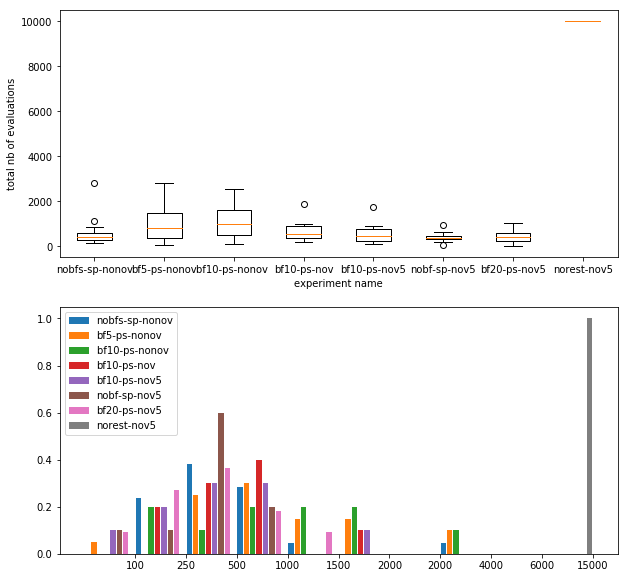

In [20]:
list_dir = [ "/home/leni/are-logs/are_ipop_escape/", \
            "/home/leni/are-logs/are_ipop_escape_0/", \
           "/home/leni/are-logs/are_ipop_escape_los10/", \
           "/home/leni/are-logs/are_ipop_escape_nov_1/", \
           "/home/leni/are-logs/are_ipop_escape_los10_kv5/", \
           "/home/leni/are-logs/are_ipop_escape_nolos_kv5/", \
           "/home/leni/are-logs/are_ipop_escape_bf20_ps_nov/", \
           "/home/leni/are-logs/are_ipop_escape_norestart_nov/"]
list_label = ["nobfs-sp-nonov","bf5-ps-nonov","bf10-ps-nonov ","bf10-ps-nov","bf10-ps-nov5","nobf-sp-nov5","bf20-ps-nov5","norest-nov5"]
best_fits = []
i = 0   
nbevals = []
bins = ['100','250','500','1000','2000','4000','6000','15000']
xbar = np.arange(len(bins))
width = 1./float(len(list_label))
fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(2,1,1)
ax2 = fig.add_subplot(2,1,2)
i = -len(list_dir)
j = 0
for dire in list_dir :
    nevals = []
    for folder in os.listdir(dire) :
        if(folder.split("_")[0] != "ipop") :
            continue
        if(not os.path.isdir(dire + folder)) :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses_hn.csv")
        nevals.append(neval[-1])
    print(len(nevals))
    nbevals.append(nevals)
    histo = histo_nbeval(nevals,bins)
    print(histo)
    ax2.bar(xbar + width*i+width/2.,histo,width - 0.02,label=list_label[j])
    i += 1
    j += 1
    
ax2.set_xticks(xbar)
ax2.set_xticklabels(bins)
ax2.legend()
ax1.boxplot(nbevals,labels=list_label)
ax1.set_ylabel("total nb of evaluations")
ax1.set_xlabel("experiment name")
plt.show()

21
[0.0, 0.23809523809523808, 0.38095238095238093, 0.2857142857142857, 0.047619047619047616, 0.0, 0.047619047619047616, 0.0, 0.0]
20
[0.05, 0.0, 0.25, 0.3, 0.15, 0.15, 0.1, 0.0, 0.0]
10
[0.0, 0.2, 0.1, 0.2, 0.2, 0.2, 0.1, 0.0, 0.0]
10
[0.0, 0.2, 0.3, 0.4, 0.0, 0.1, 0.0, 0.0, 0.0]
10
[0.1, 0.2, 0.3, 0.3, 0.0, 0.1, 0.0, 0.0, 0.0]
10
[0.1, 0.1, 0.6, 0.2, 0.0, 0.0, 0.0, 0.0, 0.0]
11
[0.09090909090909091, 0.2727272727272727, 0.36363636363636365, 0.18181818181818182, 0.09090909090909091, 0.0, 0.0, 0.0, 0.0]
10
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0]


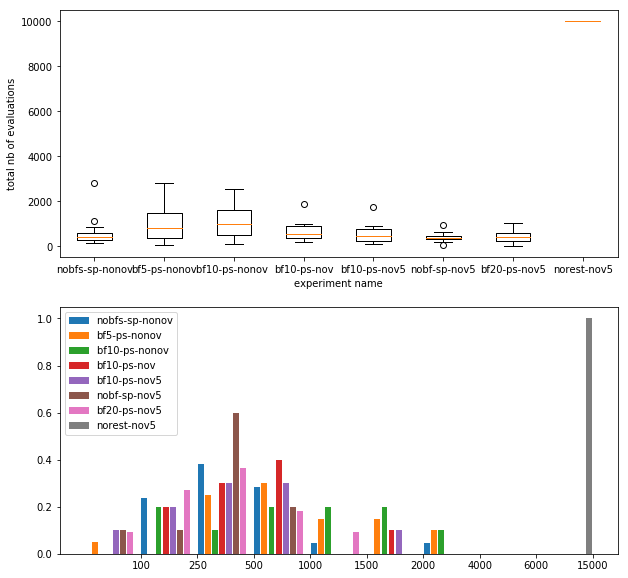

In [21]:
list_dir = [ "/home/leni/are-logs/are_ipop_escape/", \
            "/home/leni/are-logs/are_ipop_escape_0/", \
           "/home/leni/are-logs/are_ipop_escape_los10/", \
           "/home/leni/are-logs/are_ipop_escape_nov_1/", \
           "/home/leni/are-logs/are_ipop_escape_los10_kv5/", \
           "/home/leni/are-logs/are_ipop_escape_nolos_kv5/", \
           "/home/leni/are-logs/are_ipop_escape_bf20_ps_nov/", \
           "/home/leni/are-logs/are_ipop_escape_norestart_nov/"]
list_label = ["nobfs-sp-nonov","bf5-ps-nonov","bf10-ps-nonov ","bf10-ps-nov","bf10-ps-nov5","nobf-sp-nov5","bf20-ps-nov5","norest-nov5"]
best_fits = []
i = 0   
nbevals = []
bins = ['100','250','500','1000','1500','2000','4000','6000','15000']
xbar = np.arange(len(bins))
width = 1./float(len(list_label))
fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(2,1,1)
ax2 = fig.add_subplot(2,1,2)
i = -len(list_dir)
j = 0
for dire in list_dir :
    nevals = []
    for folder in os.listdir(dire) :
        if(folder.split("_")[0] != "ipop") :
            continue
        if(not os.path.isdir(dire + folder)) :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses_hn.csv")
        nevals.append(neval[-1])
    print(len(nevals))
    nbevals.append(nevals)
    histo = histo_nbeval(nevals,bins)
    print(histo)
    ax2.bar(xbar + width*i+width/2.,histo,width - 0.02,label=list_label[j])
    i += 1
    j += 1
    
ax2.set_xticks(xbar)
ax2.set_xticklabels(bins)
ax2.legend()
ax1.boxplot(nbevals,labels=list_label)
ax1.set_ylabel("total nb of evaluations")
ax1.set_xlabel("experiment name")
plt.show()

20
[0.05, 0.2, 0.2, 0.25, 0.3, 0.0, 0.0, 0.0, 0.0]
20
[0.0, 0.05, 0.25, 0.5, 0.15, 0.05, 0.0, 0.0, 0.0]


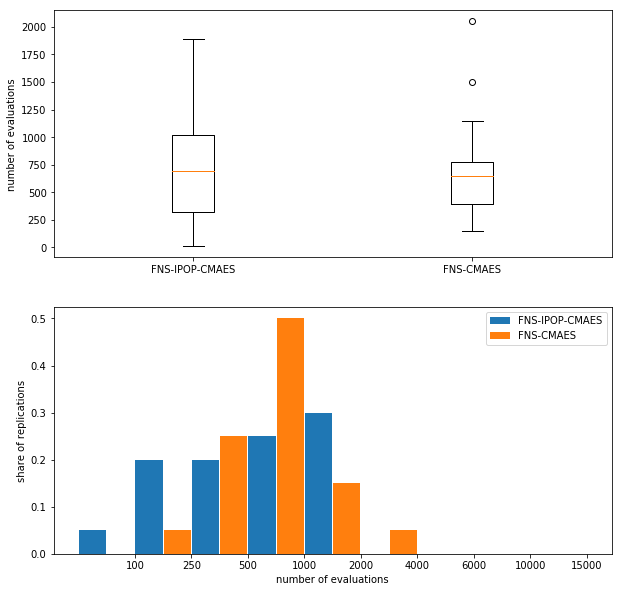

In [17]:
list_dir = [ "/home/leni/are-logs/are_ipop_escape_bf20_ps_nov/", \
           "/home/leni/are-logs/are_ipop_escape_norestart_nov/"]
list_label = ["FNS-IPOP-CMAES","FNS-CMAES"]
best_fits = []
i = 0   
nbevals = []
bins = ['100','250','500','1000','2000','4000','6000','10000','15000']
xbar = np.arange(len(bins))
width = 1./float(len(list_label))
fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(2,1,1)
ax2 = fig.add_subplot(2,1,2)
i = -len(list_dir)
j = 0
for dire in list_dir :
    nevals = []
    for folder in os.listdir(dire) :
        if(folder.split("_")[0] != "ipop") :
            continue
        if(not os.path.isdir(dire + folder)) :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses_hn.csv")
        best_fits.append(max(best_fit))
        nevals.append(neval[-1])
        for n in range(len(best_fit)) :
            if(best_fit[n] >= 0.95) :
                nevals[-1] = neval[n]
                break
    print(len(nevals))
    nbevals.append(nevals)
    histo = histo_nbeval(nevals,bins)
    print(histo)
    ax2.bar(xbar + width*i+width/2.,histo,width - 0.02,label=list_label[j])
    i += 1
    j += 1
    
ax2.set_xticks(xbar)
ax2.set_xticklabels(bins)
ax2.set_xlabel("number of evaluations")
ax2.set_ylabel("share of replications")
ax2.legend()
ax1.boxplot(nbevals,labels=list_label)
ax1.set_ylabel("number of evaluations")
plt.show()

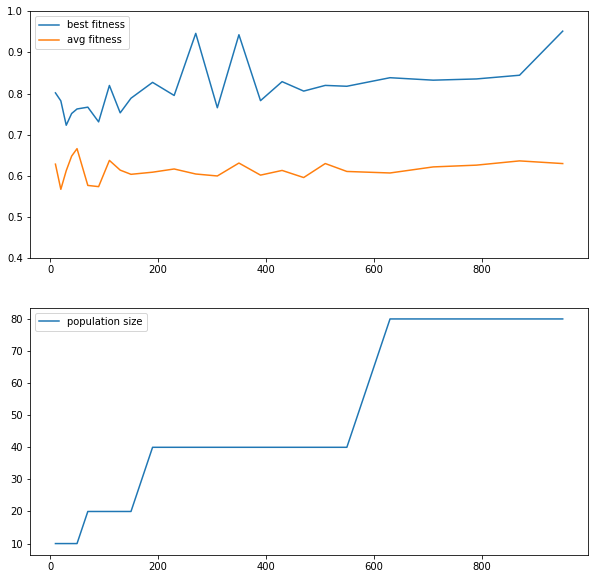

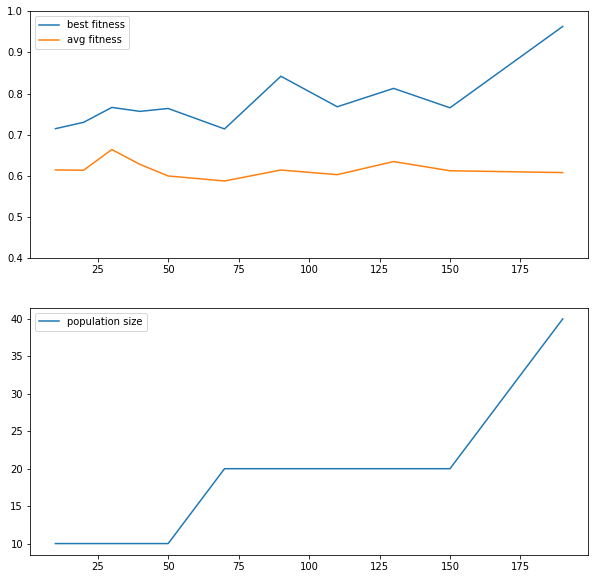

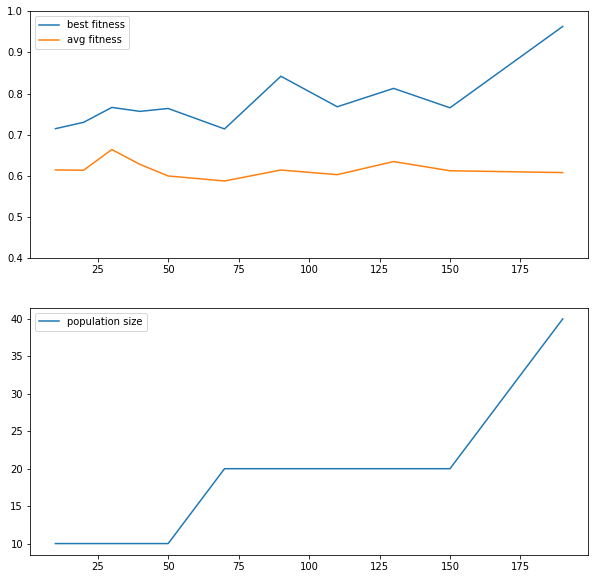

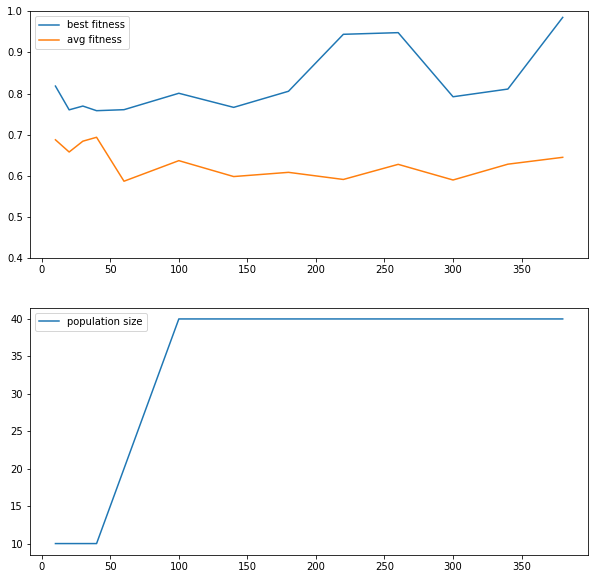

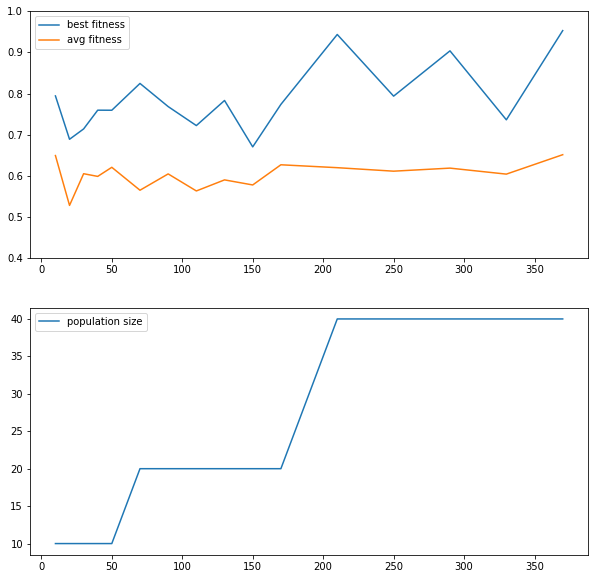

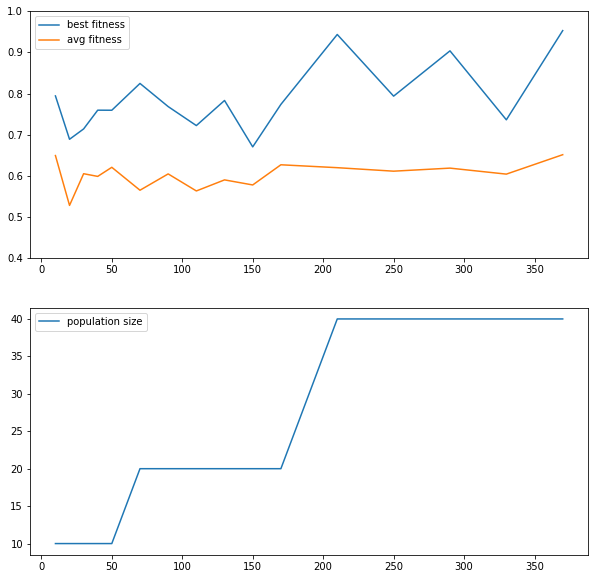

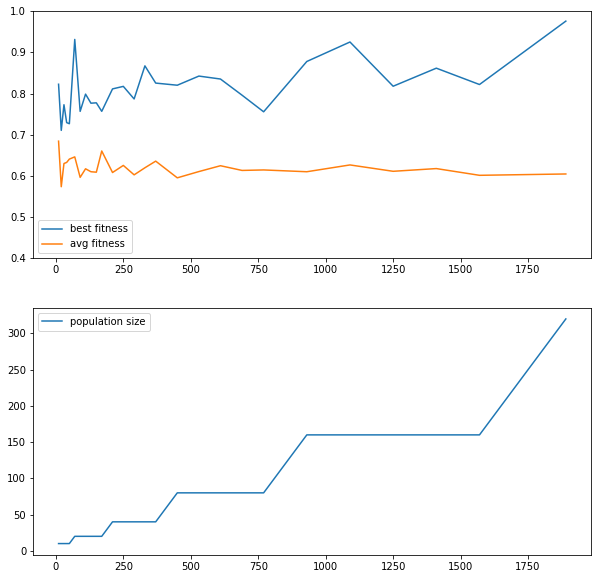

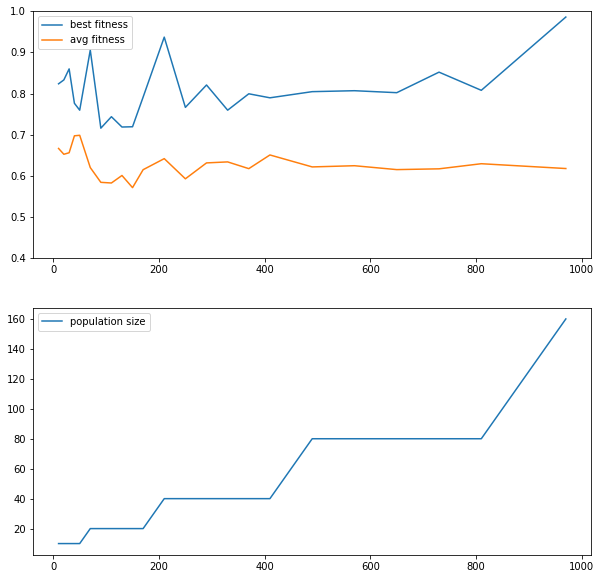

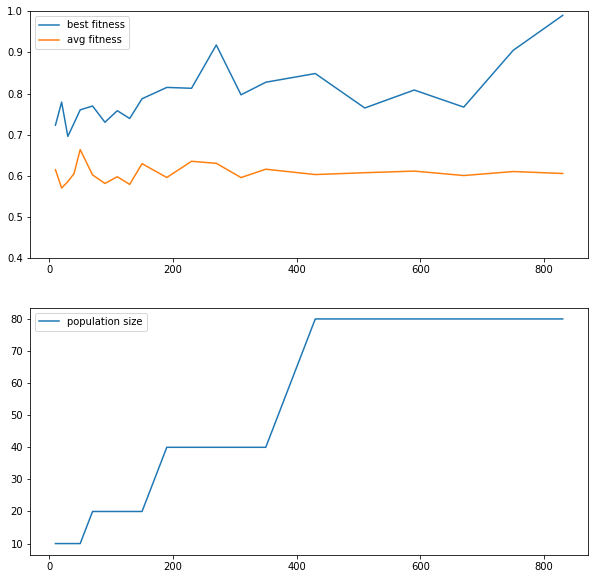

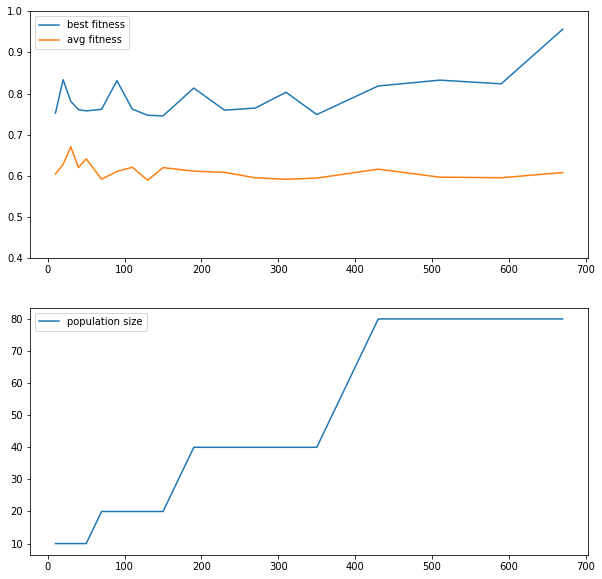

In [11]:
are_ipop_escape_nov_1 = "/home/leni/are-logs/are_ipop_escape_nov_1/"
x_vec = []
y_vec = []
for folder in os.listdir(are_ipop_escape_nov_1) :
    if(not os.path.isdir(are_ipop_escape_nov_1 + folder)) :
        continue
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_ipop_escape_nov_1 + folder + "/fitnesses_hn.csv")
    fig = plt.figure(figsize=[10,10])
    ax1 = fig.add_subplot(2,1,1)
    ax2 = fig.add_subplot(2,1,2)
    ax1.set_ylim(0.4,1)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    
    
    ax1.legend()
    ax2.legend()
    plt.show()
    animation_pop(are_ipop_escape_nov_1 + folder,pop_size,1)

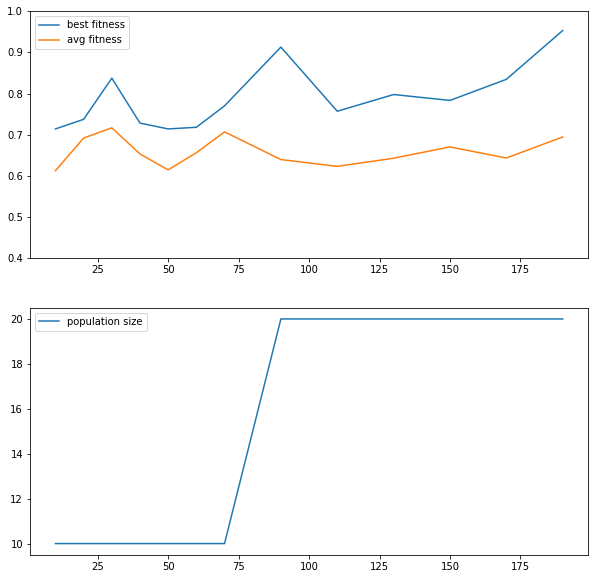

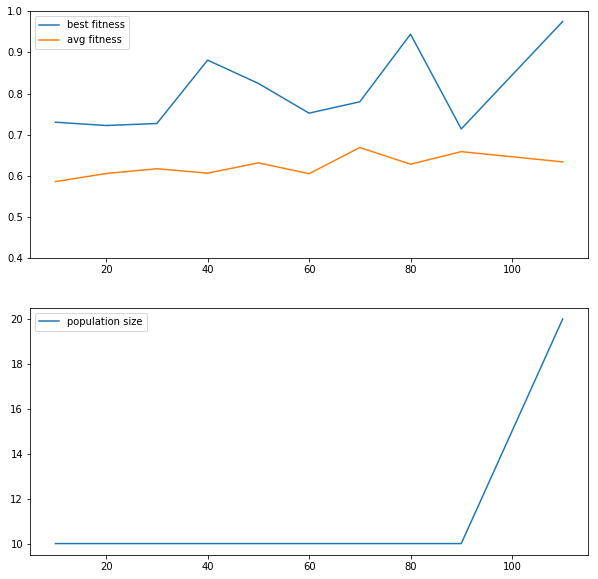

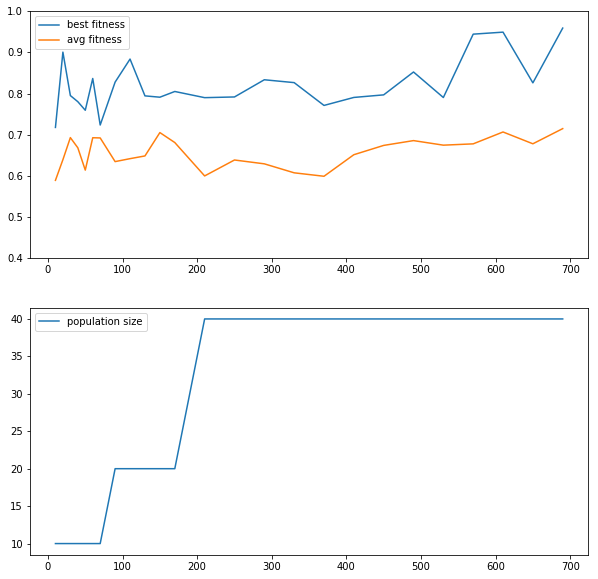

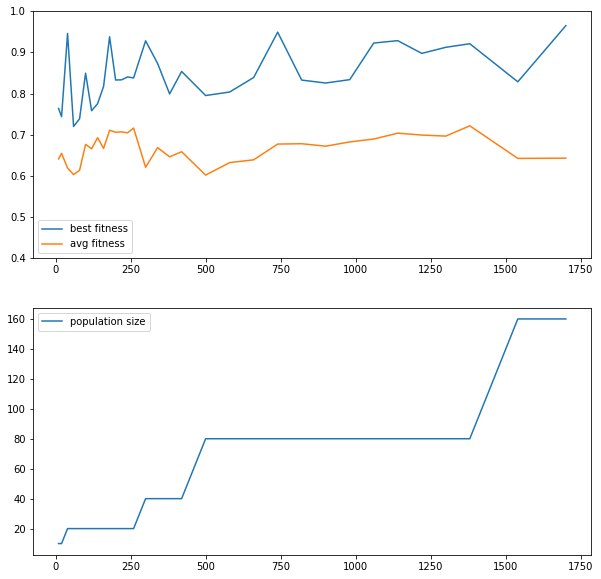

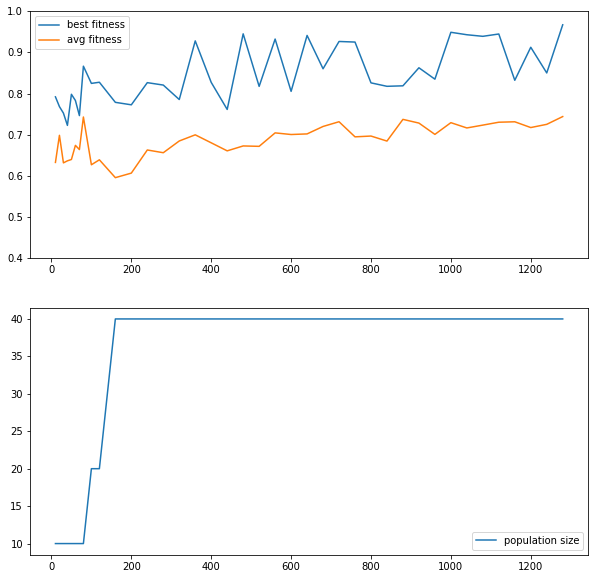

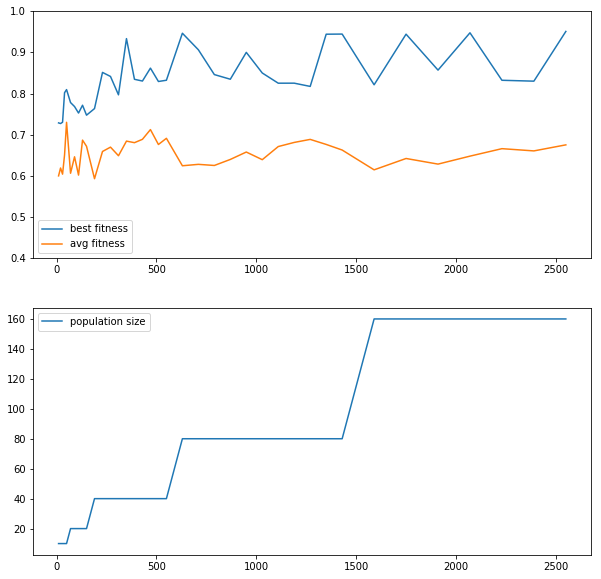

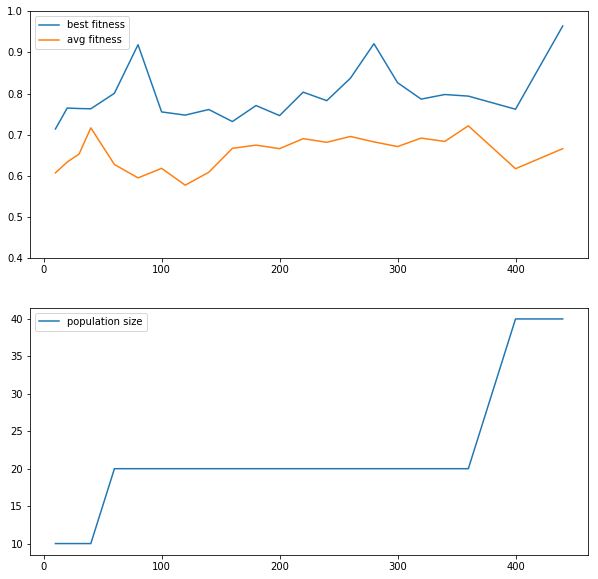

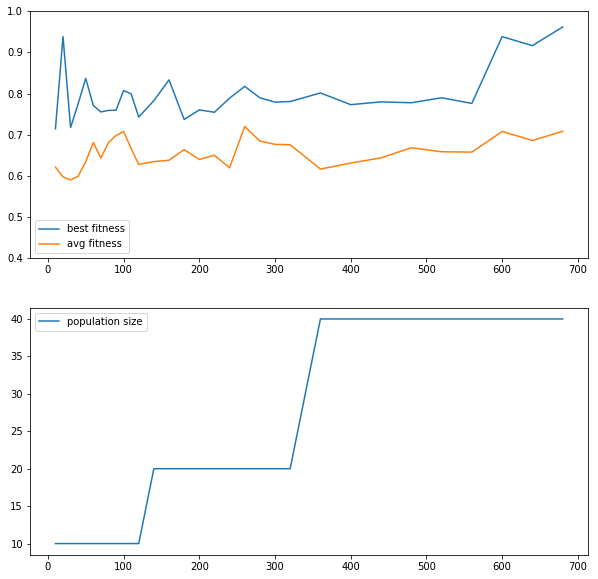

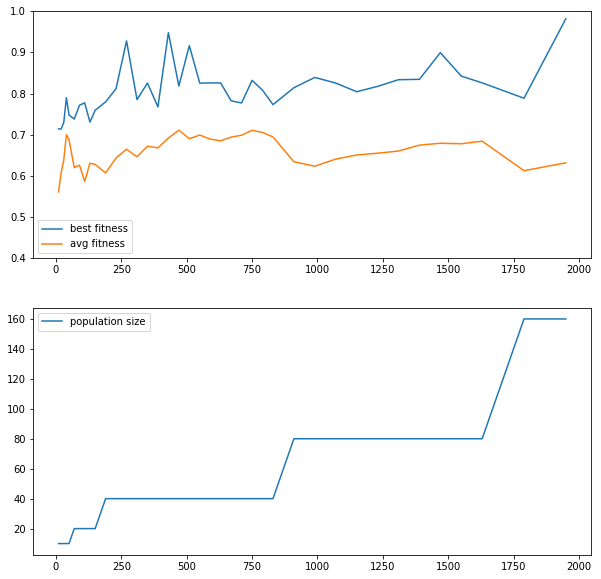

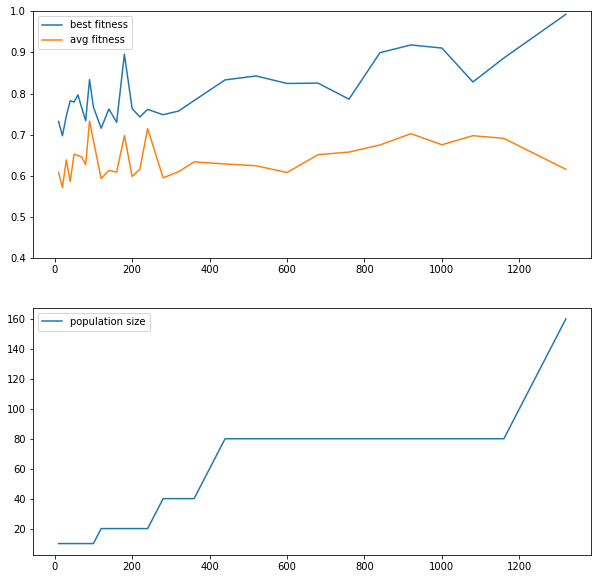

In [31]:
are_ipop_escape_los10 = "/home/leni/are-logs/are_ipop_escape_los10/"
x_vec = []
y_vec = []
for folder in os.listdir(are_ipop_escape_los10) :
    if(not os.path.isdir(are_ipop_escape_los10 + folder)) :
        continue
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_ipop_escape_los10 + folder + "/fitnesses_hn.csv")
    fig = plt.figure(figsize=[10,10])
    ax1 = fig.add_subplot(2,1,1)
    ax2 = fig.add_subplot(2,1,2)
    ax1.set_ylim(0.4,1)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    
    
    ax1.legend()
    ax2.legend()
    plt.show()
    animation_pop(are_ipop_escape_los10 + folder,pop_size,1)

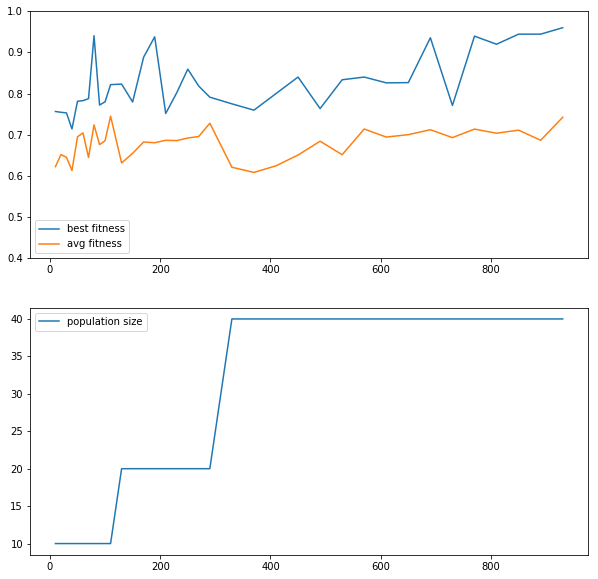

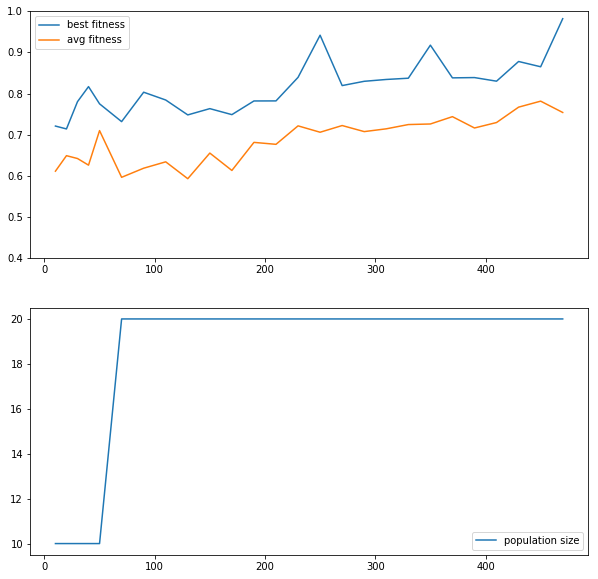

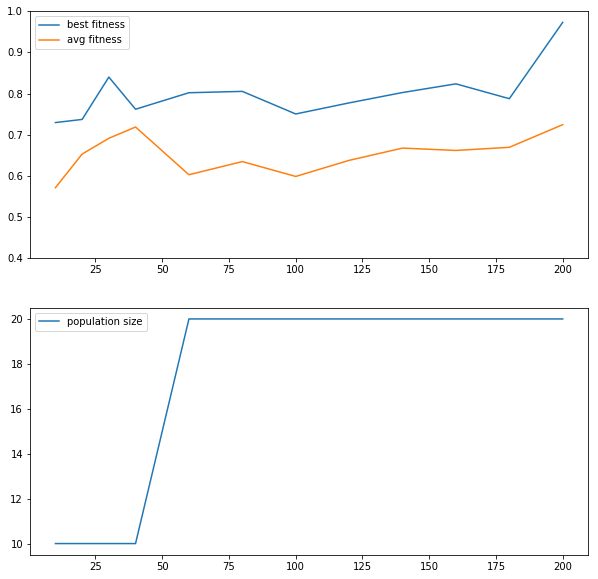

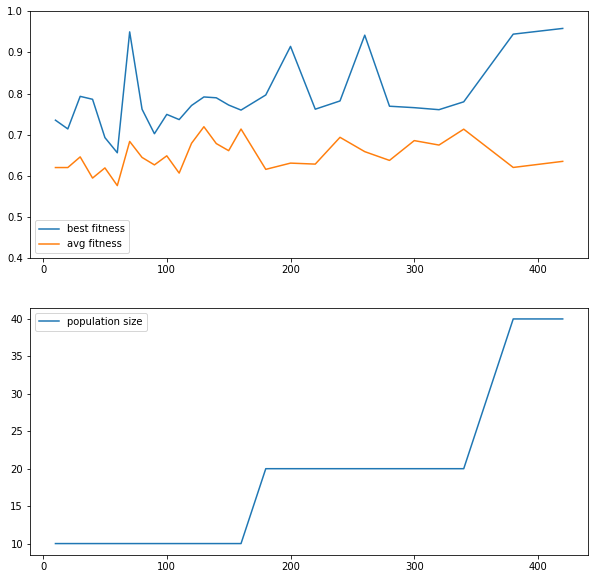

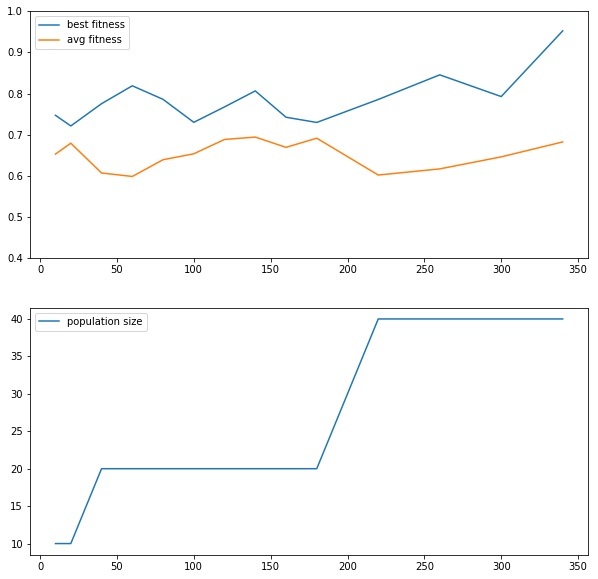

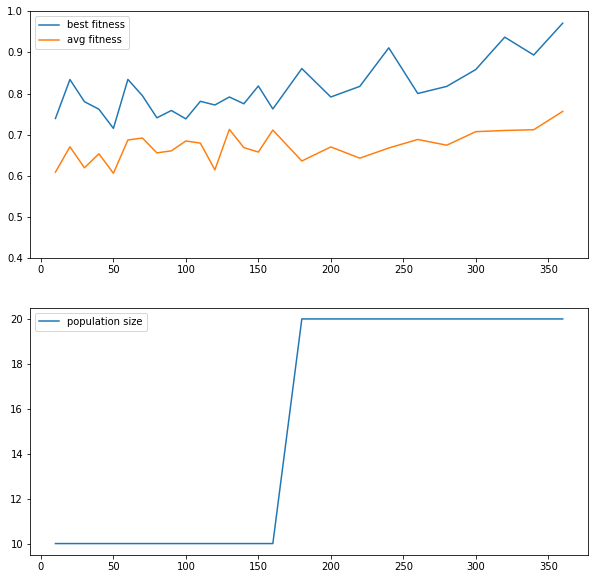

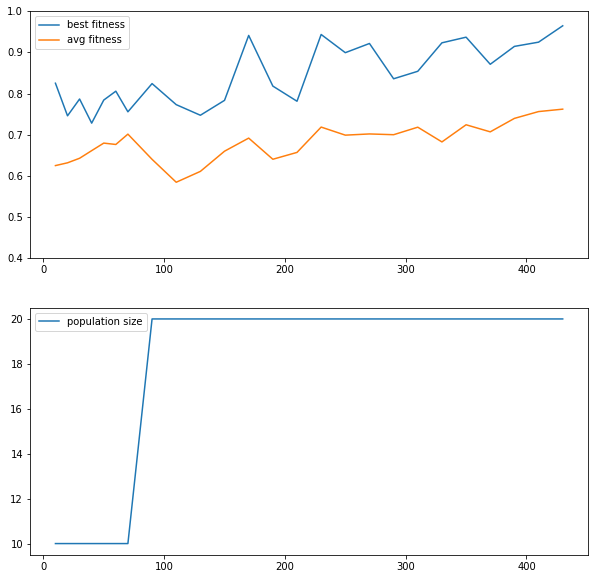

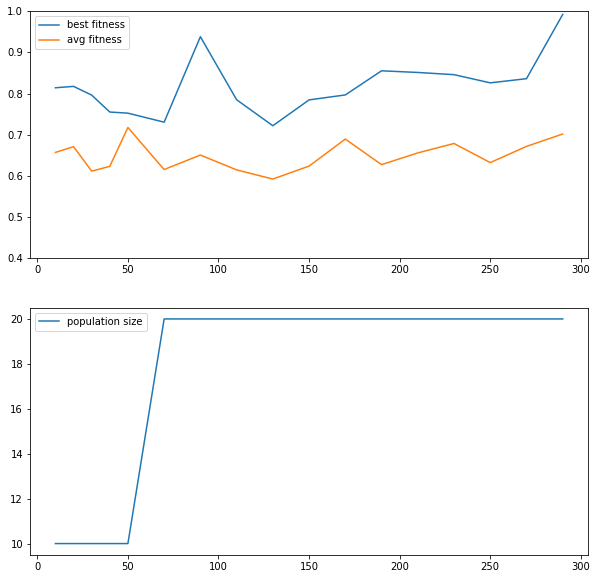

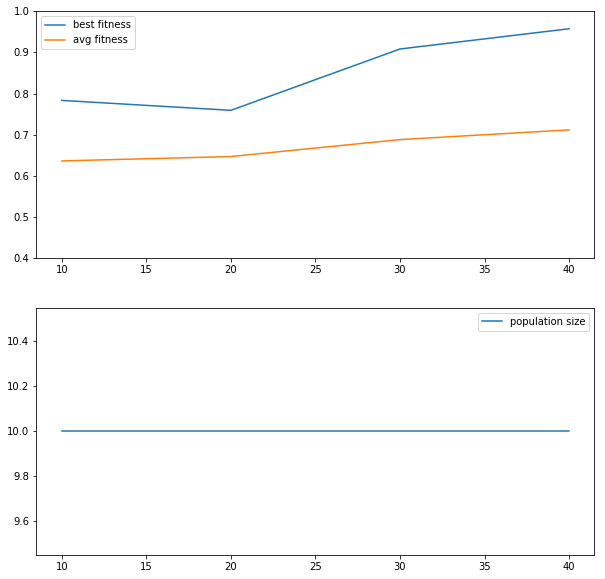

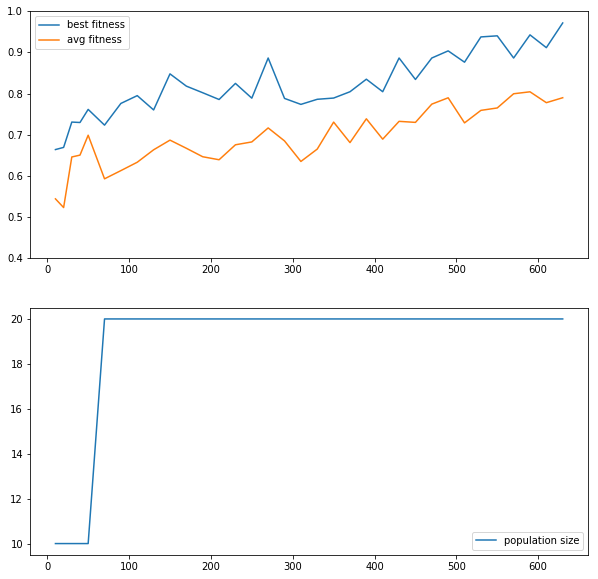

In [37]:
are_ipop_escape_nolos_kv5 = "/home/leni/are-logs/are_ipop_escape_nolos_kv5/"
x_vec = []
y_vec = []
for folder in os.listdir(are_ipop_escape_nolos_kv5) :
    if(not os.path.isdir(are_ipop_escape_nolos_kv5 + folder)) :
        continue
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_ipop_escape_nolos_kv5 + folder + "/fitnesses_hn.csv")
    fig = plt.figure(figsize=[10,10])
    ax1 = fig.add_subplot(2,1,1)
    ax2 = fig.add_subplot(2,1,2)
    ax1.set_ylim(0.4,1)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    
    
    ax1.legend()
    ax2.legend()
    plt.show()
    animation_pop(are_ipop_escape_nolos_kv5 + folder,pop_size,1)

10
[0.0, 0.0, 0.0, 0.0, 0.0, 0.1, 0.0, 0.0, 0.0, 0.9]
10
[0.0, 0.1, 0.0, 0.0, 0.3, 0.1, 0.0, 0.2, 0.0, 0.3]
10
[0.0, 0.0, 0.0, 0.0, 0.1, 0.0, 0.0, 0.2, 0.0, 0.7]
11
[0.09090909090909091, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.9090909090909091]
20
[0.0, 0.1, 0.05, 0.15, 0.25, 0.15, 0.0, 0.15, 0.05, 0.1]
19
[0.0, 0.21052631578947367, 0.0, 0.2631578947368421, 0.15789473684210525, 0.15789473684210525, 0.0, 0.10526315789473684, 0.10526315789473684, 0.0]
10
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1, 0.2, 0.7]
10
[0.0, 0.0, 0.1, 0.0, 0.1, 0.0, 0.0, 0.1, 0.4, 0.3]
10
[0.0, 0.0, 0.2, 0.3, 0.1, 0.0, 0.0, 0.3, 0.1, 0.0]


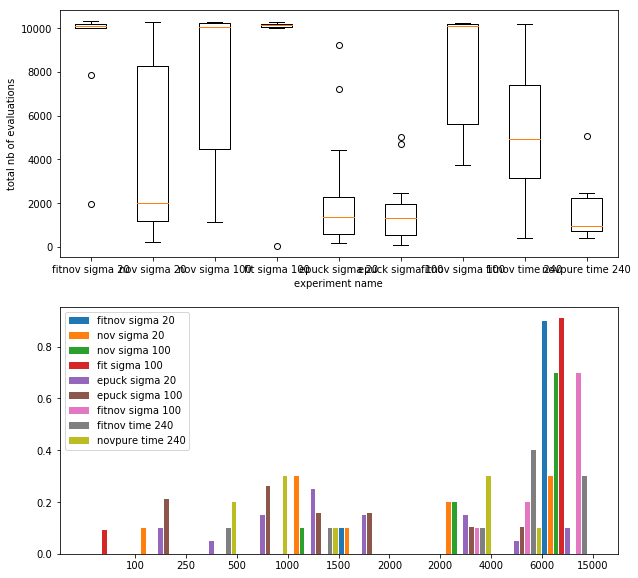

In [19]:
list_dir = ["/home/leni/are-logs/are_ipop_easy_sigma20/", \
           "/home/leni/are-logs/are_ipop_easy_novpure_sigma20/", \
            "/home/leni/are-logs/are_ipop_easy_novpure_sigma100/", \
           "/home/leni/are-logs/are_ipop_easy_fitpure_sigma100/", \
           "/home/leni/are-logs/e_ipop_easy_sigma20/", \
           "/home/leni/are-logs/e_ipop_easy_sigma100/", \
            "/home/leni/are-logs/are_ipop_easy_fitnov_sigma100/", \
            "/home/leni/are-logs/are_ipop_easy_fitnov_time240/", \
            "/home/leni/are-logs/are_ipop_easy_novpure_time240/"]
list_label = ["fitnov sigma 20","nov sigma 20","nov sigma 100", \
              "fit sigma 100","epuck sigma 20","epuck sigma 100", \
              "fitnov sigma 100","fitnov time 240","novpure time 240"]
best_fits = []
i = 0   
nbevals = []
bins = ['100','250','500','1000','1500','2000','2000','4000','6000','15000']
xbar = np.arange(len(bins))
width = 1./float(len(list_label))
fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(2,1,1)
ax2 = fig.add_subplot(2,1,2)
i = -len(list_dir)
j = 0
for dire in list_dir :
    nevals = []
    for folder in os.listdir(dire) :
        if(folder.split("_")[0] != "ipop") :
            continue
        if(not os.path.isdir(dire + folder)) :
            continue
        if(j < 6) :
            neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses_hn.csv")
        else :
            neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses.csv")
        nevals.append(neval[-1])
    print(len(nevals))
    nbevals.append(nevals)
    histo = histo_nbeval(nevals,bins)
    print(histo)
    ax2.bar(xbar + width*i+width/2.,histo,width - 0.02,label=list_label[j])
    i += 1
    j += 1
    
ax2.set_xticks(xbar)
ax2.set_xticklabels(bins)
ax2.legend()
ax1.boxplot(nbevals,labels=list_label)
ax1.set_ylabel("total nb of evaluations")
ax1.set_xlabel("experiment name")
plt.show()

19
[0.0, 0.21052631578947367, 0.0, 0.2631578947368421, 0.3157894736842105, 0.10526315789473684, 0.10526315789473684, 0.0, 0.0]
20
[0.0, 0.0, 0.0, 0.0, 0.2, 0.15, 0.0, 0.15, 0.5]
19
[0.0, 0.05263157894736842, 0.10526315789473684, 0.05263157894736842, 0.10526315789473684, 0.05263157894736842, 0.3684210526315789, 0.10526315789473684, 0.15789473684210525]
20
[0.0, 0.0, 0.1, 0.3, 0.25, 0.15, 0.1, 0.1, 0.0]


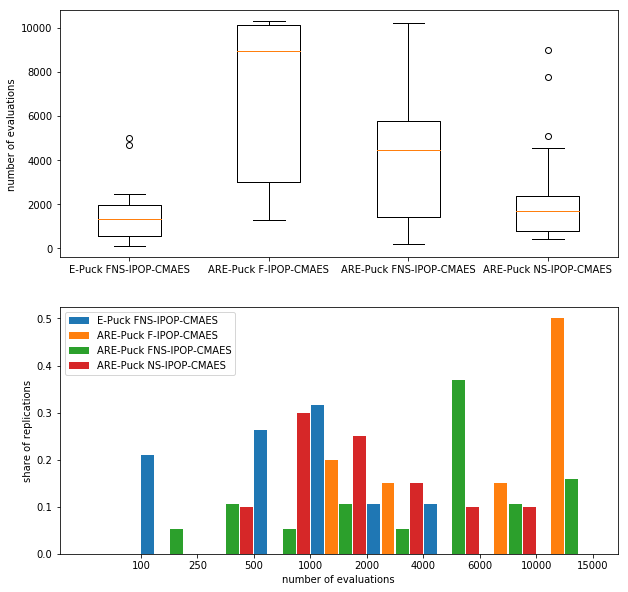

In [7]:
list_dir = ["/home/leni/are-logs/e_ipop_easy_sigma100/", \
            "/home/leni/are-logs/are_ipop_easy_fitpure_time240/", \
            "/home/leni/are-logs/are_ipop_easy_fitnov_time240/", \
            "/home/leni/are-logs/are_ipop_easy_novpure_time240/"]
list_label = ["E-Puck FNS-IPOP-CMAES","ARE-Puck F-IPOP-CMAES","ARE-Puck FNS-IPOP-CMAES","ARE-Puck NS-IPOP-CMAES"]
best_fits = []
i = 0   
nbevals = []
bins = ['100','250','500','1000','2000','4000','6000','10000','15000']
xbar = np.arange(len(bins))
width = 0.8/float(len(list_label))
fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(2,1,1)
ax2 = fig.add_subplot(2,1,2)
i = -len(list_dir)
j = 0
for dire in list_dir :
    nevals = []
    for folder in os.listdir(dire) :
        if(folder.split("_")[0] != "ipop") :
            continue
        if(not os.path.isdir(dire + folder)) :
            continue
        if(j < 1) :
            neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses_hn.csv")
        else :
            neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses.csv")
        nevals.append(neval[-1])
    print(len(nevals))
    nbevals.append(nevals)
    histo = histo_nbeval(nevals,bins)
    print(histo)
    ax2.bar(xbar + width*i,histo,width - 0.02,label=list_label[j])
    i += 1
    j += 1
    
ax2.set_xticks(xbar)
ax2.set_xticklabels(bins)
ax2.legend()
ax1.boxplot(nbevals,labels=list_label)
ax1.set_ylabel("number of evaluations")
ax2.set_xlabel("number of evaluations")
ax2.set_ylabel("share of replications")
plt.show()

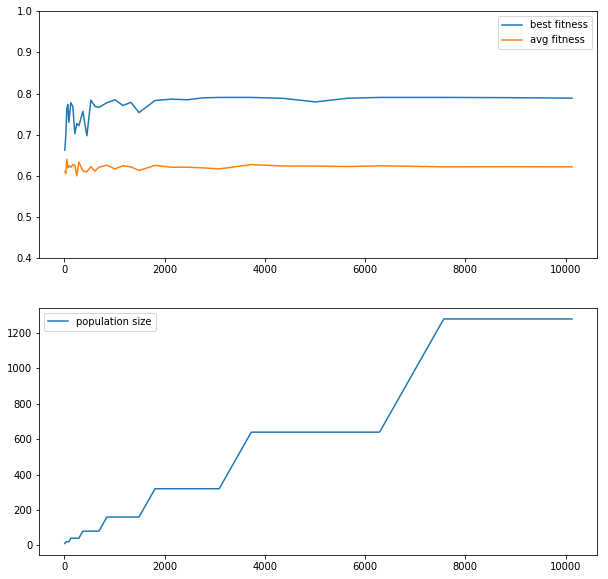

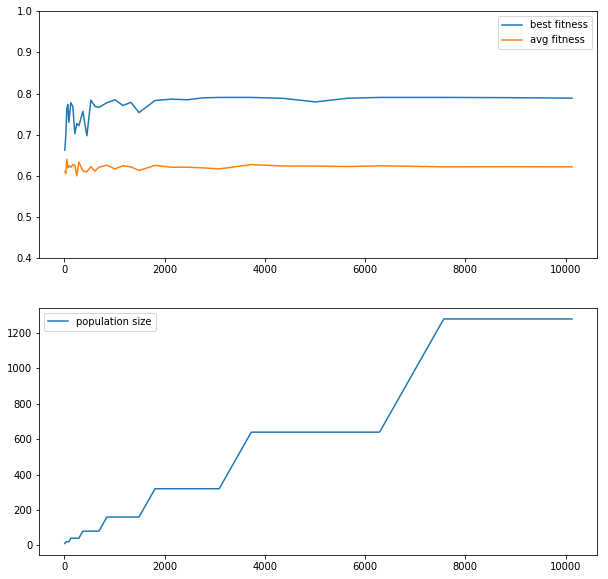

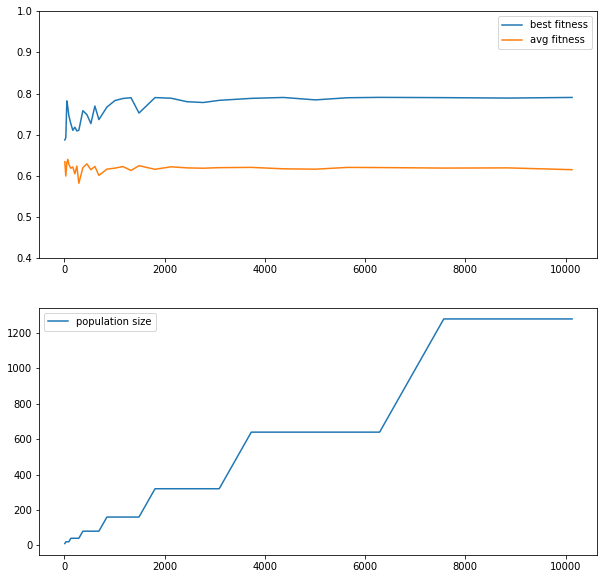

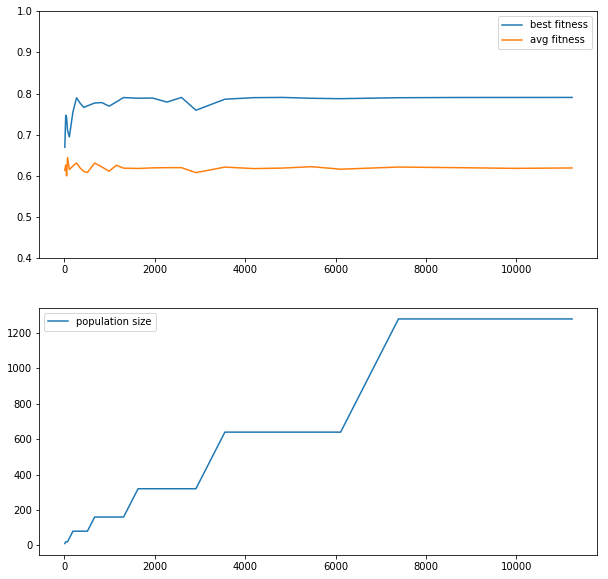

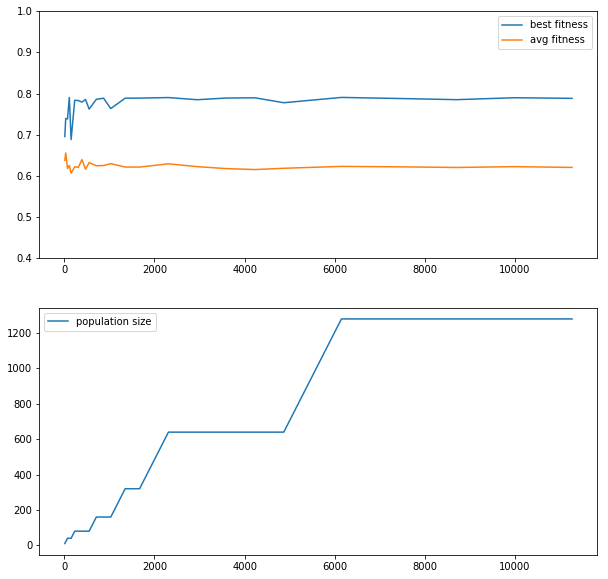

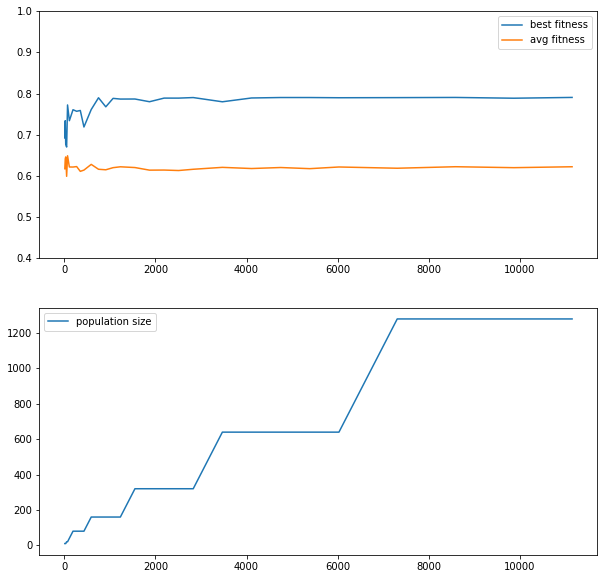

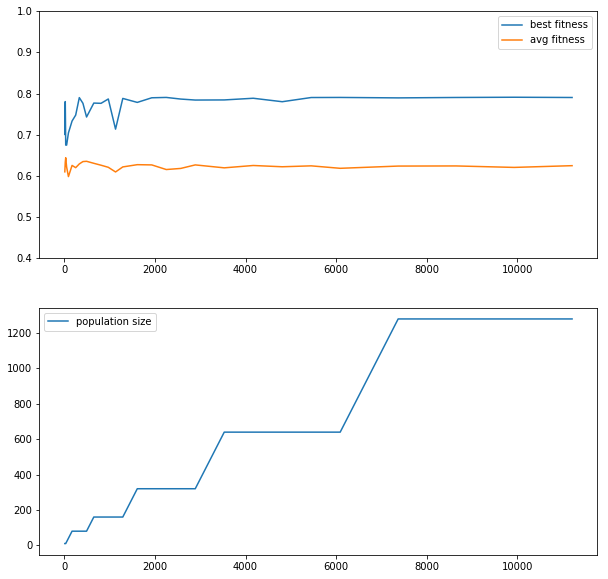

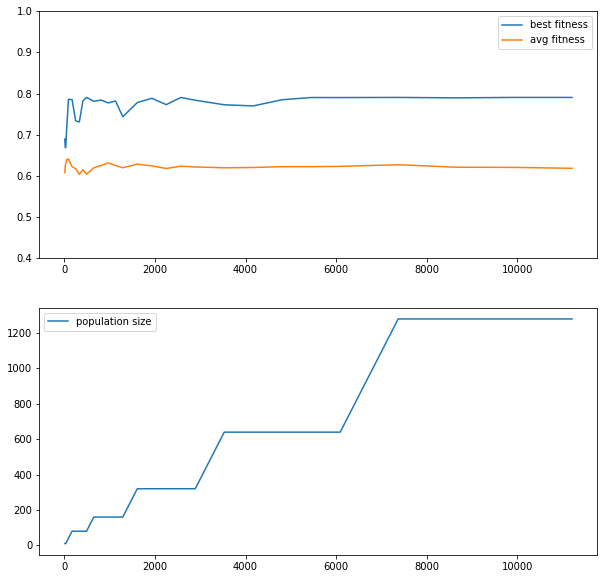

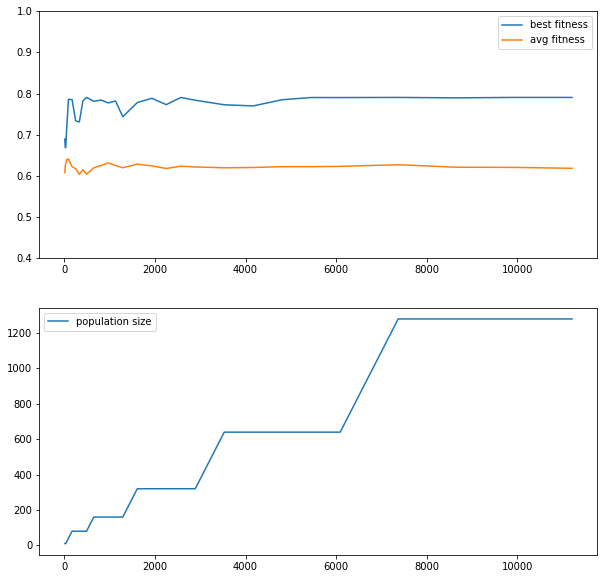

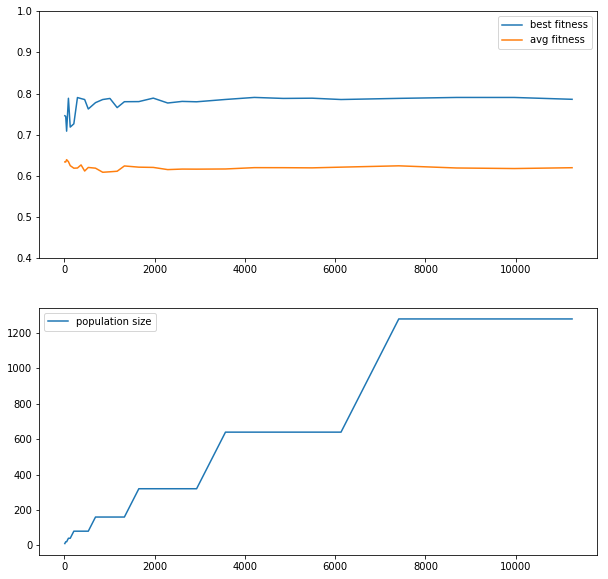

In [29]:
are_ipop_easy_nov_1 = "/home/leni/are-logs/are_ipop_easy_nov_1/"
x_vec = []
y_vec = []
for folder in os.listdir(are_ipop_easy_nov_1) :
    if(not os.path.isdir(are_ipop_easy_nov_1 + folder)) :
        continue
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_ipop_easy_nov_1 + "/" + folder + "/fitnesses_hn.csv")
    fig = plt.figure(figsize=[10,10])
    ax1 = fig.add_subplot(2,1,1)
    ax2 = fig.add_subplot(2,1,2)
    ax1.set_ylim(0.4,1)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    
    ax1.legend()
    ax2.legend()
    plt.show()
    animation_pop(are_ipop_easy_nov_1 + folder,pop_size,1)

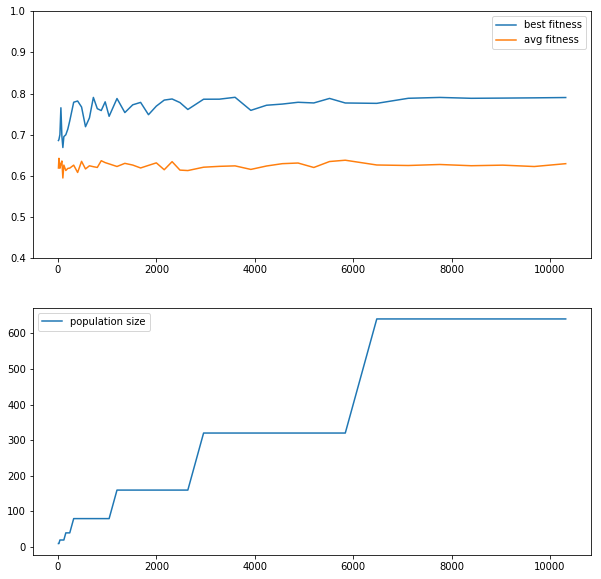

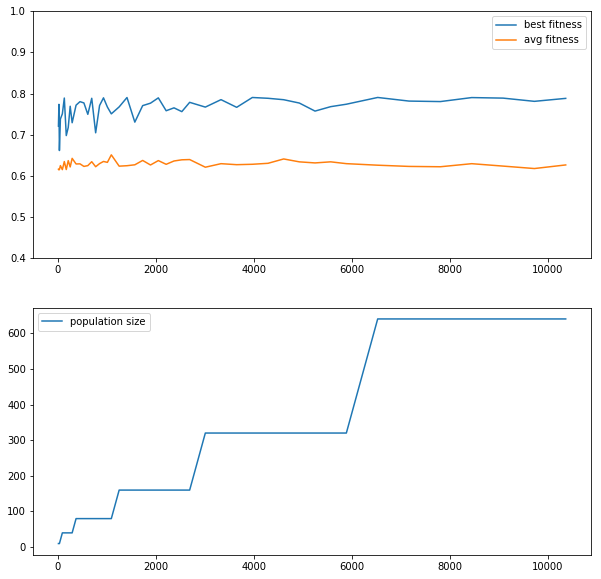

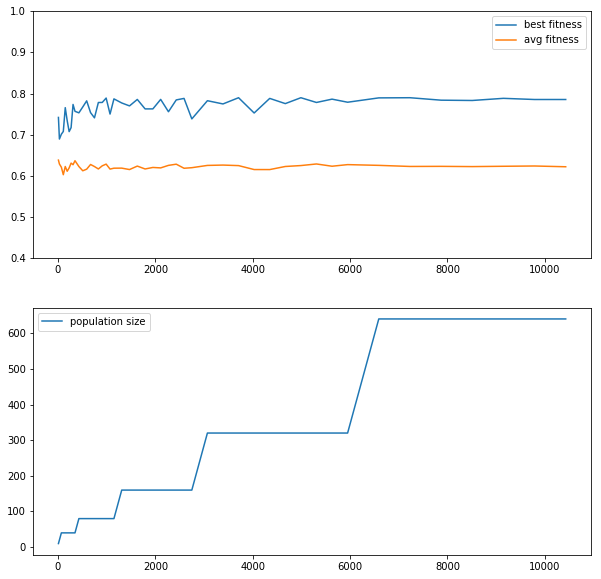

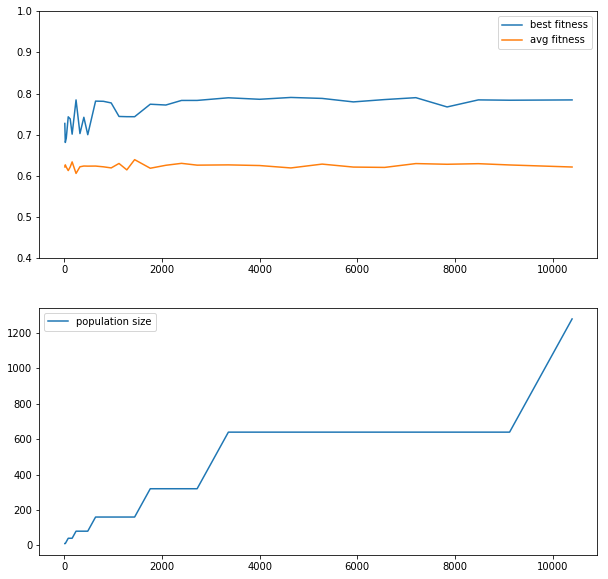

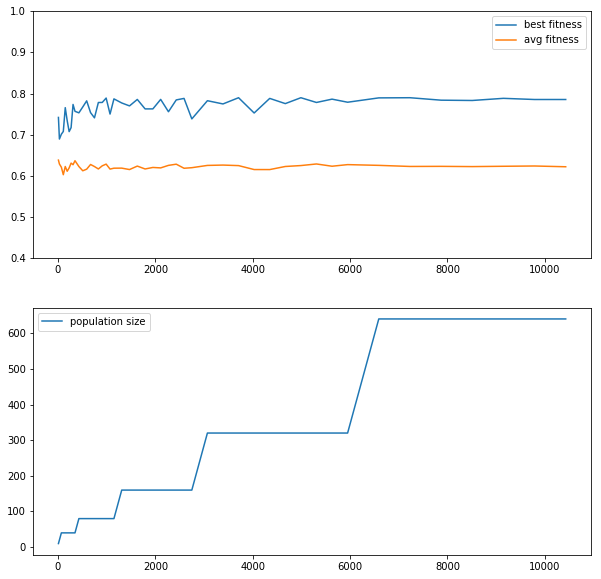

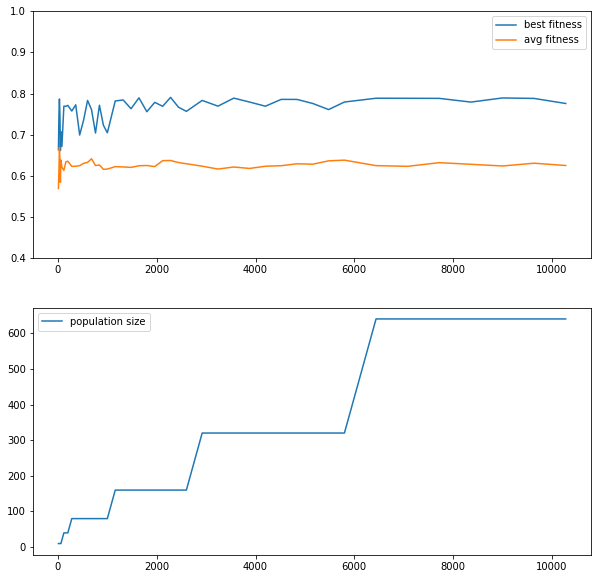

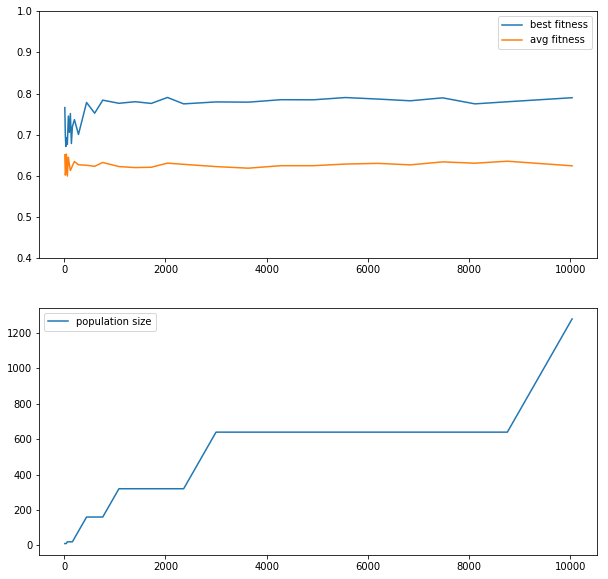

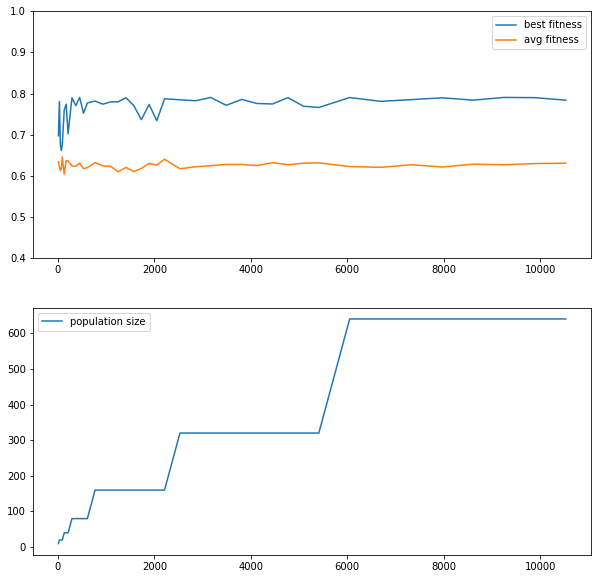

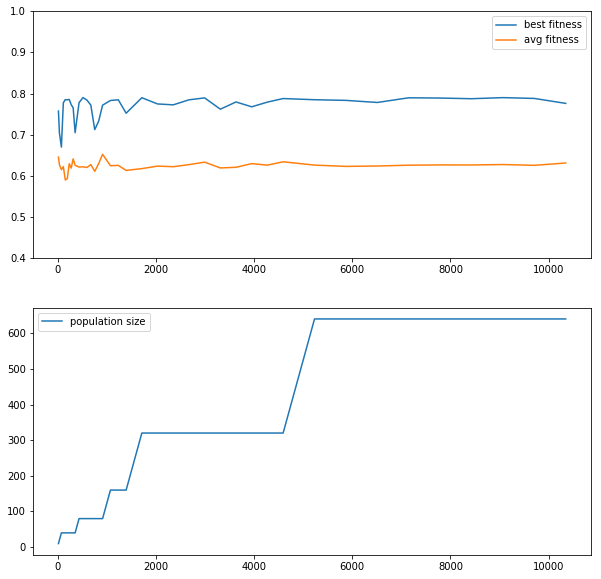

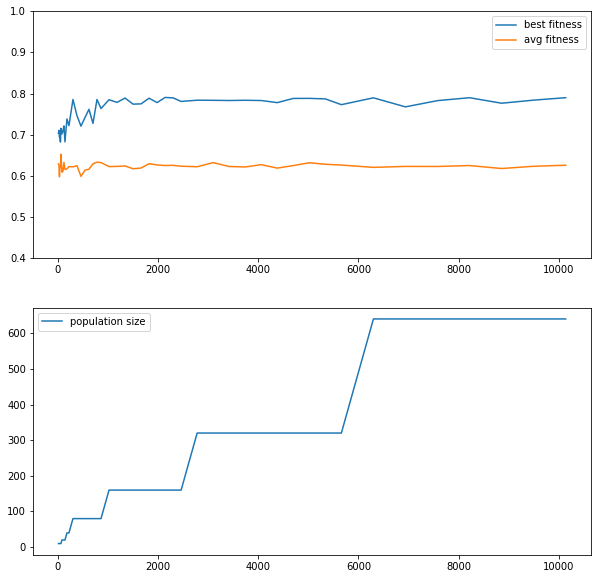

In [30]:
are_ipop_easy_nov_2 = "/home/leni/are-logs/are_ipop_easy_nov_2/"
x_vec = []
y_vec = []
for folder in os.listdir(are_ipop_easy_nov_2) :
    if(not os.path.isdir(are_ipop_easy_nov_2 + folder)) :
        continue
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_ipop_easy_nov_2 + folder + "/fitnesses_hn.csv")
    fig = plt.figure(figsize=[10,10])
    ax1 = fig.add_subplot(2,1,1)
    ax2 = fig.add_subplot(2,1,2)
    ax1.set_ylim(0.4,1)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    
    
    ax1.legend()
    ax2.legend()
    plt.show()
    animation_pop(are_ipop_easy_nov_2 + folder,pop_size,1)

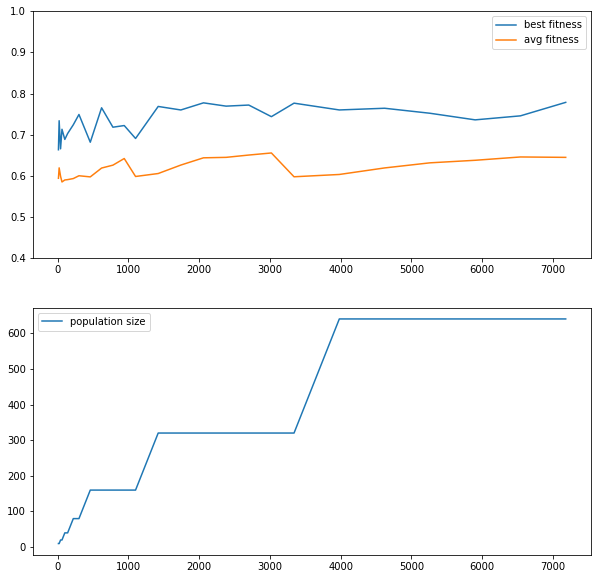

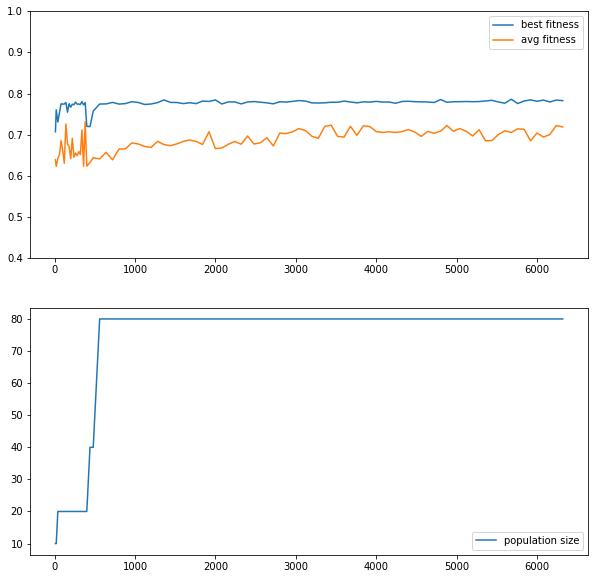

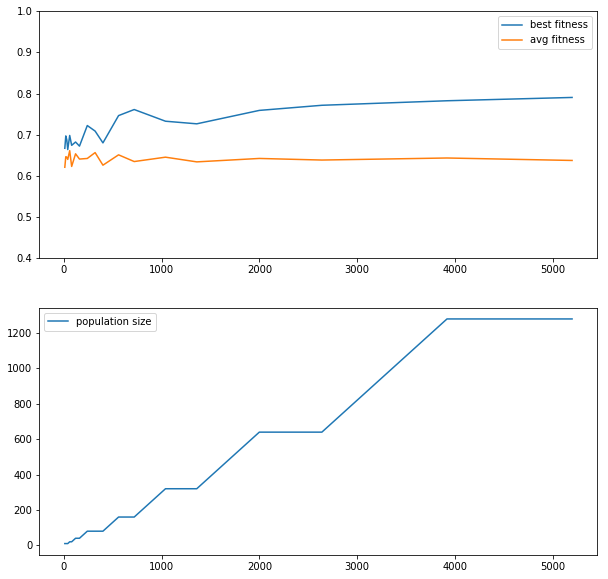

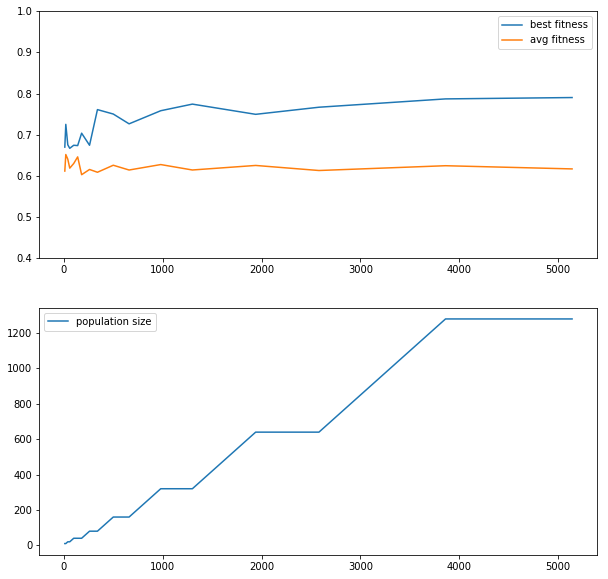

In [38]:
are_ipop_easy_1 = "/home/leni/are-logs/are_ipop_easy_1/"
x_vec = []
y_vec = []
for folder in os.listdir(are_ipop_easy_1) :
    if(not os.path.isdir(are_ipop_easy_1 + folder)) :
        continue
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_ipop_easy_1 + folder + "/fitnesses_hn.csv")
    fig = plt.figure(figsize=[10,10])
    ax1 = fig.add_subplot(2,1,1)
    ax2 = fig.add_subplot(2,1,2)
    ax1.set_ylim(0.4,1)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    
    
    ax1.legend()
    ax2.legend()
    plt.show()
    animation_pop(are_ipop_easy_1 + folder,pop_size,1)

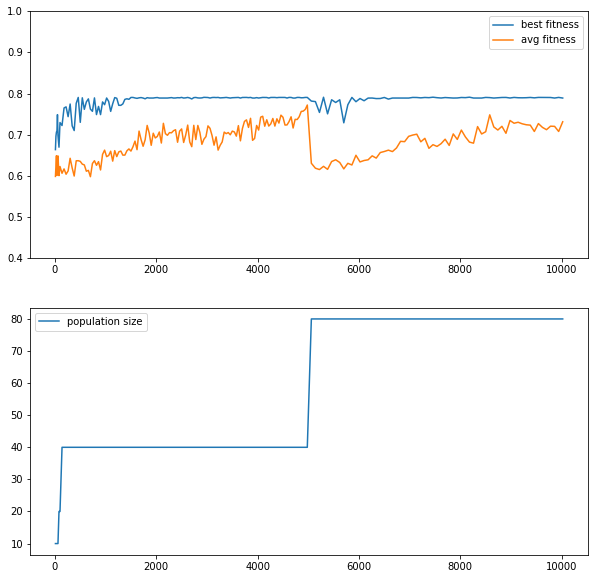

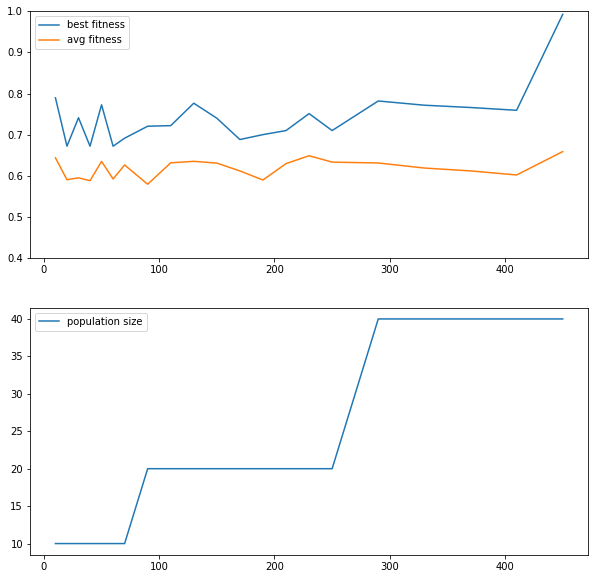

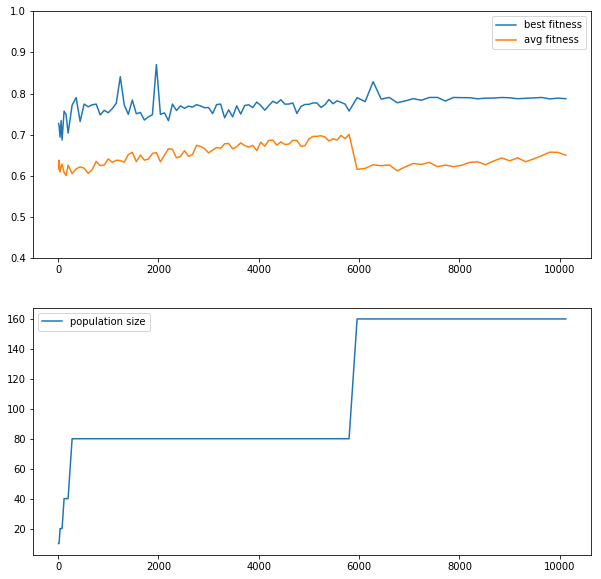

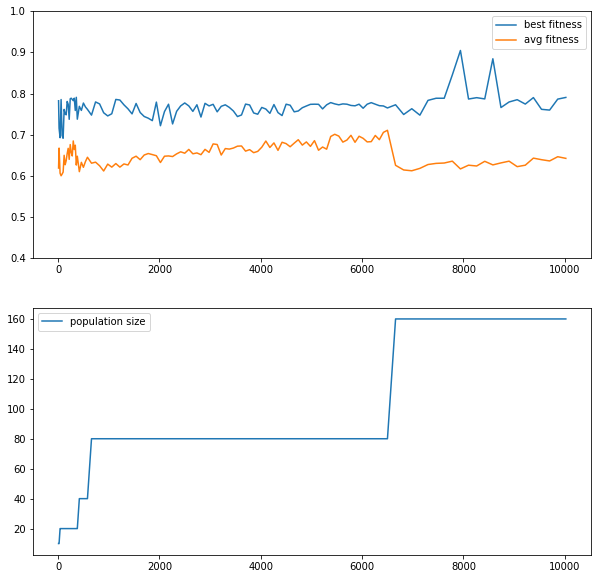

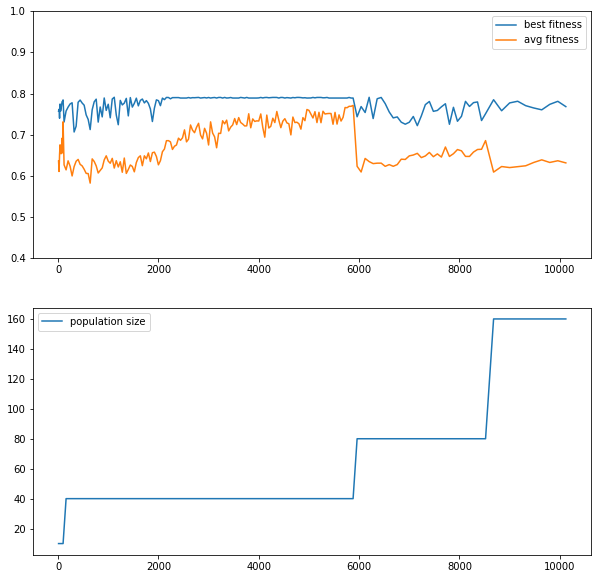

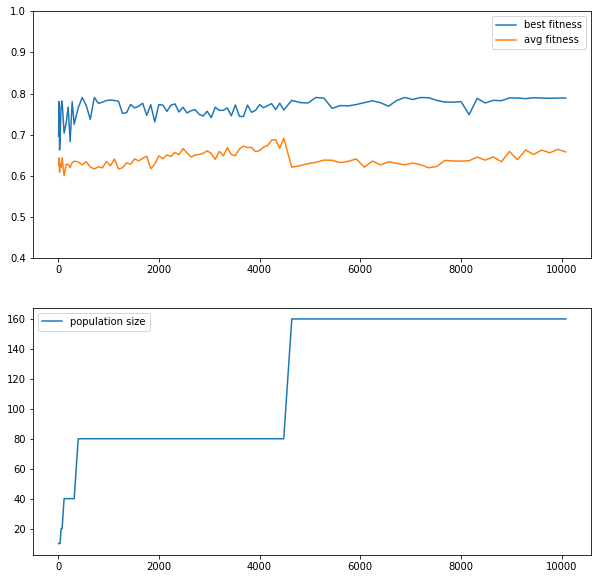

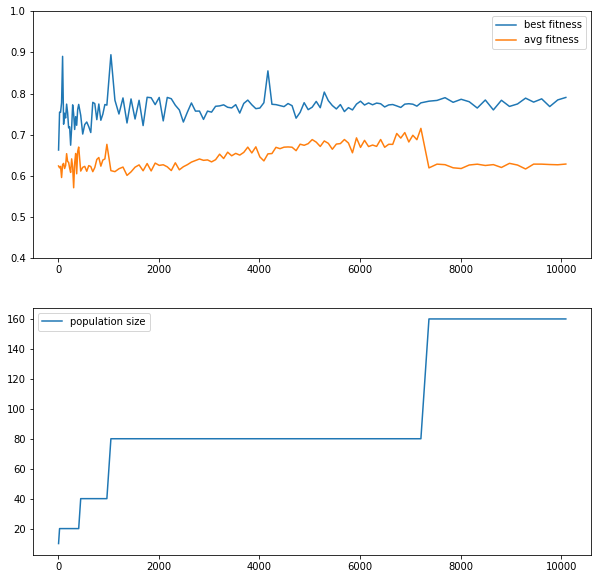

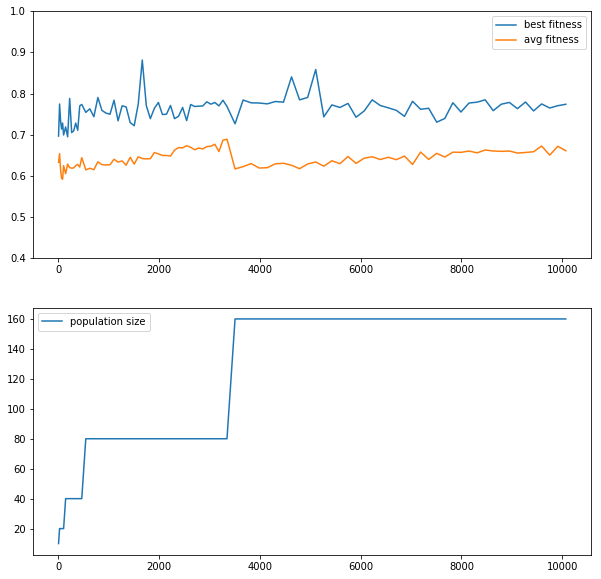

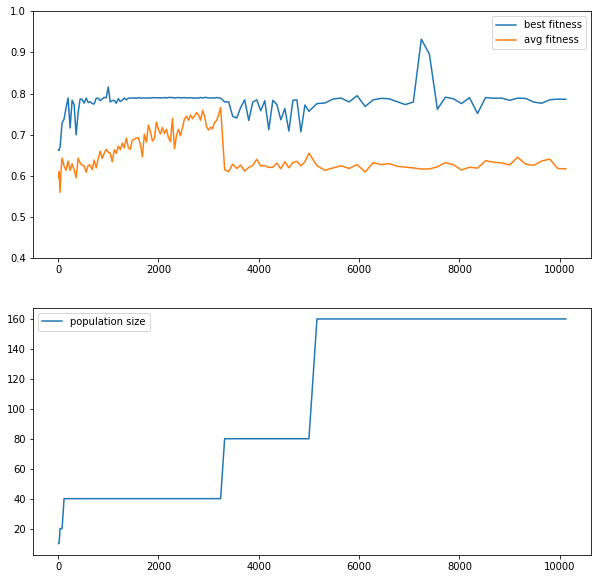

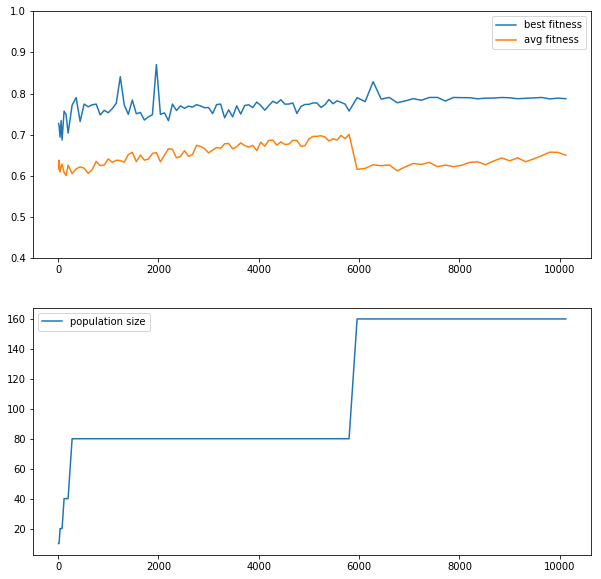

In [12]:
are_ipop_easy_nov_180 = "/home/leni/are-logs/are_ipop_easy_nov_180/"
x_vec = []
y_vec = []
for folder in os.listdir(are_ipop_easy_nov_180) :
    if(not os.path.isdir(are_ipop_easy_nov_180 + folder)) :
        continue
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_ipop_easy_nov_180 + folder + "/fitnesses_hn.csv")
    fig = plt.figure(figsize=[10,10])
    ax1 = fig.add_subplot(2,1,1)
    ax2 = fig.add_subplot(2,1,2)
    ax1.set_ylim(0.4,1)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    
    
    ax1.legend()
    ax2.legend()
    plt.show()
    animation_pop(are_ipop_easy_nov_180 + folder,pop_size,1)

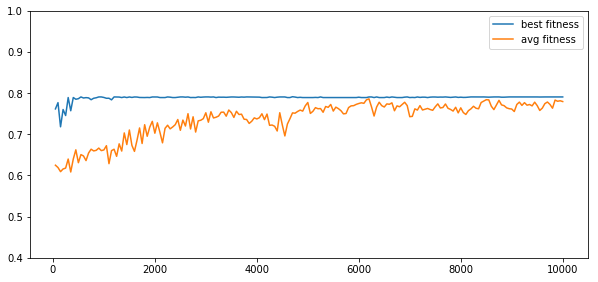

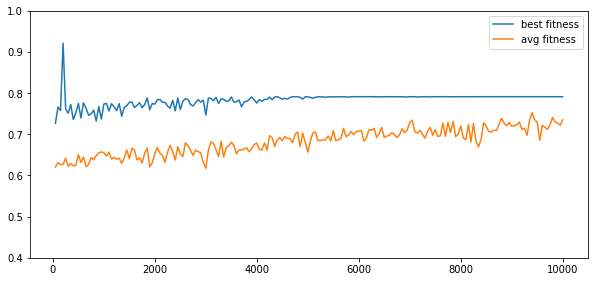

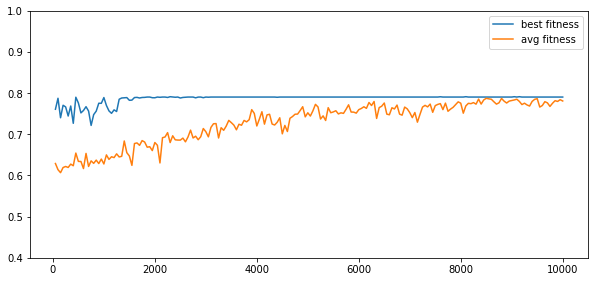

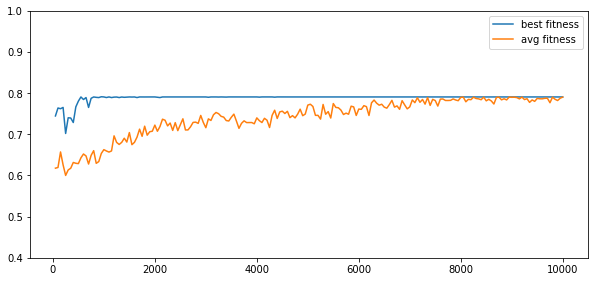

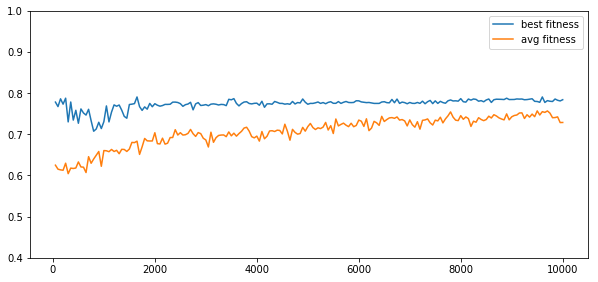

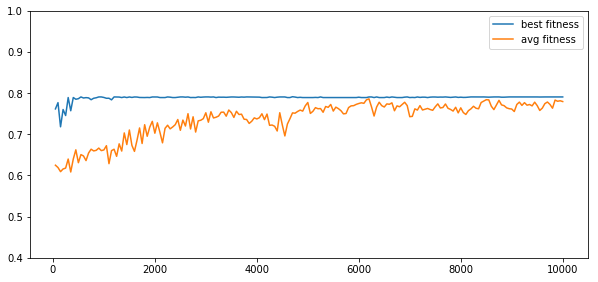

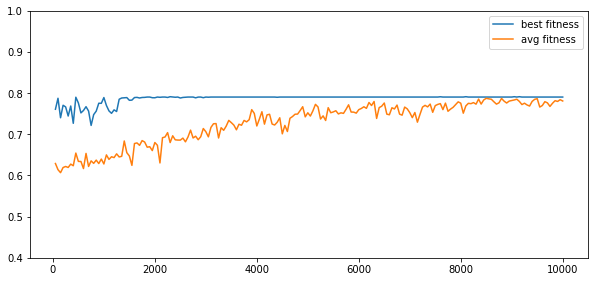

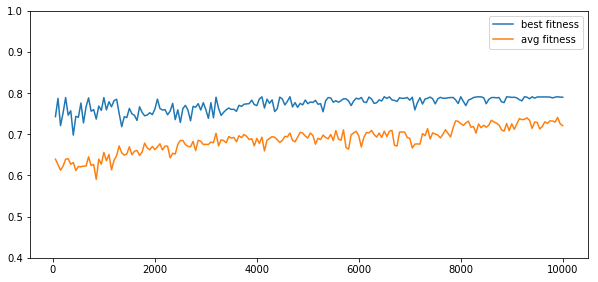

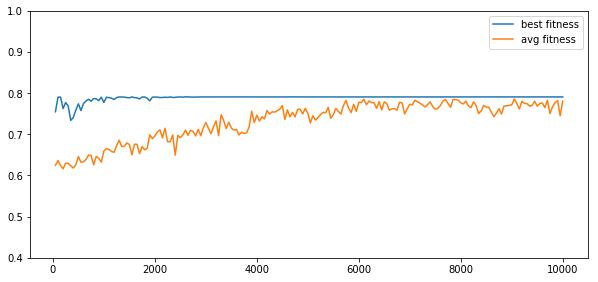

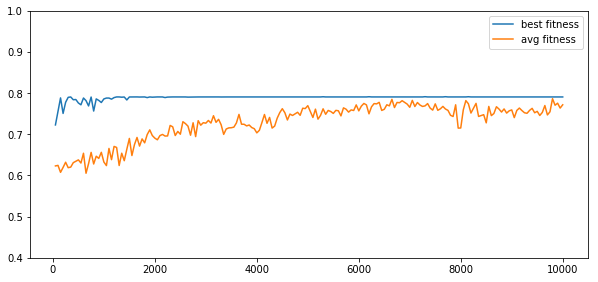

In [16]:
are_ipop_easy_nov_norestart_180 = "/home/leni/are-logs/are_ipop_easy_nov_norestart_180/"
x_vec = []
y_vec = []
for folder in os.listdir(are_ipop_easy_nov_norestart_180) :
    if(not os.path.isdir(are_ipop_easy_nov_norestart_180 + folder)) :
        continue
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_ipop_easy_nov_norestart_180 + folder + "/fitnesses_hn.csv")
    fig = plt.figure(figsize=[10,10])
    ax1 = fig.add_subplot(2,1,1)
    ax1.set_ylim(0.4,1)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    
    
    ax1.legend()
    plt.show()
    animation_pop(are_ipop_easy_nov_norestart_180 + folder,pop_size,1)

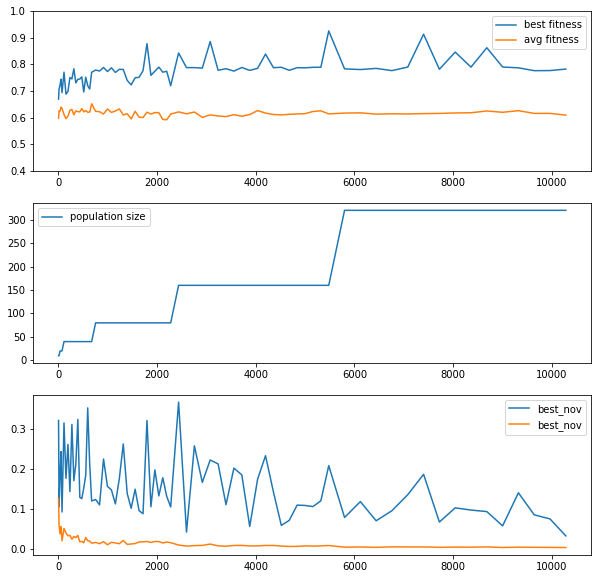

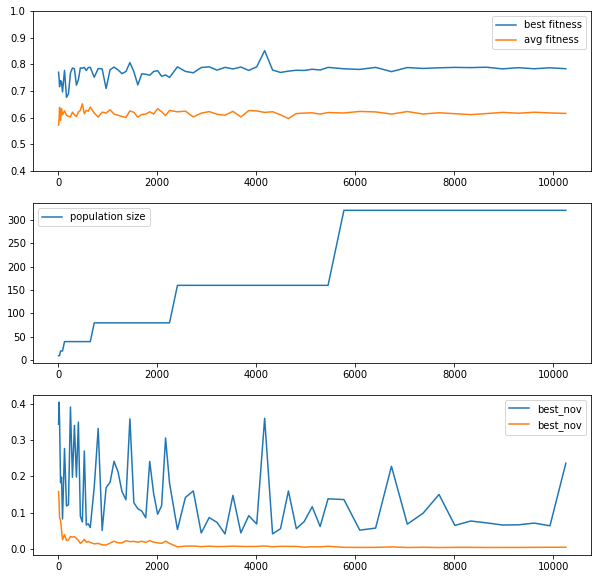

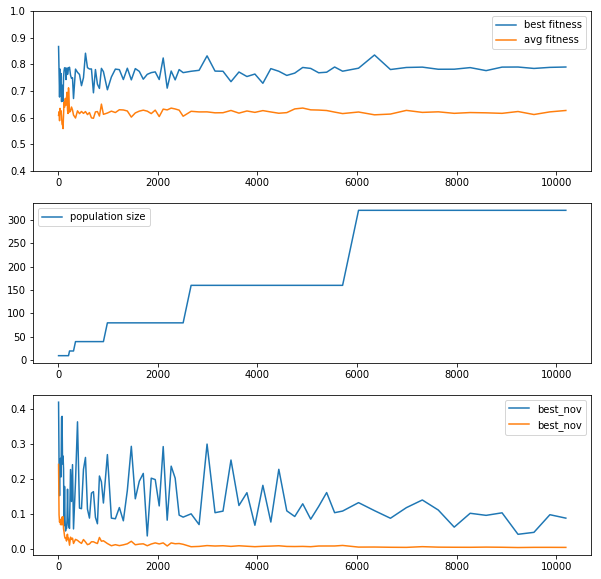

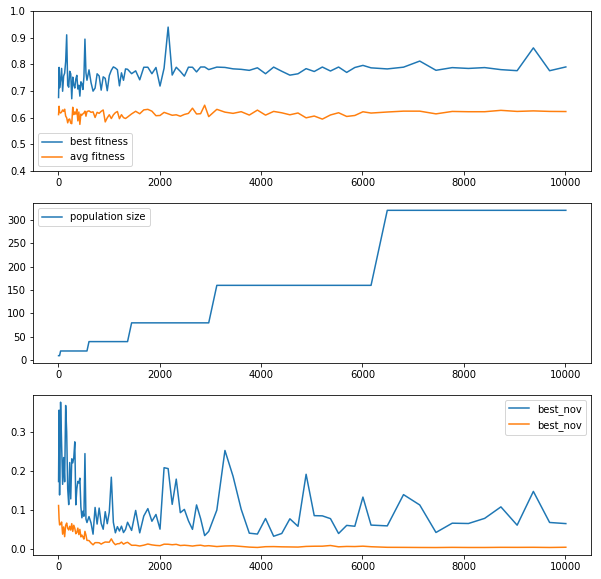

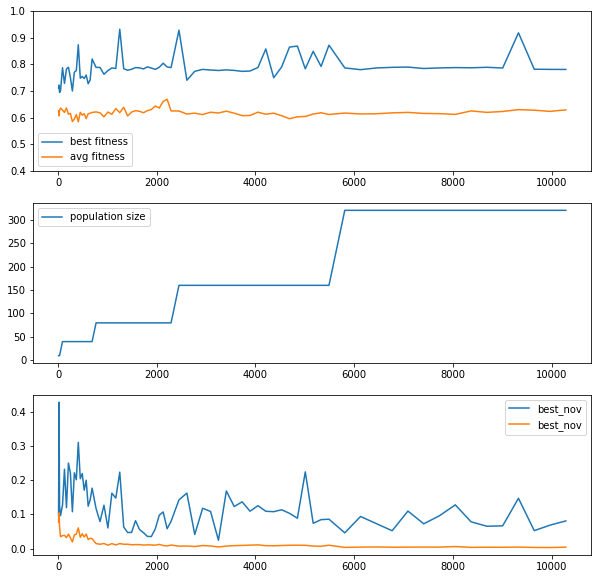

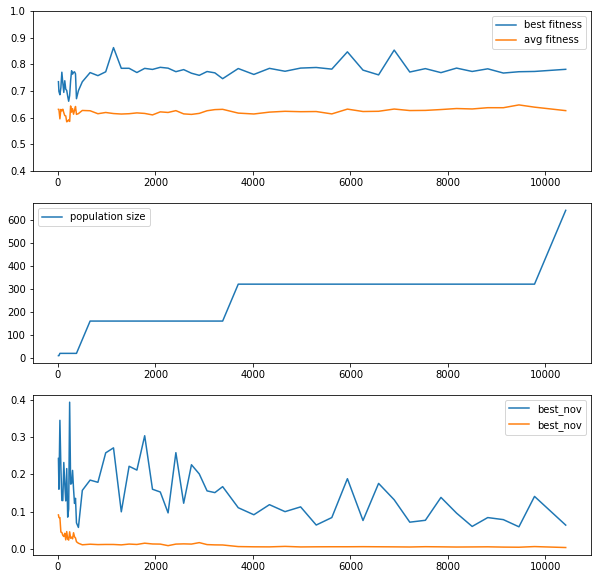

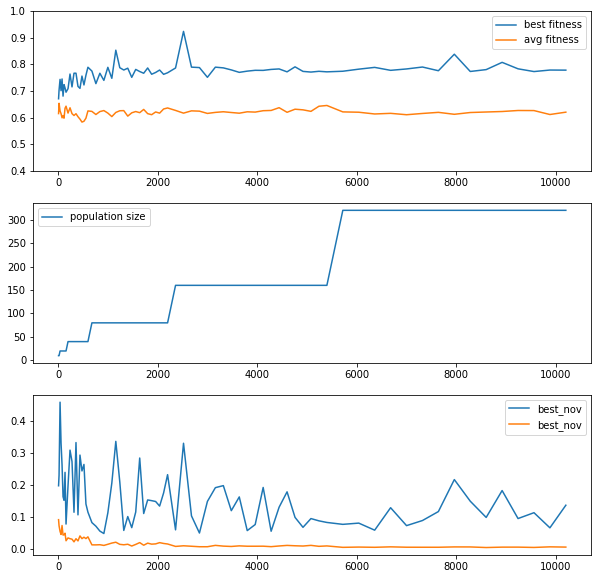

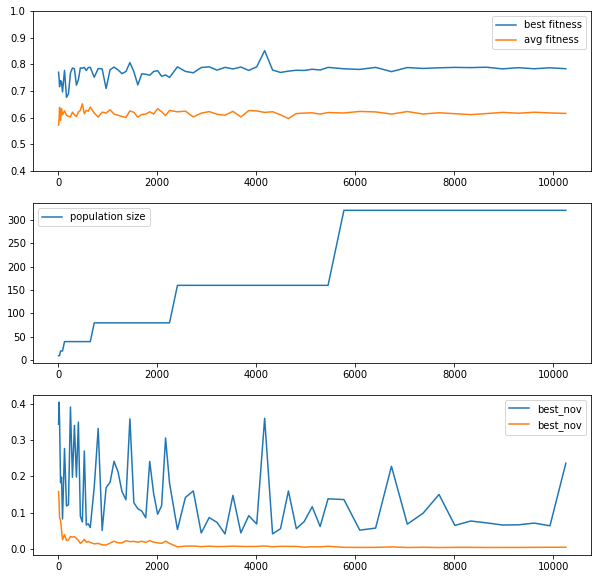

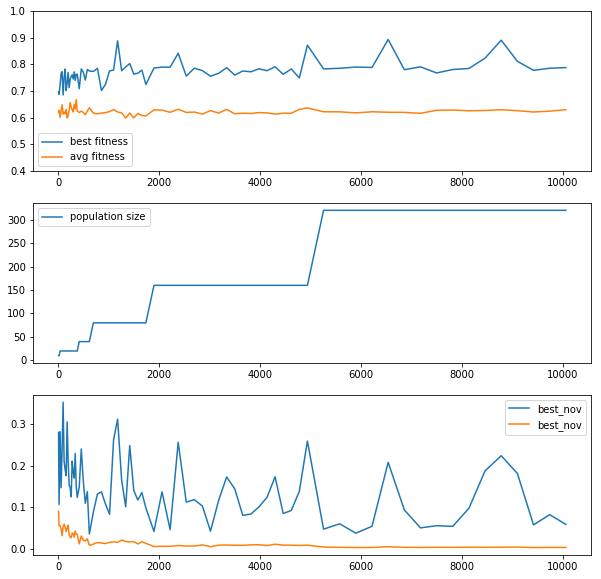

In [11]:
are_ipop_easy_nov = "/home/leni/are-logs/are_ipop_easy_nov/"
x_vec = []
y_vec = []
for folder in os.listdir(are_ipop_easy_nov) :
    if(not os.path.isdir(are_ipop_easy_nov + folder)) :
        continue
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_ipop_easy_nov + folder + "/fitnesses_hn.csv")
    neval, best_nov, avg_nov,pop_size = load_all_fitnesses(are_ipop_easy_nov + folder + "/novelty.csv")
    fig = plt.figure(figsize=[10,10])
    ax1 = fig.add_subplot(3,1,1)
    ax2 = fig.add_subplot(3,1,2)
    ax3 = fig.add_subplot(3,1,3)
    ax1.set_ylim(0.4,1)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    ax3.plot(neval,best_nov,label="best_nov")
    ax3.plot(neval,avg_nov,label="avg_nov")


    
    ax1.legend()
    ax2.legend()
    ax3.legend()
    plt.show()
    animation_pop(are_ipop_easy_nov + folder,pop_size,1)

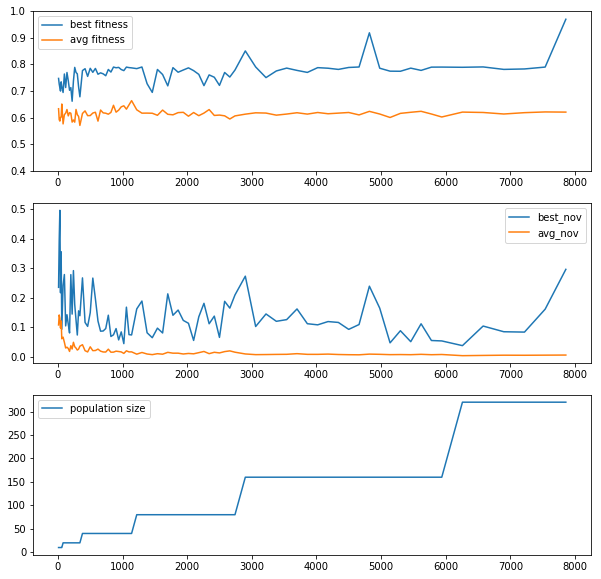

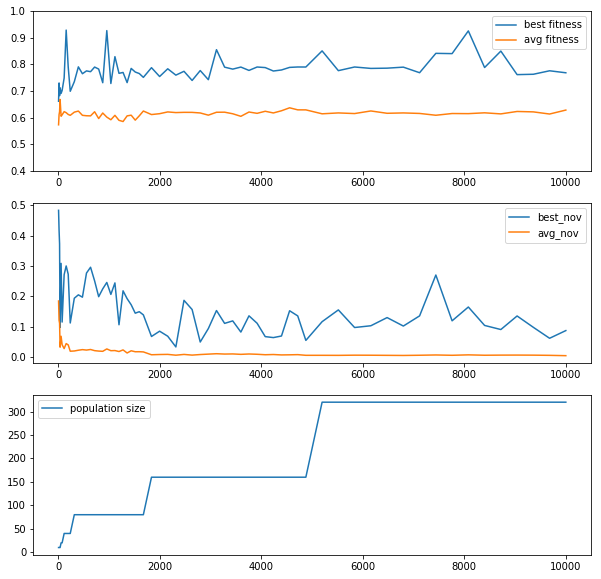

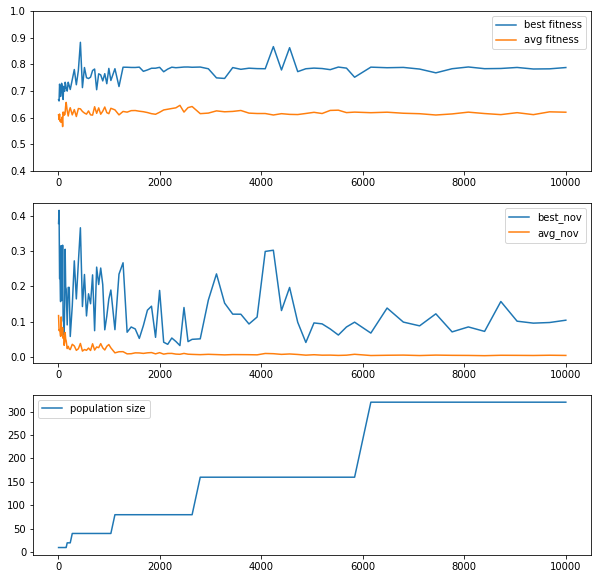

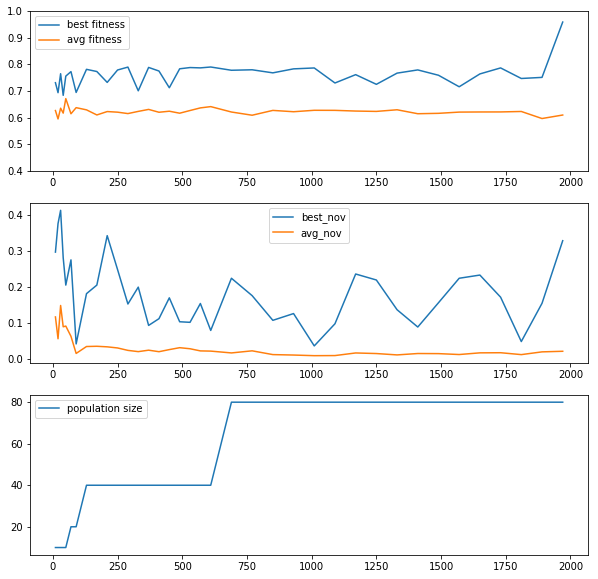

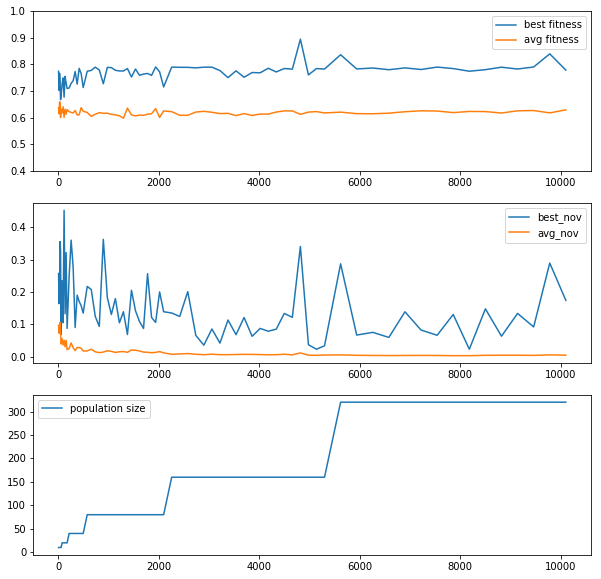

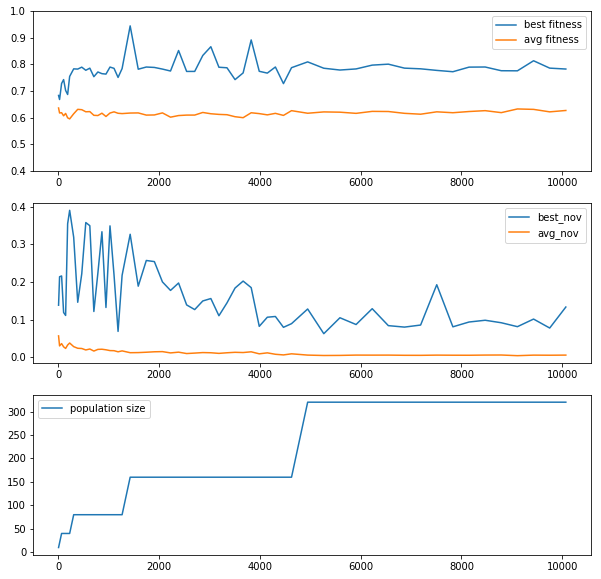

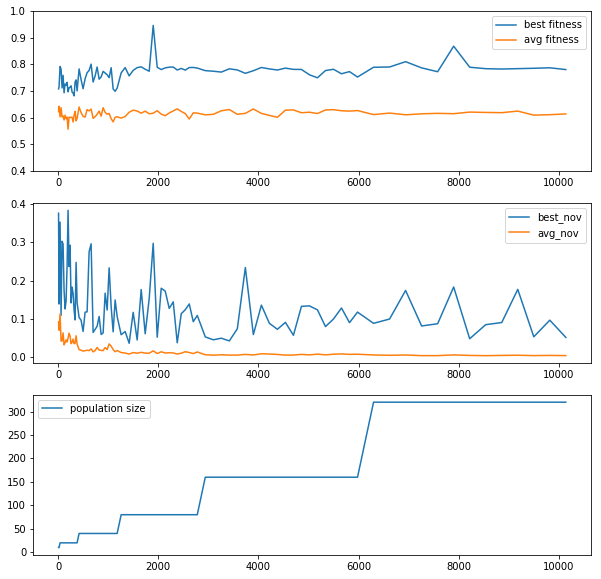

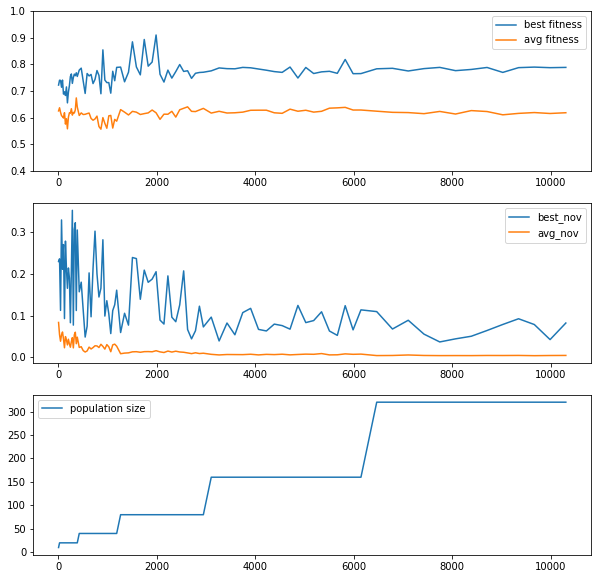

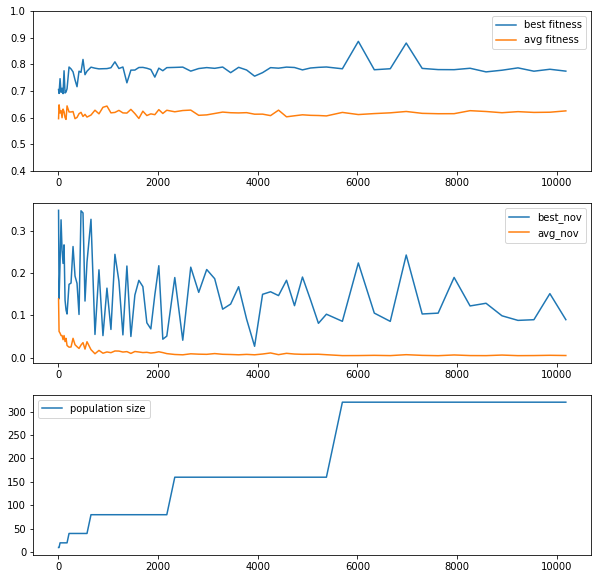

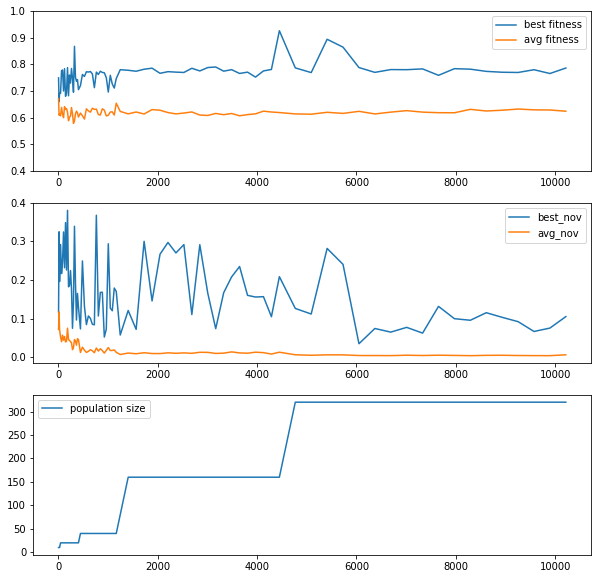

In [3]:
are_ipop_easy_sigma20 = "/home/leni/are-logs/are_ipop_easy_sigma20/"
x_vec = []
y_vec = []
for folder in os.listdir(are_ipop_easy_sigma20) :
    if(not os.path.isdir(are_ipop_easy_sigma20 + folder)) :
        continue
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_ipop_easy_sigma20 + folder + "/fitnesses_hn.csv")
    neval, best_nov, avg_nov,pop_size = load_all_fitnesses(are_ipop_easy_sigma20 + folder + "/novelty.csv")
    fig = plt.figure(figsize=[10,10])
    ax1 = fig.add_subplot(3,1,1)
    ax2 = fig.add_subplot(3,1,3)
    ax3 = fig.add_subplot(3,1,2)
    ax1.set_ylim(0.4,1)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    ax3.plot(neval,best_nov,label="best_nov")
    ax3.plot(neval,avg_nov,label="avg_nov")


    
    ax1.legend()
    ax2.legend()
    ax3.legend()
    plt.show()
    animation_pop(are_ipop_easy_sigma20 + folder,pop_size,1)

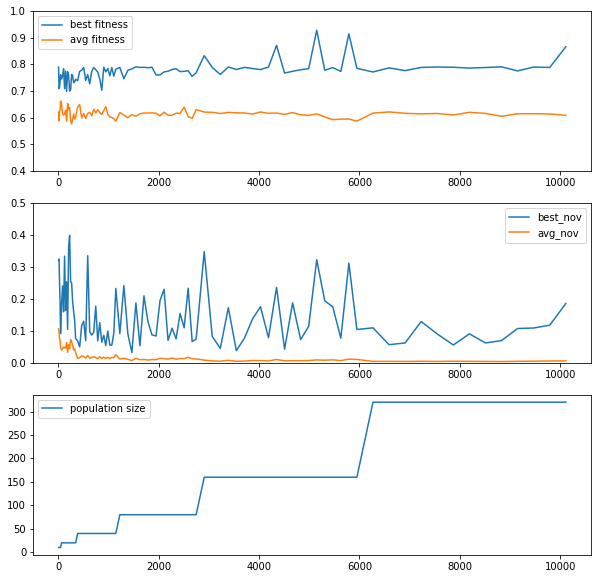

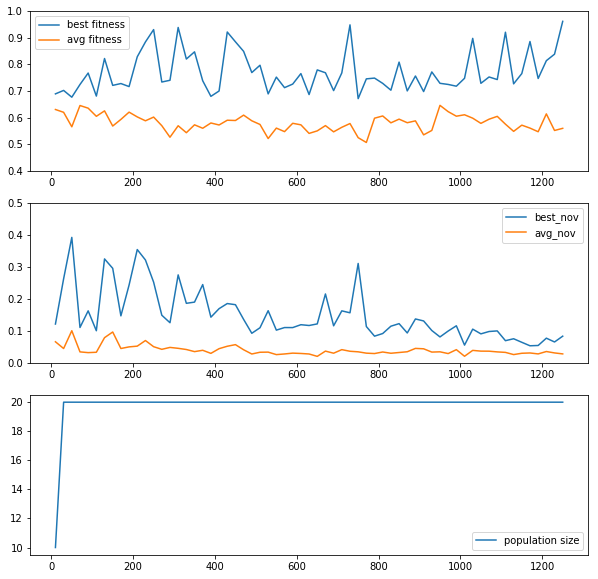

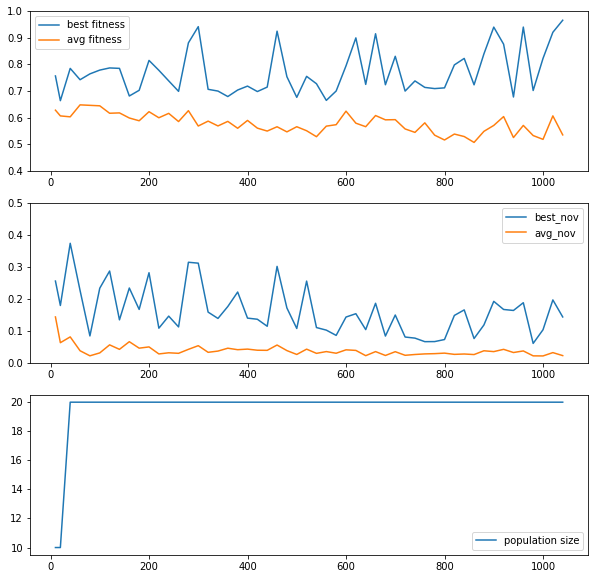

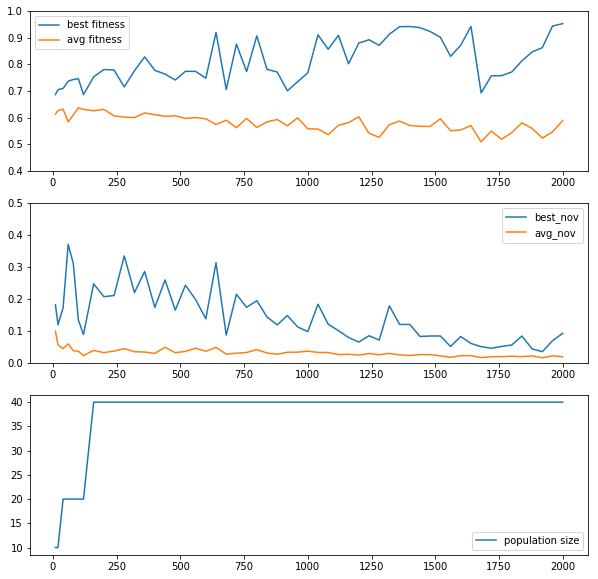

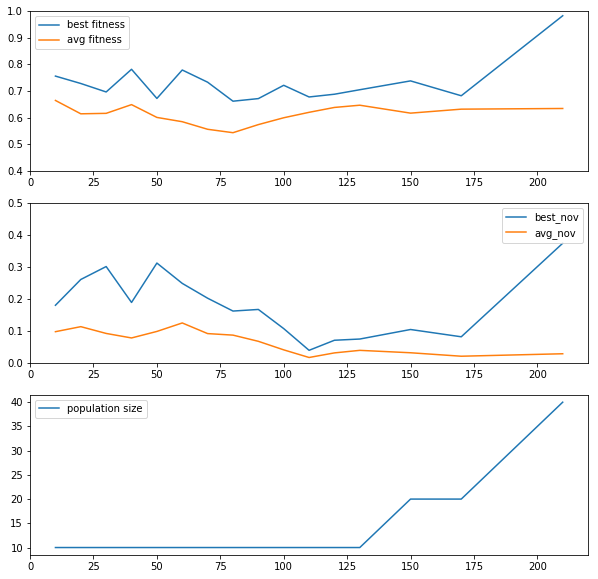

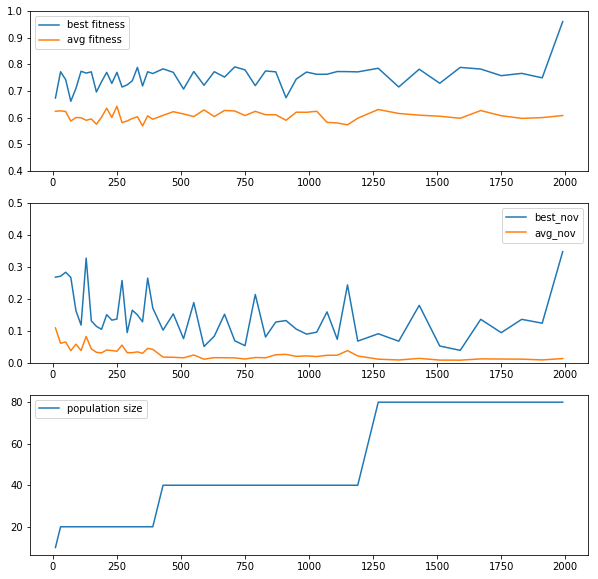

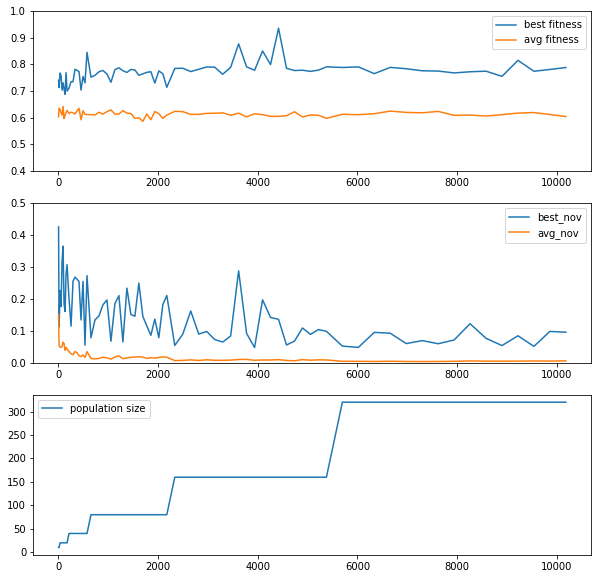

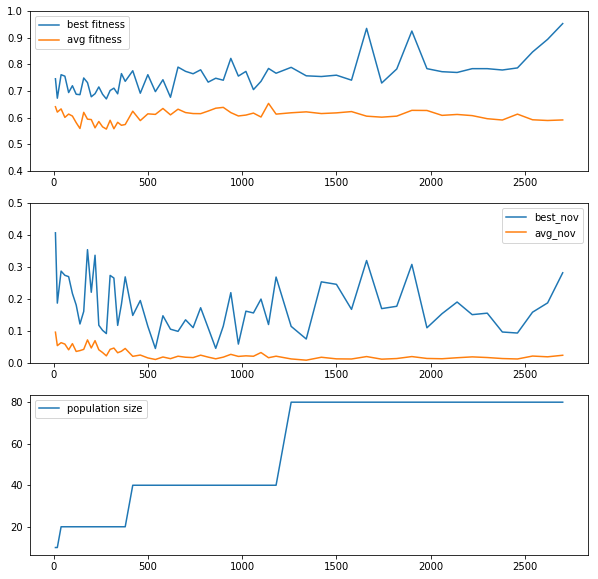

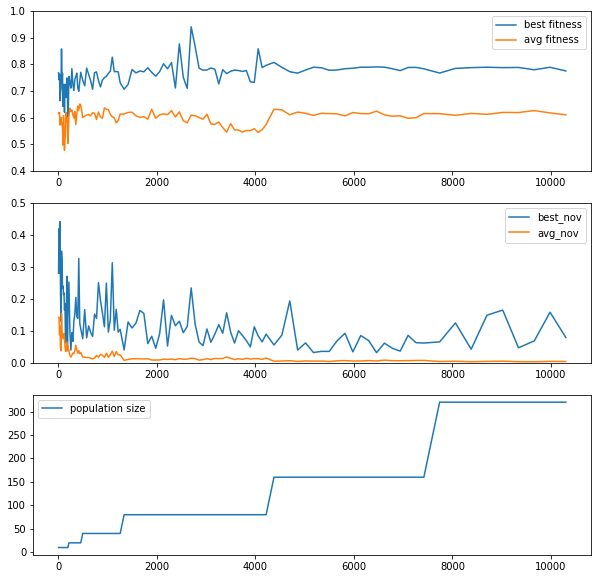

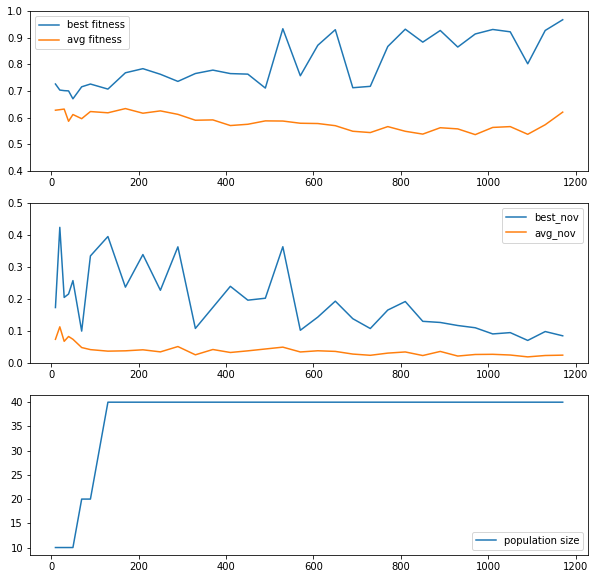

In [40]:
are_ipop_easy_novpure_sigma20 = "/home/leni/are-logs/are_ipop_easy_novpure_sigma20/"
x_vec = []
y_vec = []
for folder in os.listdir(are_ipop_easy_novpure_sigma20) :
    if(not os.path.isdir(are_ipop_easy_novpure_sigma20 + folder)) :
        continue
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_ipop_easy_novpure_sigma20 + folder + "/fitnesses_hn.csv")
    neval, best_nov, avg_nov,pop_size = load_all_fitnesses(are_ipop_easy_novpure_sigma20 + folder + "/novelty.csv")
    fig = plt.figure(figsize=[10,10])
    ax1 = fig.add_subplot(3,1,1)
    ax2 = fig.add_subplot(3,1,3)
    ax3 = fig.add_subplot(3,1,2)
    ax1.set_ylim(0.4,1)
    ax3.set_ylim(0.0,0.5)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    ax3.plot(neval,best_nov,label="best_nov")
    ax3.plot(neval,avg_nov,label="avg_nov")


    
    ax1.legend()
    ax2.legend()
    ax3.legend()
    plt.show()
    animation_pop(are_ipop_easy_novpure_sigma20 + folder,pop_size,1)

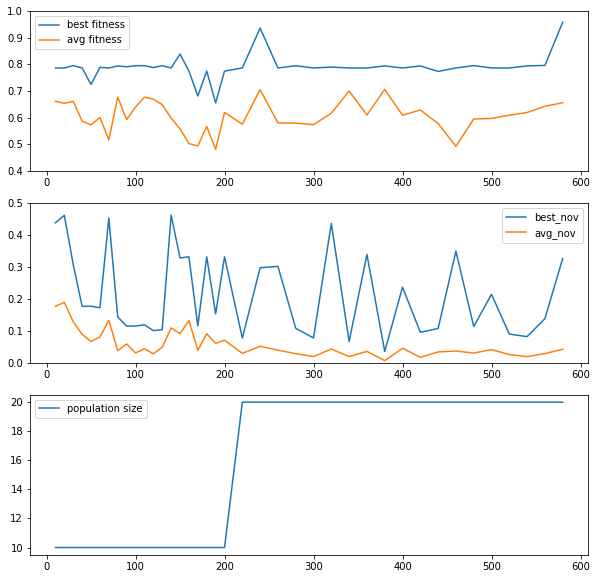

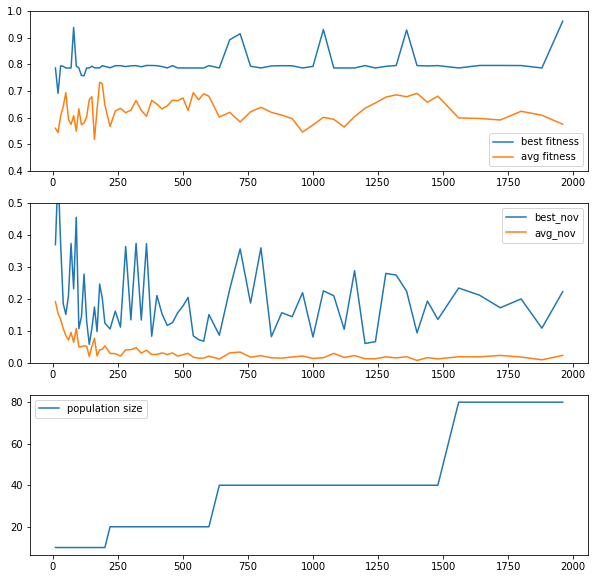

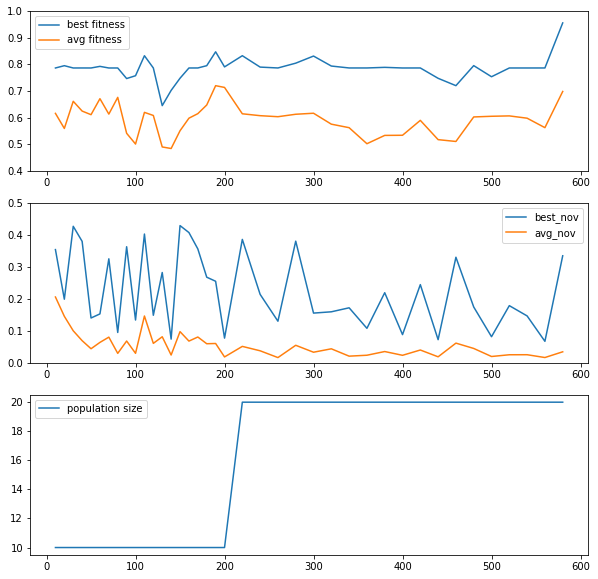

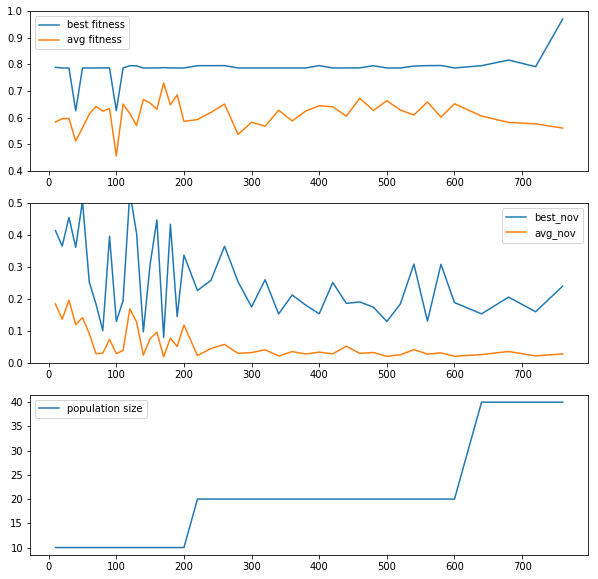

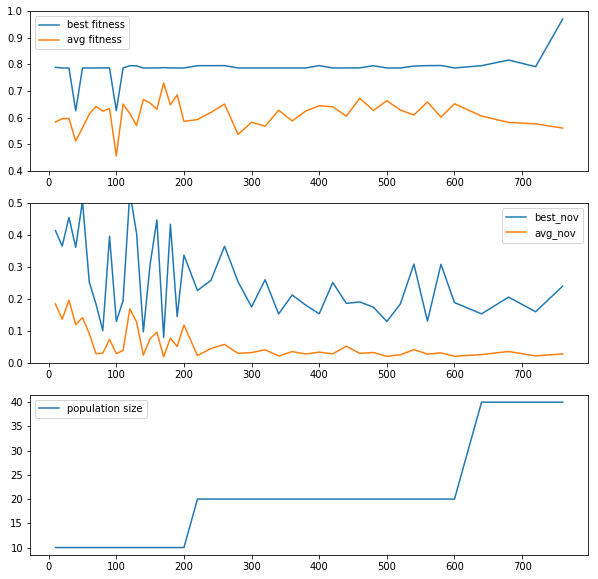

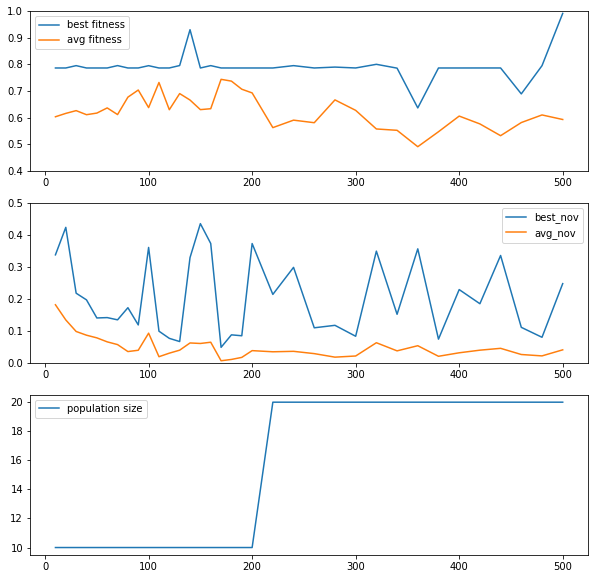

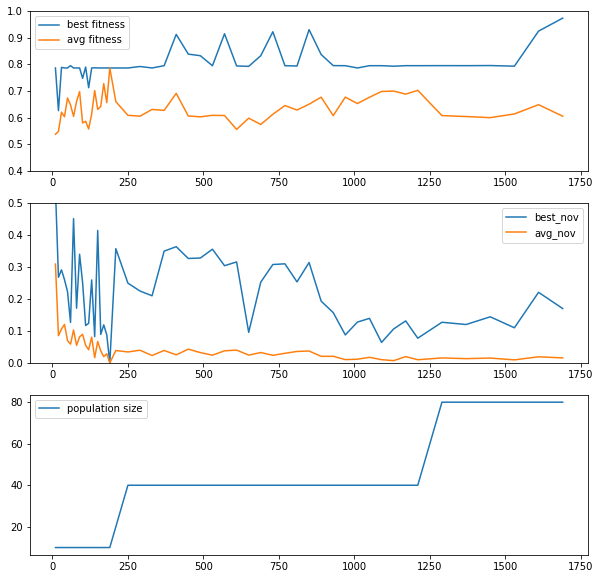

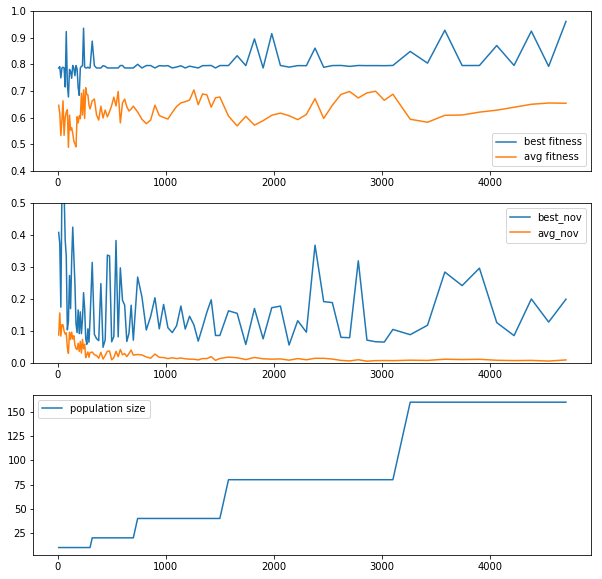

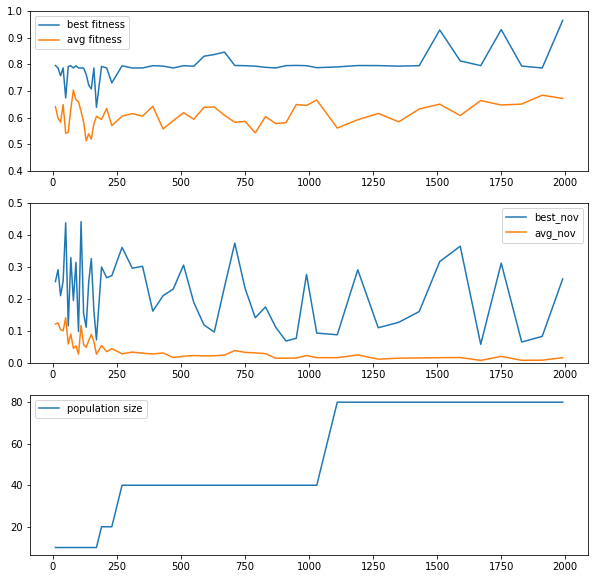

In [49]:
e_ipop_easy_sigma100 = "/home/leni/are-logs/e_ipop_easy_sigma100/"
x_vec = []
y_vec = []
for folder in os.listdir(e_ipop_easy_sigma100) :
    if(not os.path.isdir(e_ipop_easy_sigma100 + folder)) :
        continue
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(e_ipop_easy_sigma100 + folder + "/fitnesses_hn.csv")
    neval, best_nov, avg_nov,pop_size = load_all_fitnesses(e_ipop_easy_sigma100 + folder + "/novelty.csv")
    fig = plt.figure(figsize=[10,10])
    ax1 = fig.add_subplot(3,1,1)
    ax2 = fig.add_subplot(3,1,3)
    ax3 = fig.add_subplot(3,1,2)
    ax1.set_ylim(0.4,1)
    ax3.set_ylim(0.0,0.5)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    ax3.plot(neval,best_nov,label="best_nov")
    ax3.plot(neval,avg_nov,label="avg_nov")


    
    ax1.legend()
    ax2.legend()
    ax3.legend()
    plt.show()
    animation_pop(e_ipop_easy_sigma100 + folder,pop_size,1)

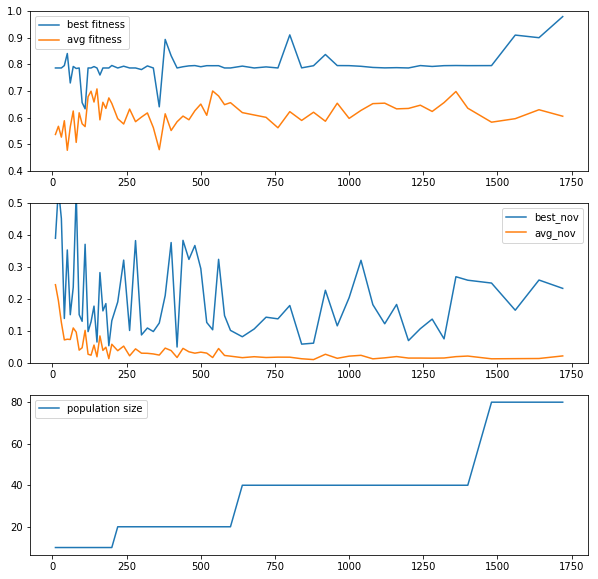

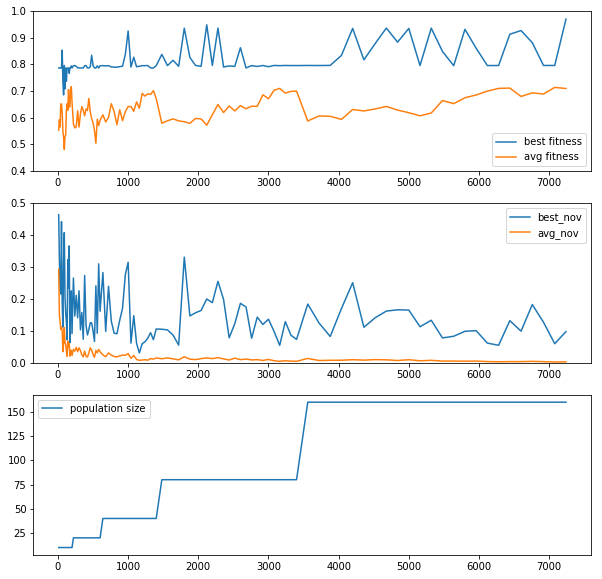

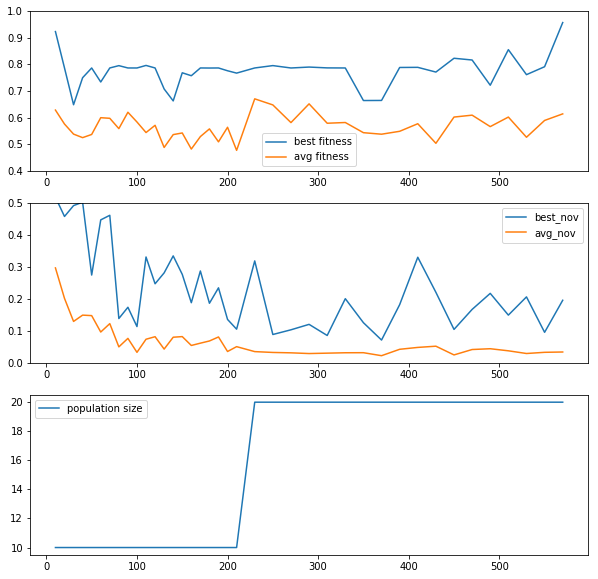

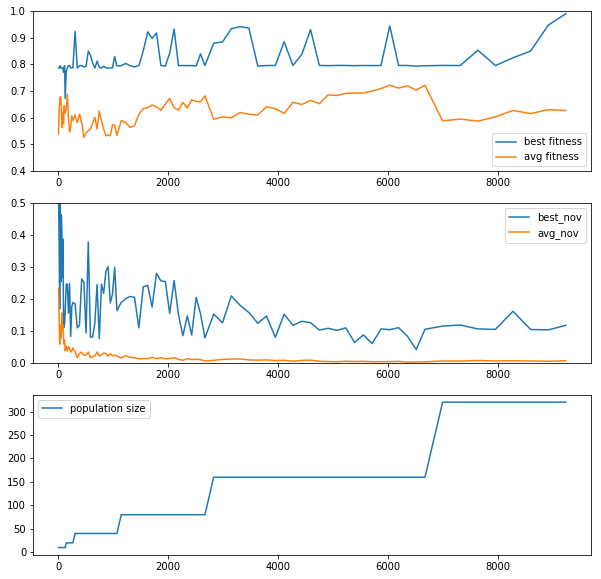

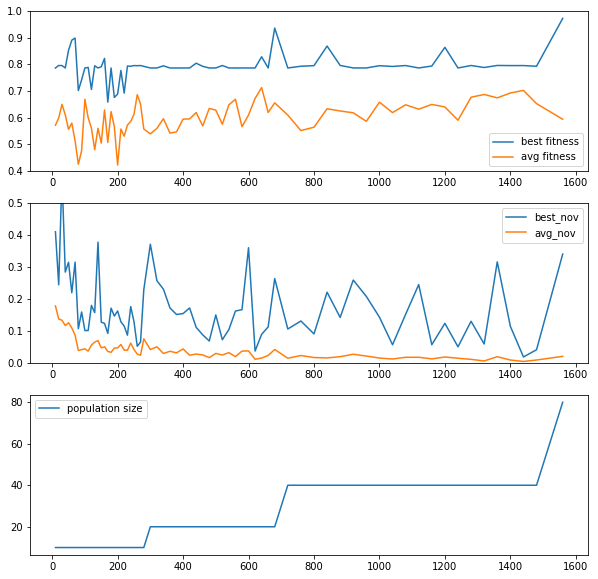

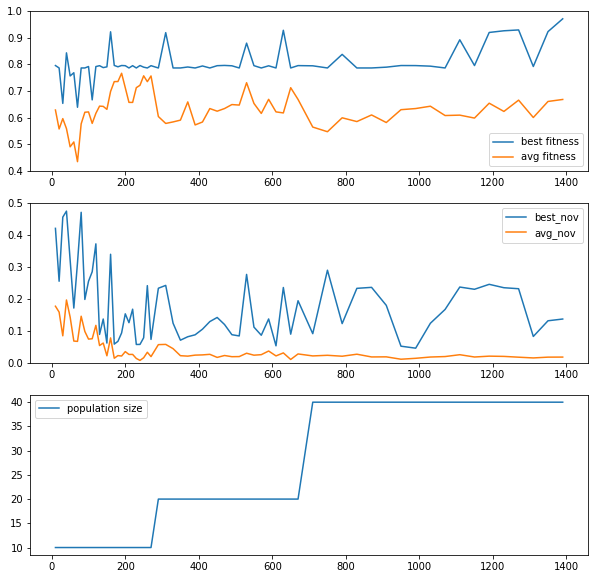

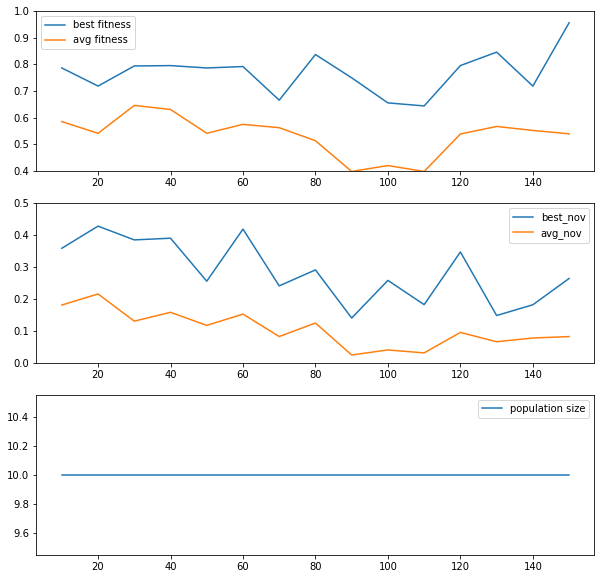

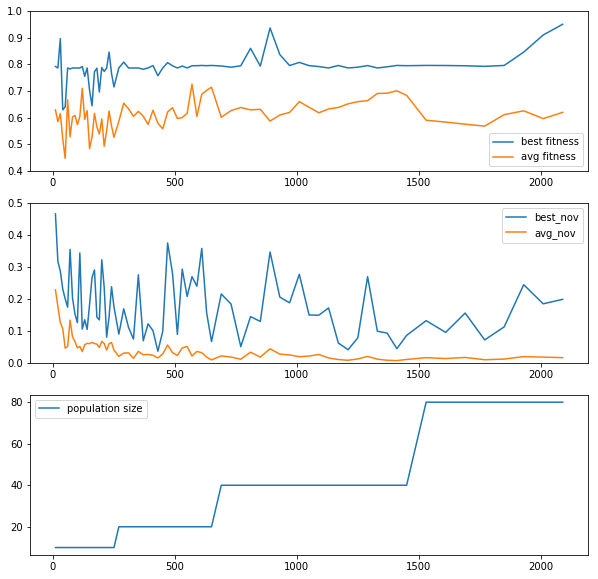

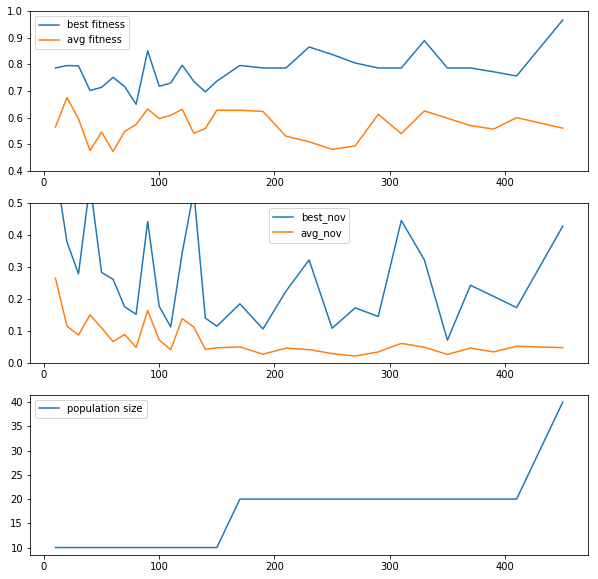

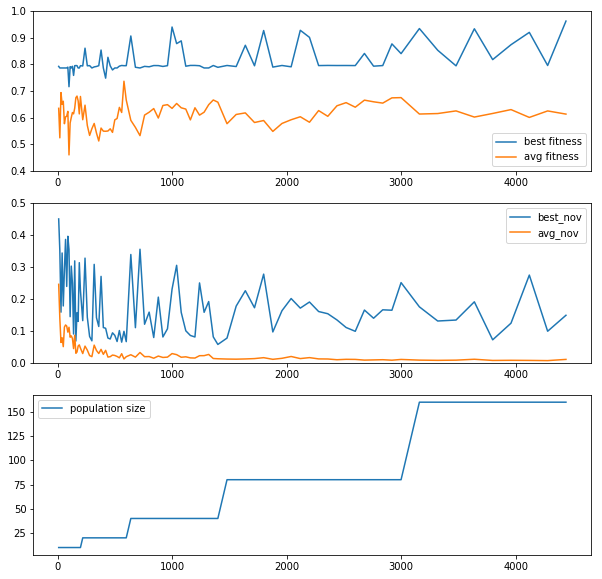

In [50]:
e_ipop_easy_sigma20 = "/home/leni/are-logs/e_ipop_easy_sigma20/"
x_vec = []
y_vec = []
for folder in os.listdir(e_ipop_easy_sigma20) :
    if(not os.path.isdir(e_ipop_easy_sigma20 + folder)) :
        continue
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(e_ipop_easy_sigma20 + folder + "/fitnesses_hn.csv")
    neval, best_nov, avg_nov,pop_size = load_all_fitnesses(e_ipop_easy_sigma20 + folder + "/novelty.csv")
    fig = plt.figure(figsize=[10,10])
    ax1 = fig.add_subplot(3,1,1)
    ax2 = fig.add_subplot(3,1,3)
    ax3 = fig.add_subplot(3,1,2)
    ax1.set_ylim(0.4,1)
    ax3.set_ylim(0.0,0.5)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    ax3.plot(neval,best_nov,label="best_nov")
    ax3.plot(neval,avg_nov,label="avg_nov")


    
    ax1.legend()
    ax2.legend()
    ax3.legend()
    plt.show()
    animation_pop(e_ipop_easy_sigma20 + folder,pop_size,1)

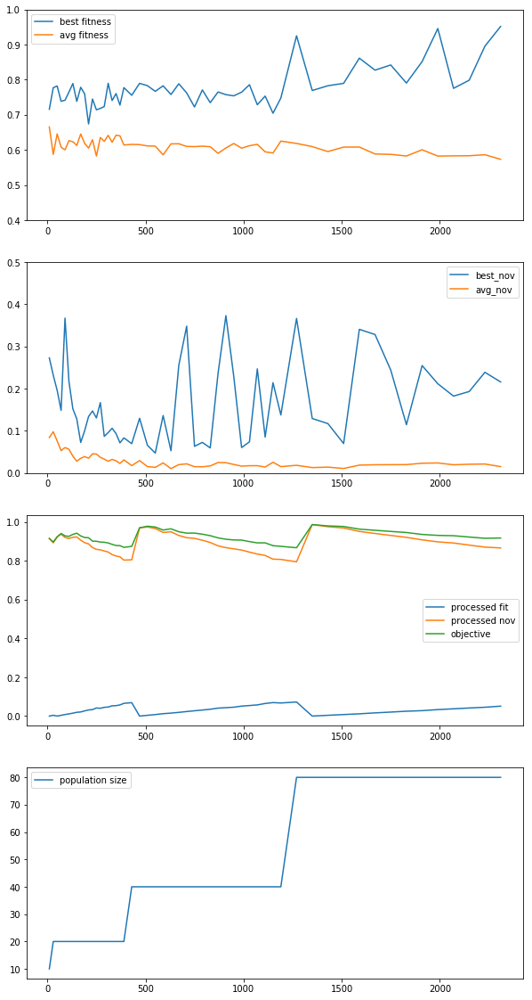

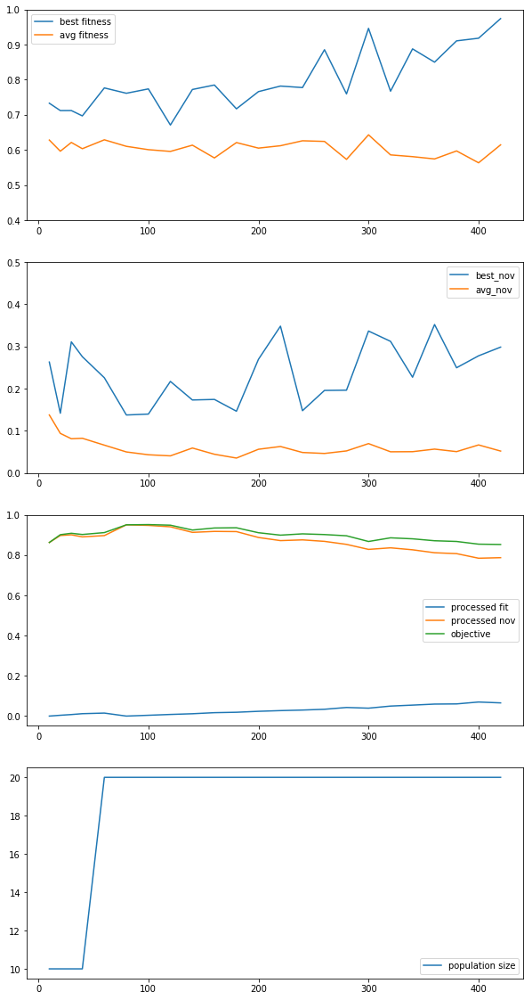

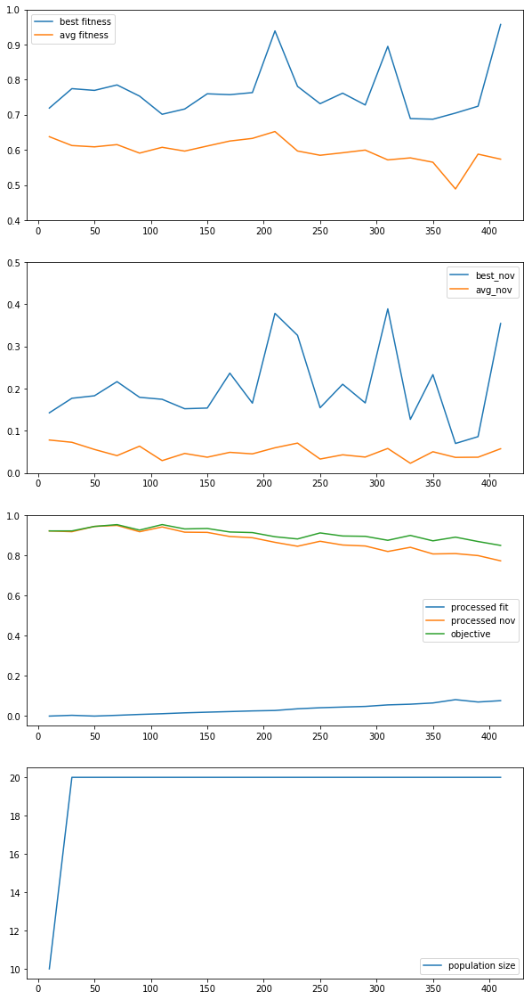

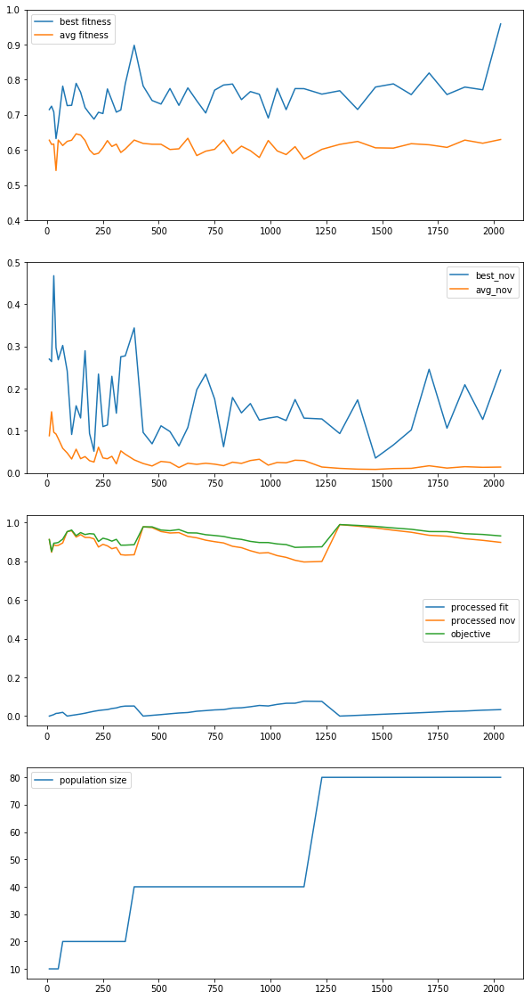

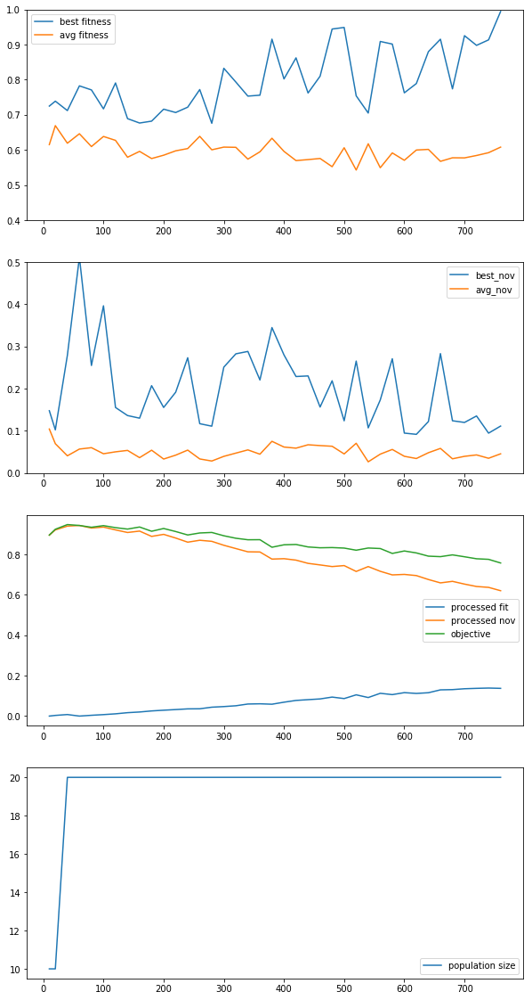

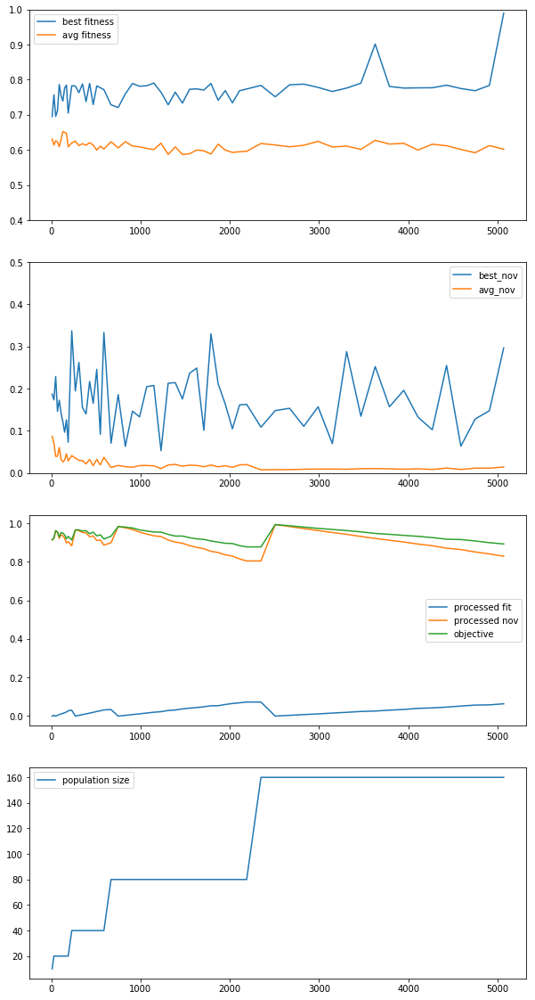

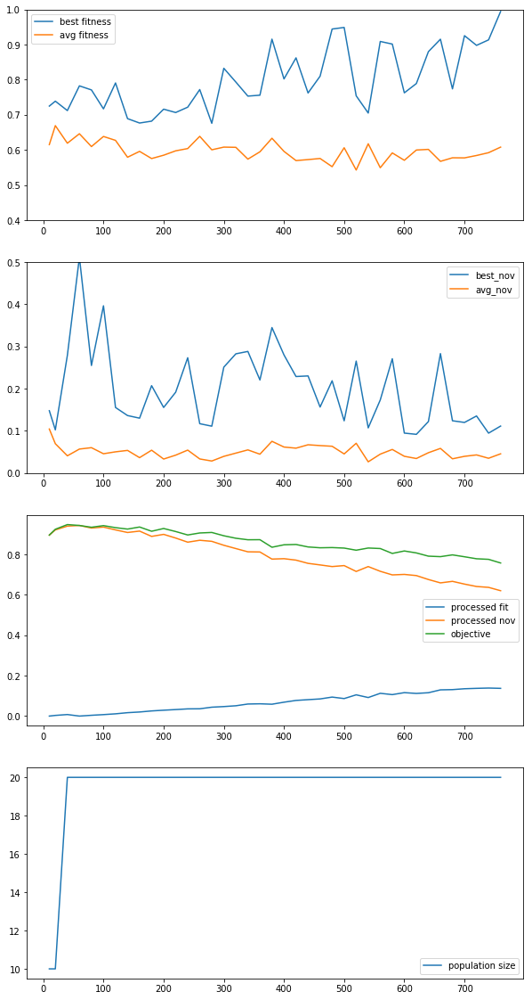

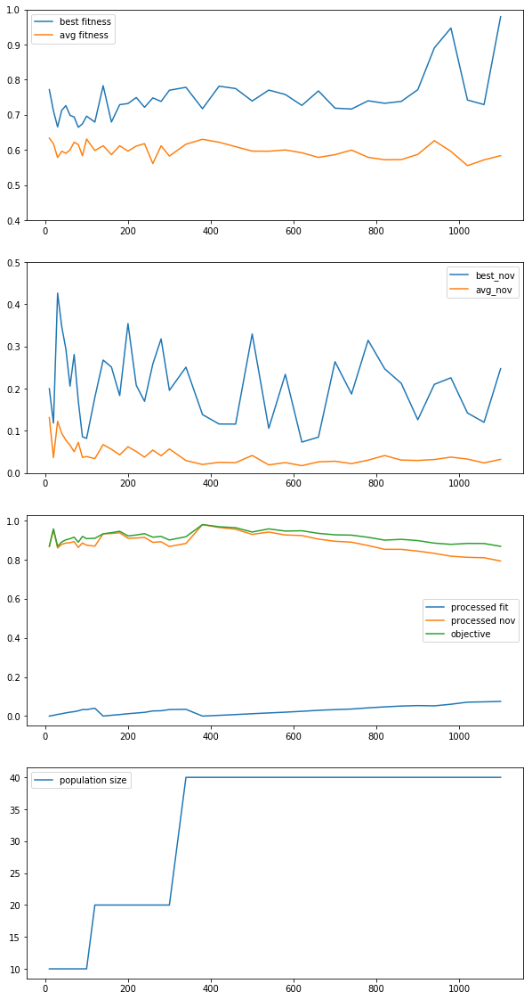

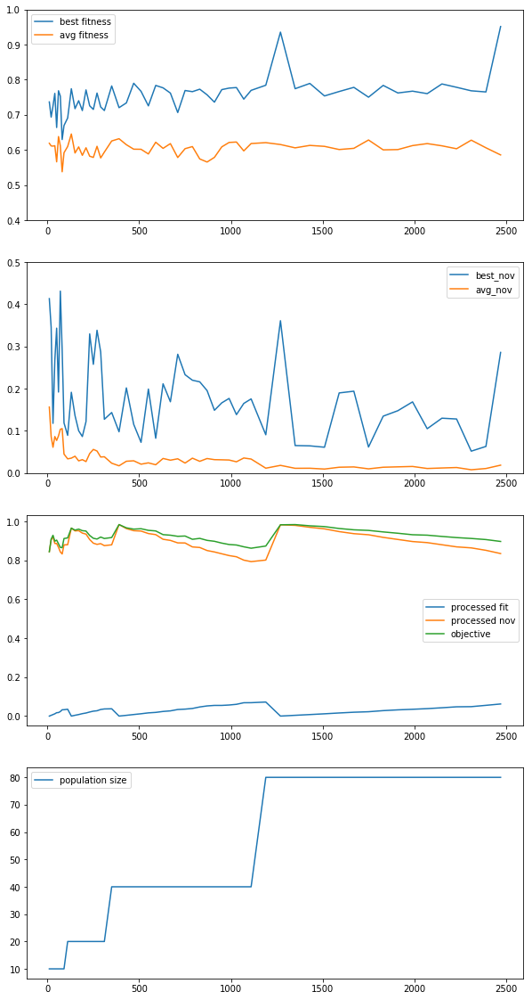

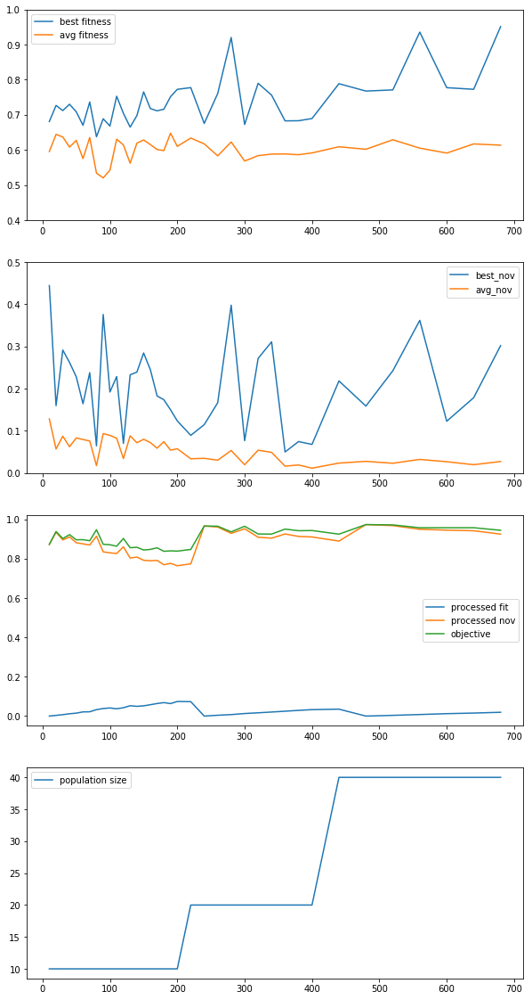

In [54]:
are_ipop_easy_novpure_time240 = "/home/leni/are-logs/are_ipop_easy_novpure_time240/"
x_vec = []
y_vec = []
for folder in os.listdir(are_ipop_easy_novpure_time240) :
    if(not os.path.isdir(are_ipop_easy_novpure_time240 + folder)) :
        continue
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_ipop_easy_novpure_time240 + folder + "/fitnesses.csv")
    neval, best_nov, avg_nov,pop_size = load_all_fitnesses(are_ipop_easy_novpure_time240 + folder + "/novelty.csv")
    ratio_fitnov = [avg_nov[i]/avg_fit[i] for i in range(0,len(avg_fit))]
    avg_pfit = []
    avg_pnov = []
    avg_obj = []
    w = 1.
    for i in range(0,len(avg_fit)) :
        avg_pfit.append((1 - avg_fit[i])*(1-w))
        avg_pnov.append((1 - avg_nov[i])*w)
        avg_obj.append(avg_pfit[-1] + avg_pnov[-1])
        if(i == 0  or pop_size[i-1] == pop_size[i] ) :
            w = w - 0.01
        else :
            w = 1.
    fig = plt.figure(figsize=[10,20])
    ax1 = fig.add_subplot(4,1,1)
    ax2 = fig.add_subplot(4,1,4)
    ax3 = fig.add_subplot(4,1,2)
    ax4 = fig.add_subplot(4,1,3)
    ax1.set_ylim(0.4,1)
    ax3.set_ylim(0.0,0.5)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    ax3.plot(neval,best_nov,label="best_nov")
    ax3.plot(neval,avg_nov,label="avg_nov")
    ax4.plot(neval,avg_pfit,label="processed fit")
    ax4.plot(neval,avg_pnov,label="processed nov")
    ax4.plot(neval,avg_obj,label="objective")

    
    ax1.legend()
    ax2.legend()
    ax3.legend()
    ax4.legend()
    plt.show()
    animation_pop(are_ipop_easy_novpure_time240 + folder,pop_size,1)

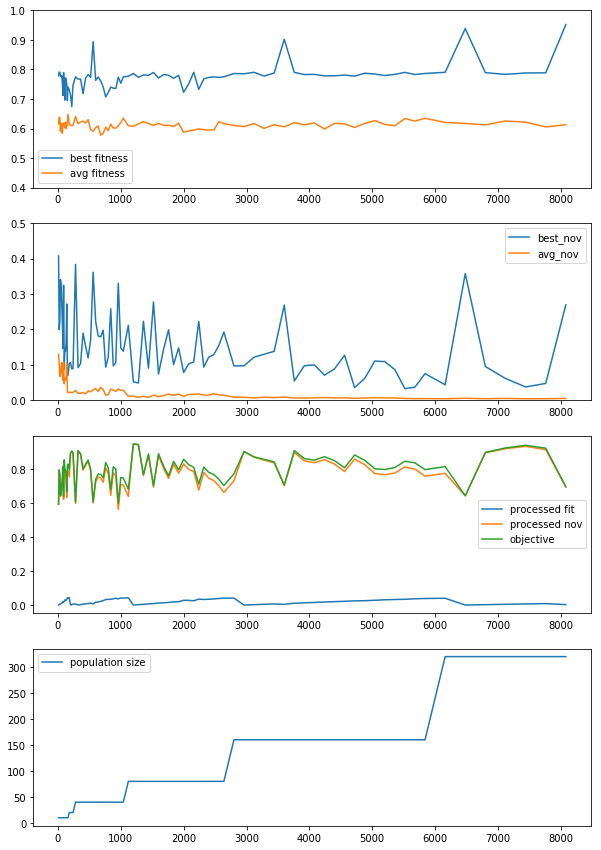

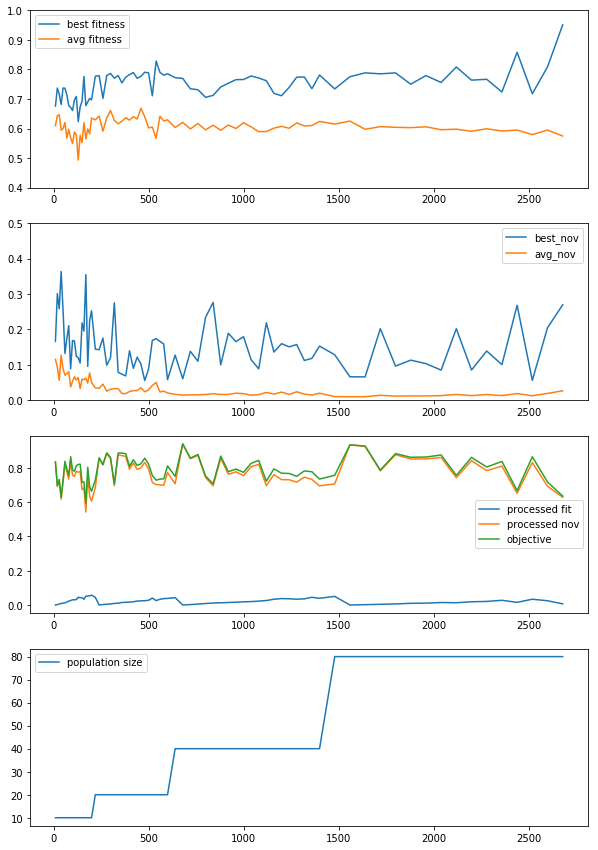

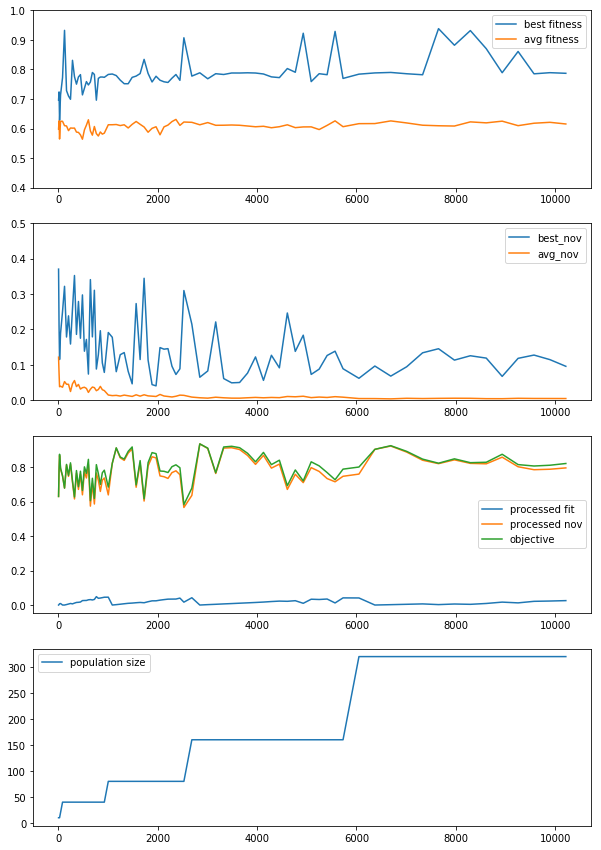

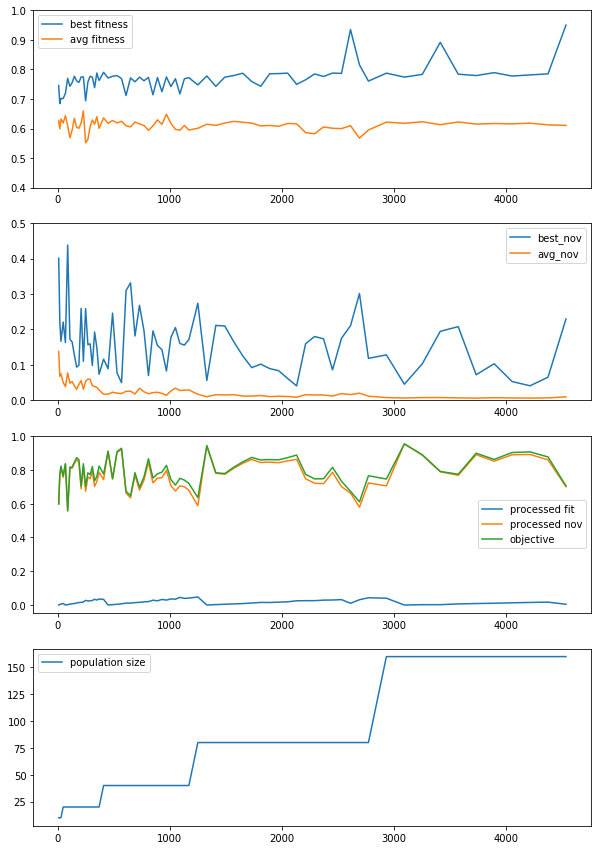

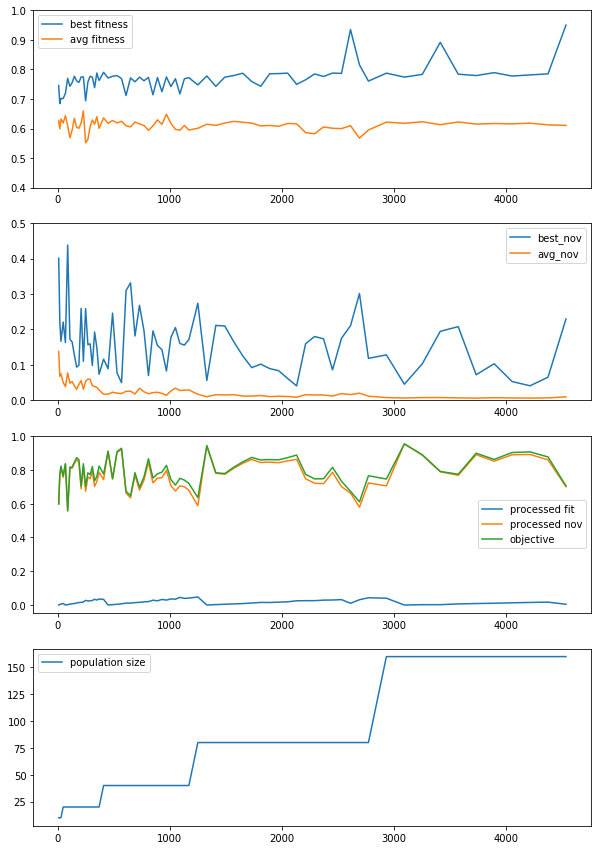

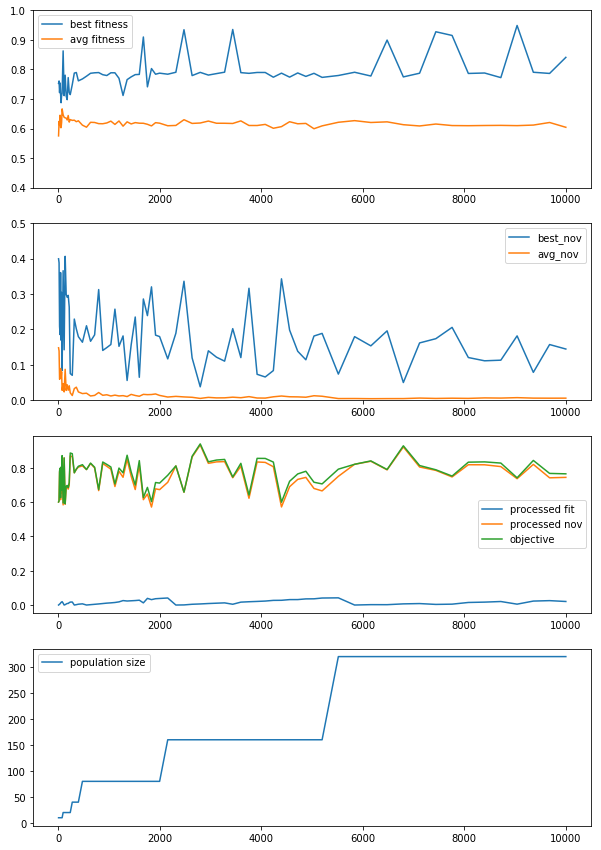

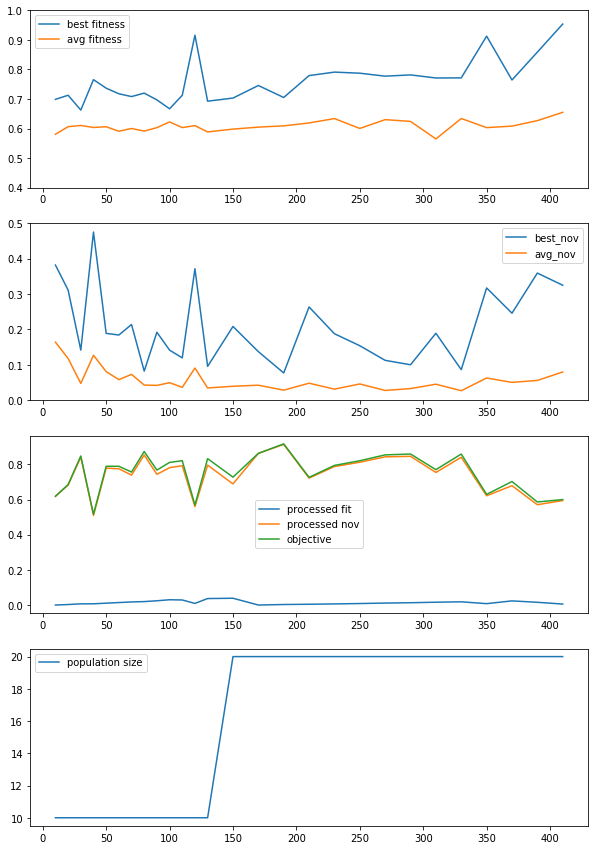

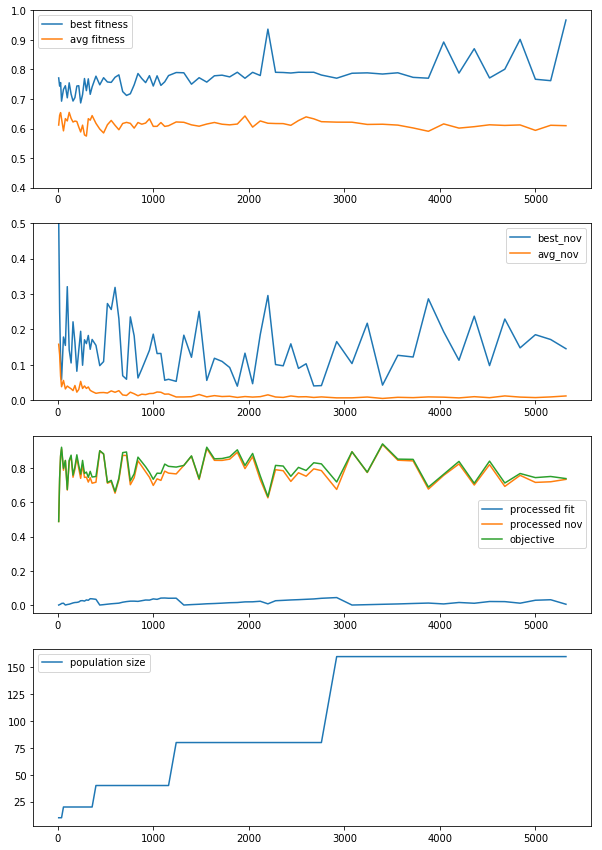

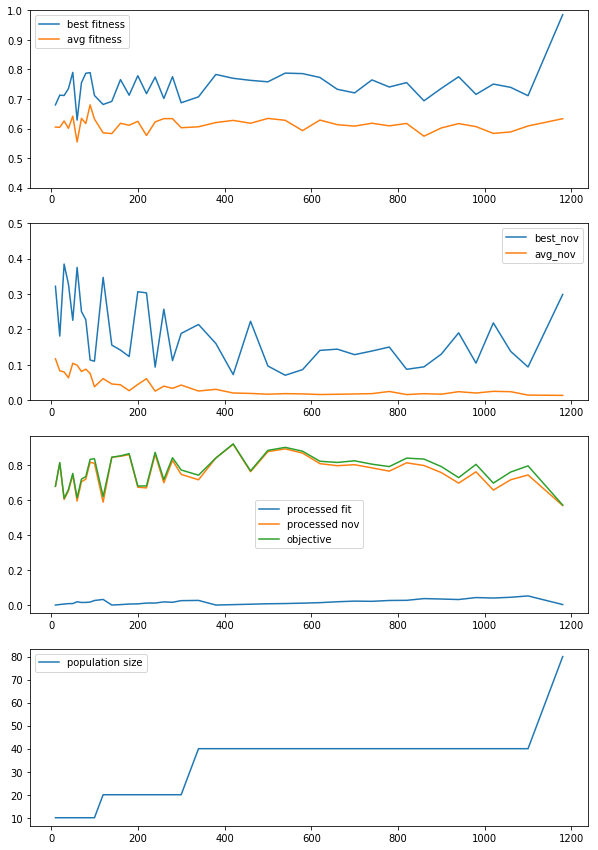

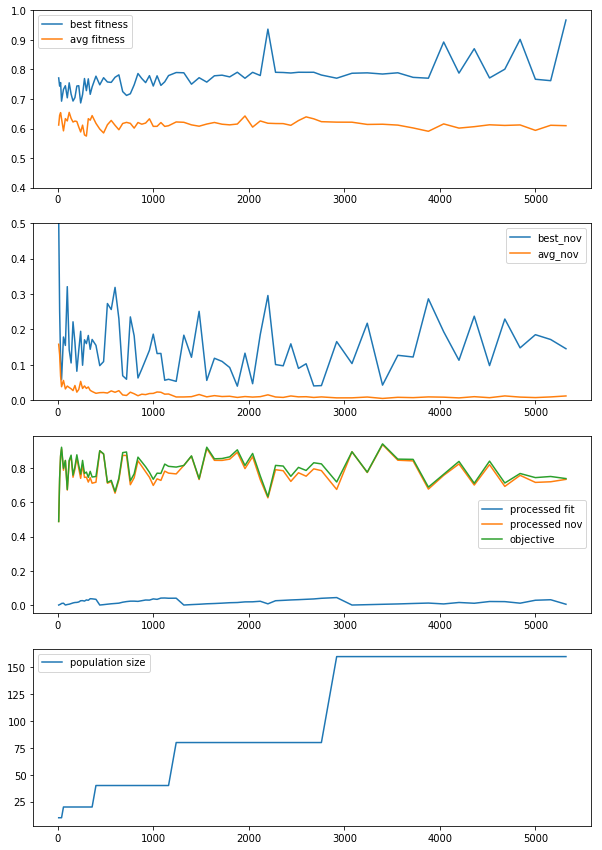

In [46]:
are_ipop_easy_fitnov_time240 = "/home/leni/are-logs/are_ipop_easy_fitnov_time240/"
x_vec = []
y_vec = []
for folder in os.listdir(are_ipop_easy_fitnov_time240) :
    if(not os.path.isdir(are_ipop_easy_fitnov_time240 + folder)) :
        continue
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_ipop_easy_fitnov_time240 + folder + "/fitnesses.csv")
    neval, best_nov, avg_nov,pop_size = load_all_fitnesses(are_ipop_easy_fitnov_time240 + folder + "/novelty.csv")
    avg_pfit = []
    avg_pnov = []
    avg_obj = []
    w = 1.
    for i in range(0,len(avg_fit)) :
        avg_pfit.append((1 - best_fit[i])*(1-w))
        avg_pnov.append((1 - best_nov[i])*w)
        avg_obj.append(avg_pfit[-1] + avg_pnov[-1])
        if(i == 0  or pop_size[i-1] == pop_size[i] ) :
            w = w - 0.01
        else :
            w = 1.
        
    ratio_fitnov = [avg_nov[i]/avg_fit[i] for i in range(0,len(avg_fit))]
        
    fig = plt.figure(figsize=[10,15])
    ax1 = fig.add_subplot(4,1,1)
    ax2 = fig.add_subplot(4,1,4)
    ax3 = fig.add_subplot(4,1,2)
    ax4 = fig.add_subplot(4,1,3)
       
    ax1.set_ylim(0.4,1)
    ax3.set_ylim(0.0,0.5)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    ax3.plot(neval,best_nov,label="best_nov")
    ax3.plot(neval,avg_nov,label="avg_nov")
    ax4.plot(neval,avg_pfit,label="processed fit")
    ax4.plot(neval,avg_pnov,label="processed nov")
    ax4.plot(neval,avg_obj,label="objective")
    

    
    ax1.legend()
    ax2.legend()
    ax3.legend()
    ax4.legend()
    plt.show()
   # animation_pop(are_ipop_easy_fitnov_time240 + folder,pop_size,1)

10
[0.0, 0.0, 0.1, 0.0, 0.1, 0.1, 0.0, 0.1, 0.6]
10
[0.0, 0.0, 0.0, 0.0, 0.0, 0.2, 0.1, 0.2, 0.5]


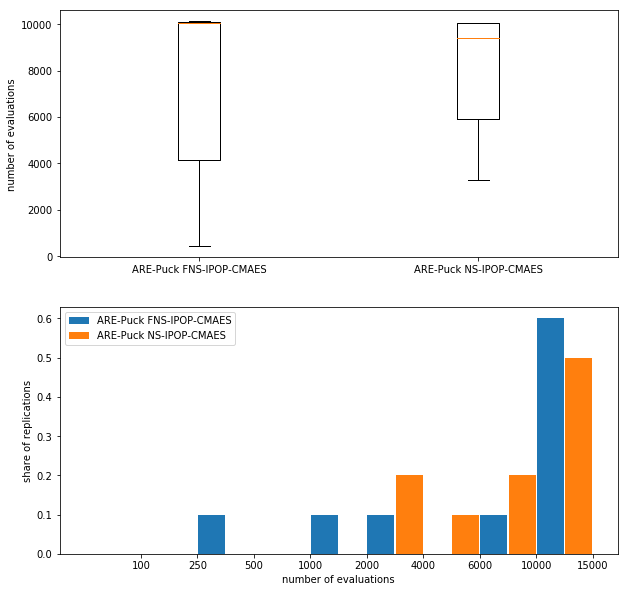

In [4]:
list_dir = ["/home/leni/are-logs/are_ipop_easyh_fitnov/", \
            "/home/leni/are-logs/are_ipop_easyh_novpure/"]
list_label = ["ARE-Puck FNS-IPOP-CMAES","ARE-Puck NS-IPOP-CMAES"]
best_fits = []
i = 0   
nbevals = []
bins = ['100','250','500','1000','2000','4000','6000','10000','15000']
xbar = np.arange(len(bins))
width = 1./float(len(list_label))
fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(2,1,1)
ax2 = fig.add_subplot(2,1,2)
i = -len(list_dir)
j = 0
for dire in list_dir :
    nevals = []
    for folder in os.listdir(dire) :
        if(folder.split("_")[0] != "ipop") :
            continue
        if(not os.path.isdir(dire + folder)) :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses.csv")
        nevals.append(neval[-1])
    print(len(nevals))
    nbevals.append(nevals)
    histo = histo_nbeval(nevals,bins)
    print(histo)
    ax2.bar(xbar + width*i+width/2.,histo,width - 0.02,label=list_label[j])
    i += 1
    j += 1
    
ax2.set_xticks(xbar)
ax2.set_xticklabels(bins)
ax2.legend()
ax1.boxplot(nbevals,labels=list_label)
ax1.set_ylabel("number of evaluations")
ax2.set_xlabel("number of evaluations")
ax2.set_ylabel("share of replications")
plt.show()

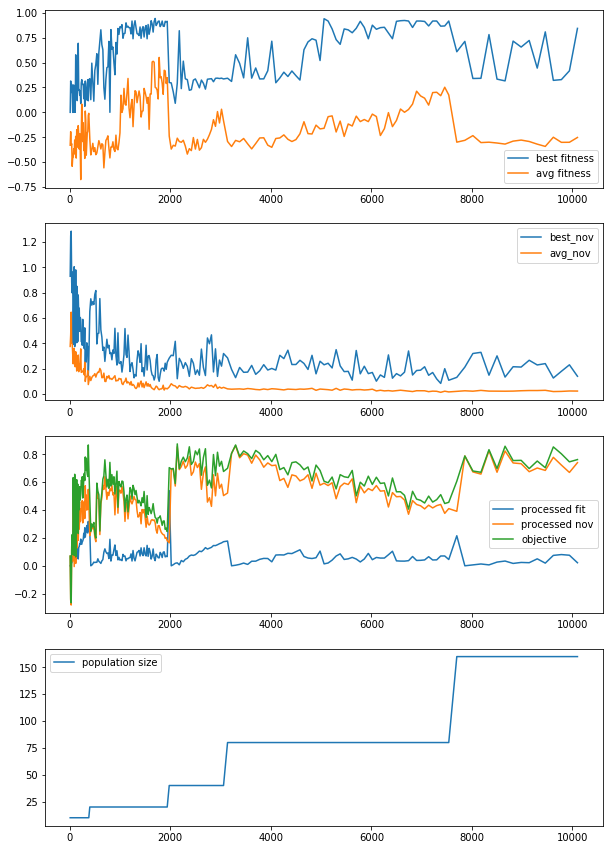

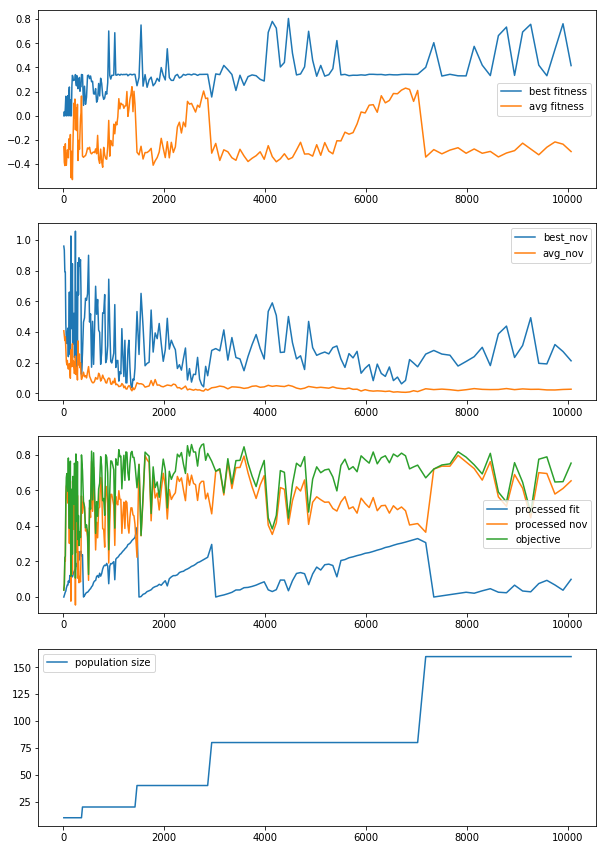

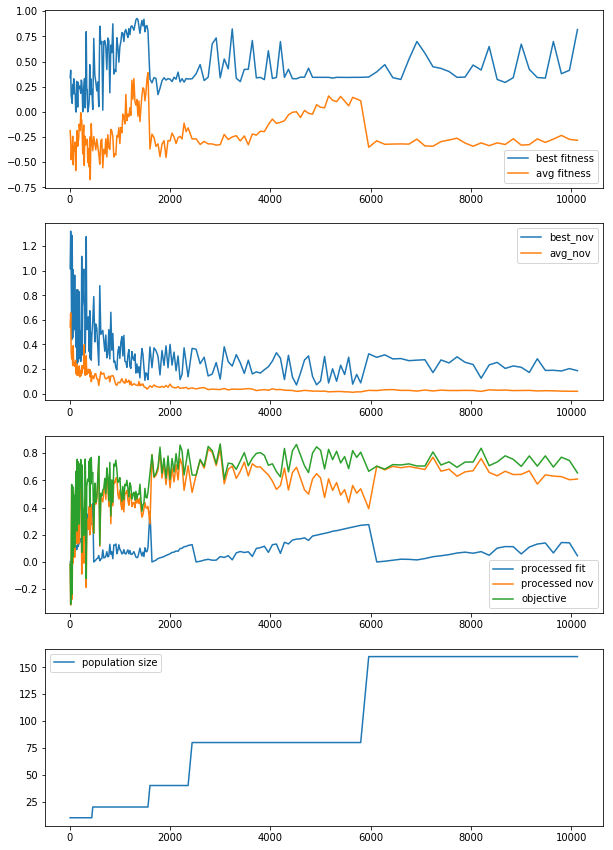

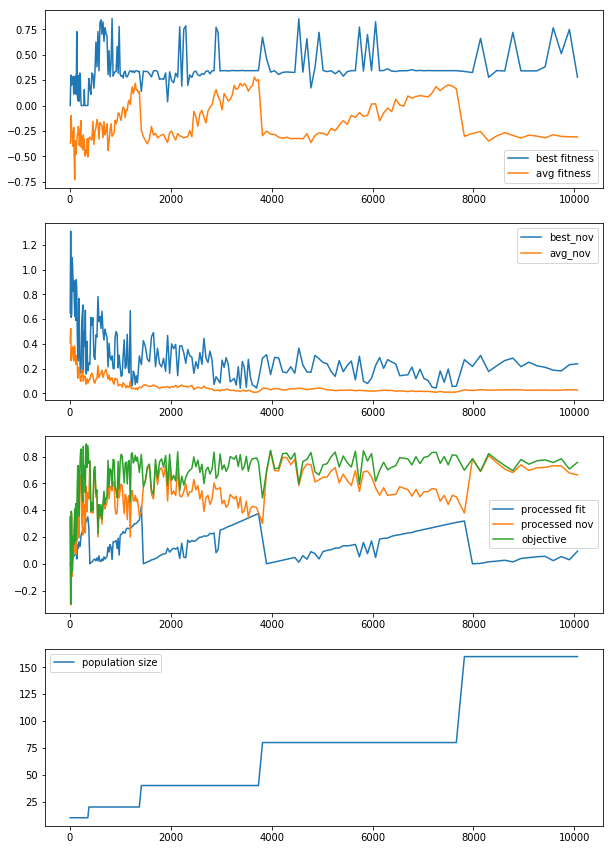

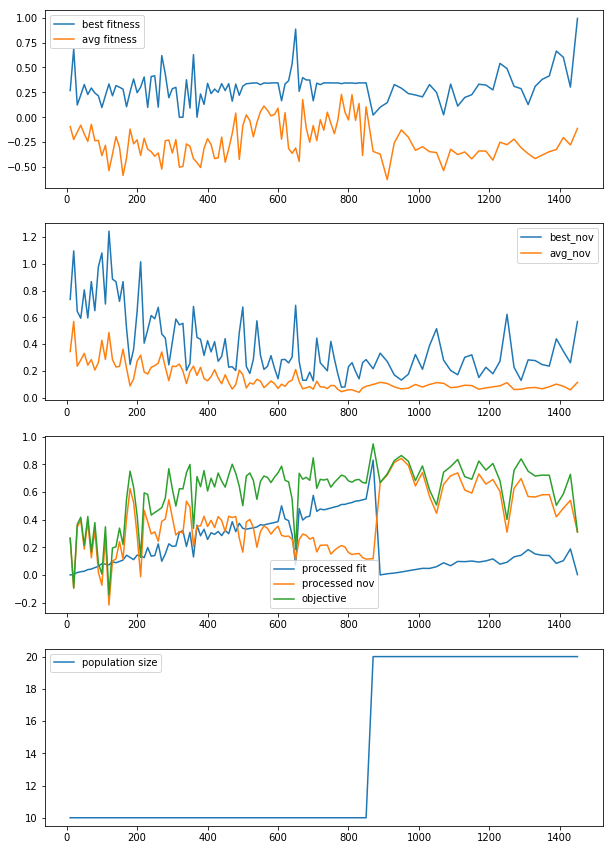

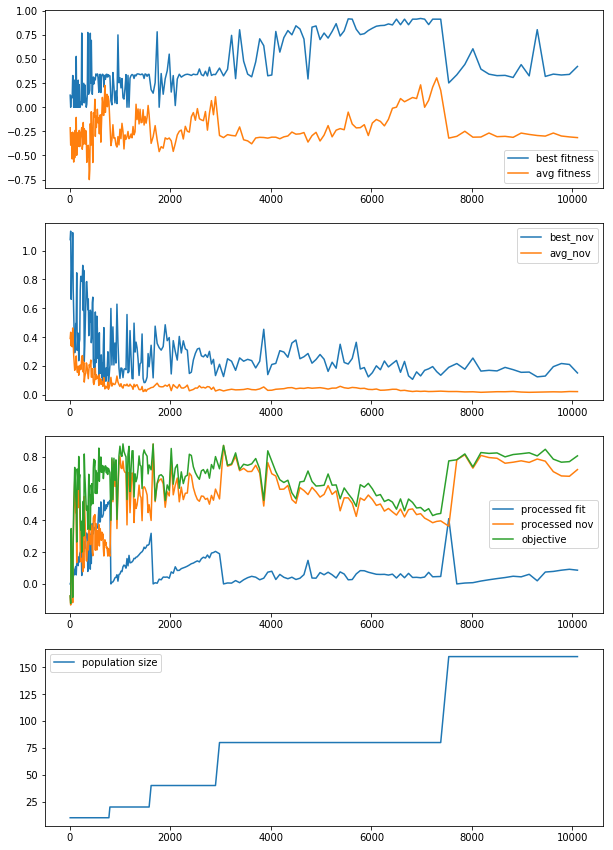

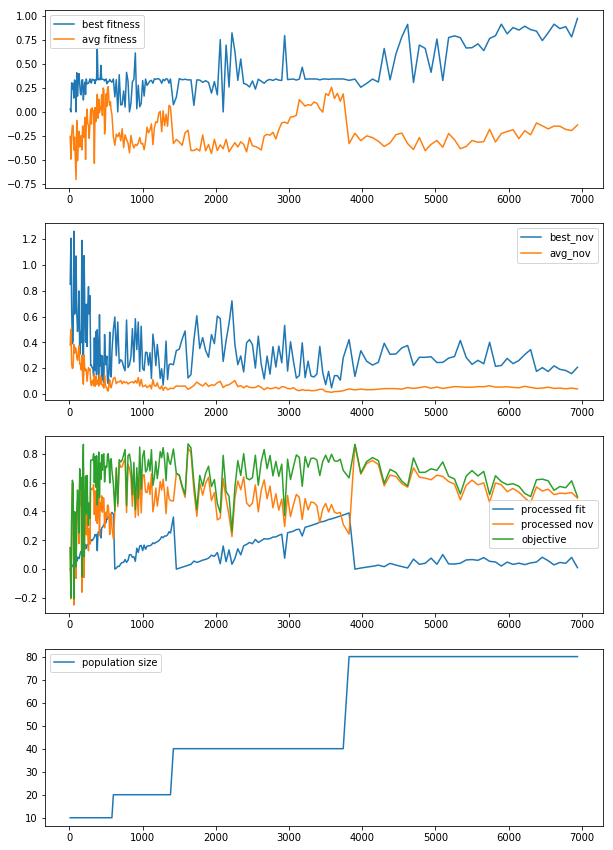

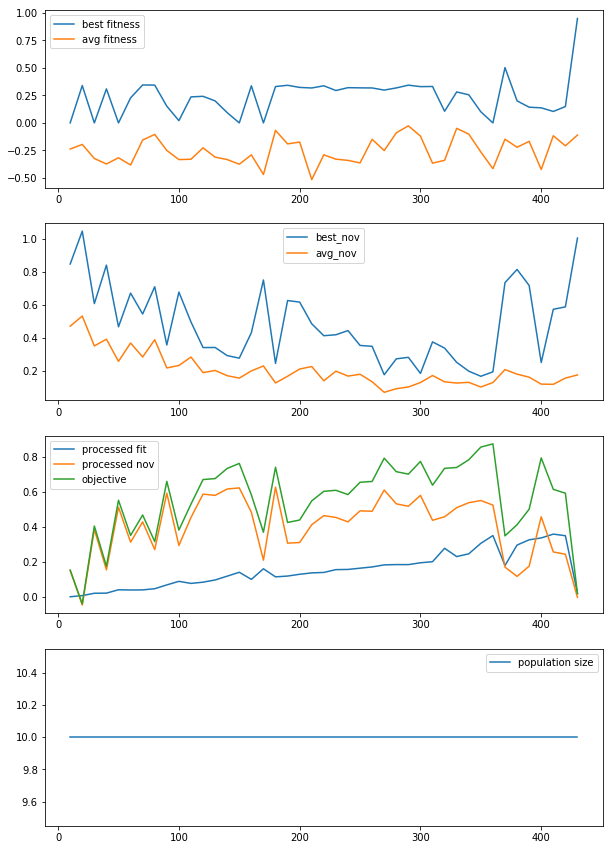

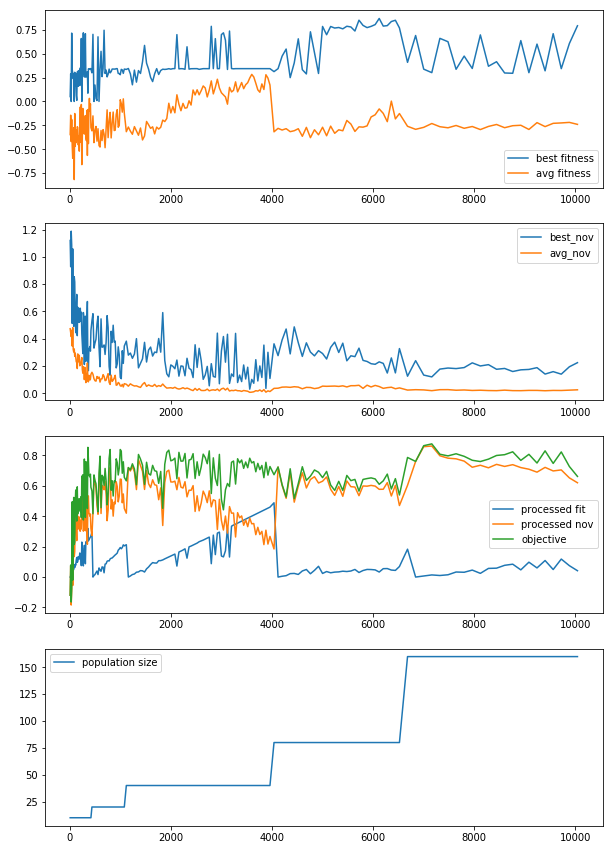

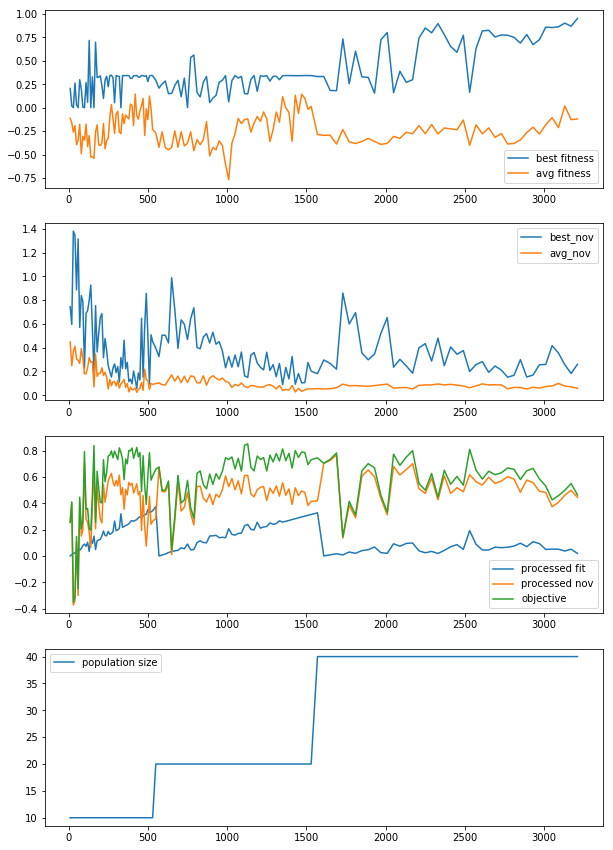

In [7]:
are_ipop_easyh_fitnov = "/home/leni/are-logs/are_ipop_easyh_fitnov/"
x_vec = []
y_vec = []
for folder in os.listdir(are_ipop_easyh_fitnov) :
    if(not os.path.isdir(are_ipop_easyh_fitnov + folder)) :
        continue
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_ipop_easyh_fitnov + folder + "/fitnesses.csv")
    neval, best_nov, avg_nov,pop_size = load_all_fitnesses(are_ipop_easyh_fitnov + folder + "/novelty.csv")
    avg_pfit = []
    avg_pnov = []
    avg_obj = []
    w = 1.
    for i in range(0,len(avg_fit)) :
        avg_pfit.append((1 - best_fit[i])*(1-w))
        avg_pnov.append((1 - best_nov[i])*w)
        avg_obj.append(avg_pfit[-1] + avg_pnov[-1])
        if(i == 0  or pop_size[i-1] == pop_size[i] ) :
            w = w - 0.01
        else :
            w = 1.
        
    ratio_fitnov = [avg_nov[i]/avg_fit[i] for i in range(0,len(avg_fit))]
        
    fig = plt.figure(figsize=[10,15])
    ax1 = fig.add_subplot(4,1,1)
    ax2 = fig.add_subplot(4,1,4)
    ax3 = fig.add_subplot(4,1,2)
    ax4 = fig.add_subplot(4,1,3)
       
#    ax1.set_ylim(0.4,1)
#    ax3.set_ylim(0.0,0.5)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    ax3.plot(neval,best_nov,label="best_nov")
    ax3.plot(neval,avg_nov,label="avg_nov")
    ax4.plot(neval,avg_pfit,label="processed fit")
    ax4.plot(neval,avg_pnov,label="processed nov")
    ax4.plot(neval,avg_obj,label="objective")
    

    
    ax1.legend()
    ax2.legend()
    ax3.legend()
    ax4.legend()
    plt.show()
    animation_pop(are_ipop_easyh_fitnov + folder,pop_size,1)

10
[0.1, 0.1, 0.0, 0.0, 0.0, 0.2, 0.2, 0.4]
20
[0.0, 0.05, 0.1, 0.0, 0.05, 0.1, 0.15, 0.55]
10
[0.0, 0.0, 0.0, 0.0, 0.0, 0.4, 0.2, 0.4]
20
[0.25, 0.0, 0.3, 0.1, 0.1, 0.0, 0.25, 0.0]
20
[0.25, 0.25, 0.45, 0.0, 0.0, 0.05, 0.0, 0.0]


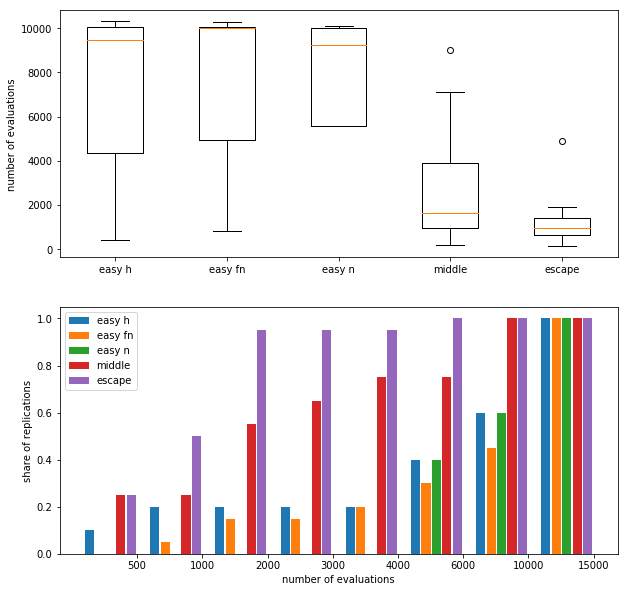

In [2]:
list_dir = ["/home/leni/are-logs/are_ipop_easyh_fitnov/", \
            "/home/leni/are-logs/are_ipop_easy_fitnov/",\
            "/home/leni/are-logs/are_ipop_easy_novpure/", \
           "/home/leni/are-logs/are_ipop_middle_fitnov/", \
           "/home/leni/are-logs/are_ipop_escape_fitnov/"]
list_label = ["easy h","easy fn","easy n","middle","escape"]
best_fits = []
i = 0   
nbevals = []
bins = ['500','1000','2000','3000','4000','6000','10000','15000']
xbar = np.arange(len(bins))
width = 0.8/float(len(list_label))
fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(2,1,1)
ax2 = fig.add_subplot(2,1,2)
i = -len(list_dir)
j = 0
for dire in list_dir :
    nevals = []
    for folder in os.listdir(dire) :
        if(folder.split("_")[0] != "ipop") :
            continue
        if(not os.path.isdir(dire + folder)) :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses.csv")
        nevals.append(neval[-1])
    print(len(nevals))
    nbevals.append(nevals)
    histo = histo_nbeval(nevals,bins)
    histo_cumu = [histo[0]]
    for k in range(1,len(histo)) :
        histo_cumu.append(histo[k] + histo_cumu[k-1])
    print(histo)
    ax2.bar(xbar + width*i,histo_cumu,width - 0.02,label=list_label[j],align="edge")
    i += 1
    j += 1
    
ax2.set_xticks(xbar)
ax2.set_xticklabels(bins)
ax2.legend()
ax1.boxplot(nbevals,labels=list_label)
ax1.set_ylabel("number of evaluations")
ax2.set_xlabel("number of evaluations")
ax2.set_ylabel("share of replications")
plt.show()

11
[0.5454545454545454, 0.36363636363636365, 0.0, 0.09090909090909091, 0.0, 0.0, 0.0, 0.0]
4
[0.25, 0.5, 0.0, 0.0, 0.0, 0.0, 0.0, 0.25]
11
[0.09090909090909091, 0.18181818181818182, 0.09090909090909091, 0.0, 0.09090909090909091, 0.0, 0.0, 0.5454545454545454]
5
[0.0, 0.0, 0.0, 0.2, 0.0, 0.0, 0.0, 0.8]


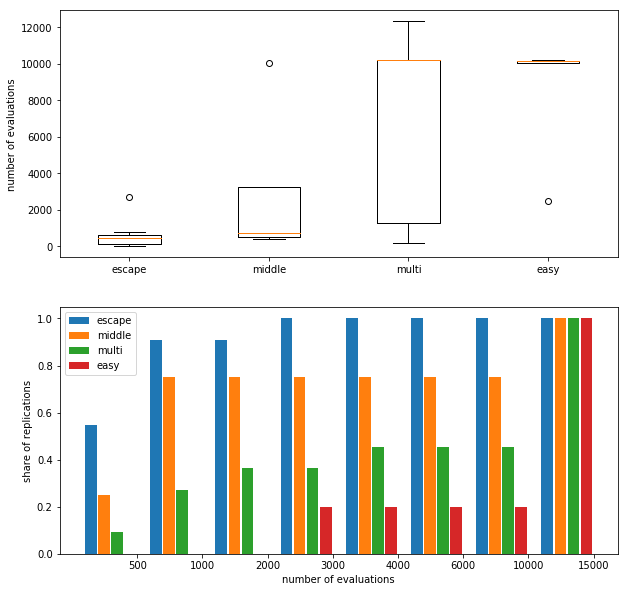

In [4]:
list_dir = ["/home/leni/are-logs/are_ipop_escape_fitnov/", \
           "/home/leni/are-logs/are_ipop_middle_fitnov/", \
           "/home/leni/are-logs/are_ipop_multi_fitnov/",\
           "/home/leni/are-logs/are_ipop_easy_fitnov/"]
list_label = ["escape","middle","multi","easy"]
best_fits = []
i = 0   
nbevals = []
bins = ['500','1000','2000','3000','4000','6000','10000','15000']
xbar = np.arange(len(bins))
width = 0.8/float(len(list_label))
fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(2,1,1)
ax2 = fig.add_subplot(2,1,2)
i = -len(list_dir)
j = 0
for dire in list_dir :
    nevals = []
    for folder in os.listdir(dire) :
        if(folder.split("_")[0] != "ipop") :
            continue
        if(not os.path.isdir(dire + folder)) :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses.csv")
        nevals.append(neval[-1])
    print(len(nevals))
    nbevals.append(nevals)
    histo = histo_nbeval(nevals,bins)
    histo_cumu = [histo[0]]
    for k in range(1,len(histo)) :
        histo_cumu.append(histo[k] + histo_cumu[k-1])
    print(histo)
    ax2.bar(xbar + width*i,histo_cumu,width - 0.02,label=list_label[j],align="edge")
    i += 1
    j += 1
    
ax2.set_xticks(xbar)
ax2.set_xticklabels(bins)
ax2.legend()
ax1.boxplot(nbevals,labels=list_label)
ax1.set_ylabel("number of evaluations")
ax2.set_xlabel("number of evaluations")
ax2.set_ylabel("share of replications")
plt.show()

10
[0.0, 0.0, 0.0, 0.1, 0.0, 0.0, 0.1, 0.8]
5
[0.0, 0.0, 0.0, 0.2, 0.0, 0.4, 0.0, 0.4]


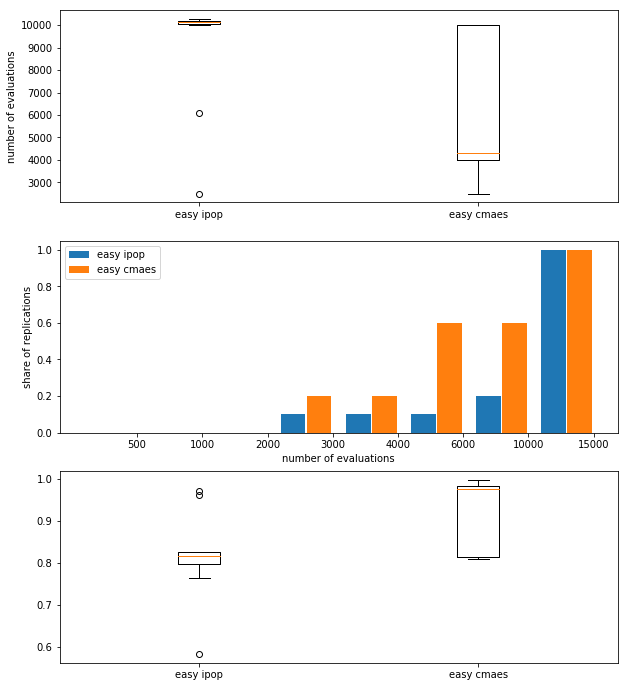

In [15]:
list_dir = ["/home/leni/are-logs/are_ipop_easy_fitnov/", \
           "/home/leni/are-logs/are_cmaes_easy_fitnov/"]
list_label = ["easy ipop","easy cmaes"]
best_fits = []
i = 0   
nbevals = []
bins = ['500','1000','2000','3000','4000','6000','10000','15000']
xbar = np.arange(len(bins))
width = 0.8/float(len(list_label))
fig = plt.figure(figsize=(10,12))
ax1 = fig.add_subplot(3,1,1)
ax2 = fig.add_subplot(3,1,2)
ax3 = fig.add_subplot(3,1,3)
i = -len(list_dir)
j = 0
best_fitnesses = []
for dire in list_dir :
    nevals = []
    best_fits = []
    for folder in os.listdir(dire) :
        if(folder.split("_")[0] != "ipop") :
            continue
        if(not os.path.isdir(dire + folder)) :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses.csv")
        best_fits.append(max(best_fit))
        nevals.append(neval[-1])
        for n in range(len(best_fit)) :
            if(best_fit[n] >= 0.95) :
                nevals[-1] = neval[n]
                break
       
    print(len(nevals))
    nbevals.append(nevals)
    best_fitnesses.append(best_fits)
    histo = histo_nbeval(nevals,bins)
    histo_cumu = [histo[0]]
    for k in range(1,len(histo)) :
        histo_cumu.append(histo[k] + histo_cumu[k-1])
    print(histo)
    ax2.bar(xbar + width*i,histo_cumu,width - 0.02,label=list_label[j],align="edge")
    i += 1
    j += 1
    
ax2.set_xticks(xbar)
ax2.set_xticklabels(bins)
ax2.legend()
ax3.boxplot(best_fitnesses,labels=list_label)
ax1.boxplot(nbevals,labels=list_label)
ax1.set_ylabel("number of evaluations")
ax2.set_xlabel("number of evaluations")
ax2.set_ylabel("share of replications")
plt.show()

5
[0.0, 0.0, 0.0, 0.0, 0.0, 0.4, 0.2, 0.4]
5
[0.2, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.8]
5
[0.0, 0.0, 0.0, 0.2, 0.0, 0.4, 0.0, 0.4]


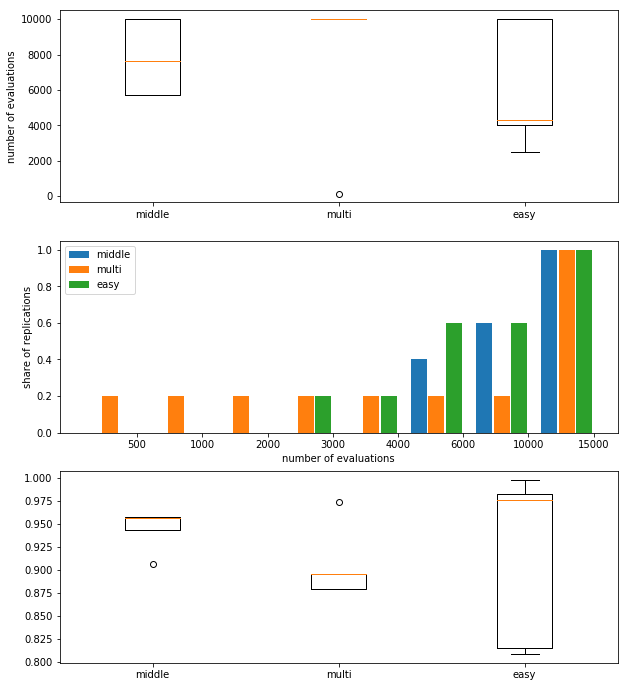

In [25]:
list_dir = ["/home/leni/are-logs/are_cmaes_middle_fitnov/", \
    "/home/leni/are-logs/are_cmaes_multi_fitnov/", \
           "/home/leni/are-logs/are_cmaes_easy_fitnov/"]
list_label = ["middle","multi","easy"]
best_fits = []
i = 0   
nbevals = []
bins = ['500','1000','2000','3000','4000','6000','10000','15000']
xbar = np.arange(len(bins))
width = 0.8/float(len(list_label))
fig = plt.figure(figsize=(10,12))
ax1 = fig.add_subplot(3,1,1)
ax2 = fig.add_subplot(3,1,2)
ax3 = fig.add_subplot(3,1,3)
i = -len(list_dir)
j = 0
best_fitnesses = []
for dire in list_dir :
    nevals = []
    best_fits = []
    for folder in os.listdir(dire) :
        if(folder.split("_")[0] != "ipop") :
            continue
        if(not os.path.isdir(dire + folder)) :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses.csv")
        best_fits.append(max(best_fit))
        nevals.append(neval[-1])
        for n in range(len(best_fit)) :
            if(best_fit[n] >= 0.95) :
                nevals[-1] = neval[n]
                break
       
    print(len(nevals))
    nbevals.append(nevals)
    best_fitnesses.append(best_fits)
    histo = histo_nbeval(nevals,bins)
    histo_cumu = [histo[0]]
    for k in range(1,len(histo)) :
        histo_cumu.append(histo[k] + histo_cumu[k-1])
    print(histo)
    ax2.bar(xbar + width*i,histo_cumu,width - 0.02,label=list_label[j],align="edge")
    i += 1
    j += 1
    
ax2.set_xticks(xbar)
ax2.set_xticklabels(bins)
ax2.legend()
ax3.boxplot(best_fitnesses,labels=list_label)
ax1.boxplot(nbevals,labels=list_label)
ax1.set_ylabel("number of evaluations")
ax2.set_xlabel("number of evaluations")
ax2.set_ylabel("share of replications")
plt.show()

ipop_cmaes_18_3_10-22-55-5450_1932861875


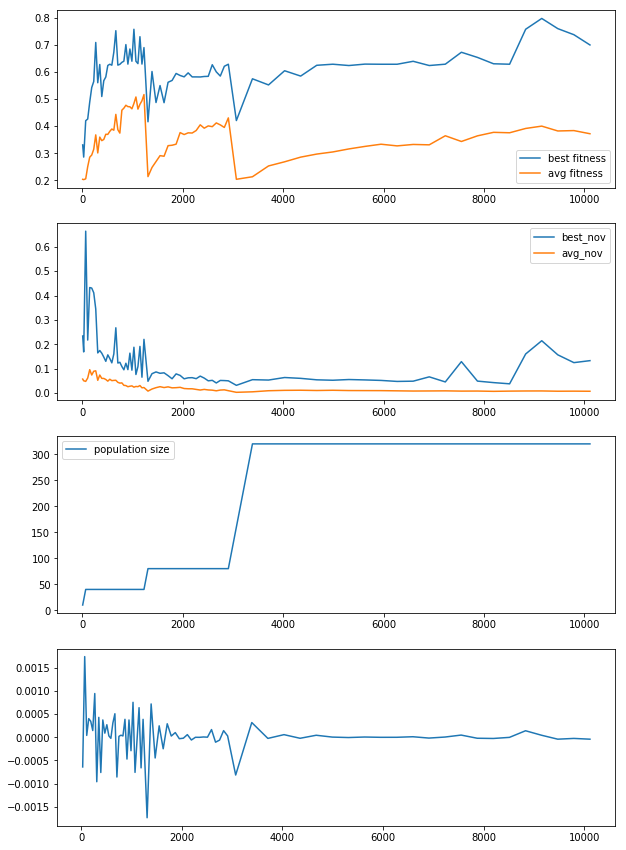

ipop_cmaes_18_3_10-20-27-7141_861504354


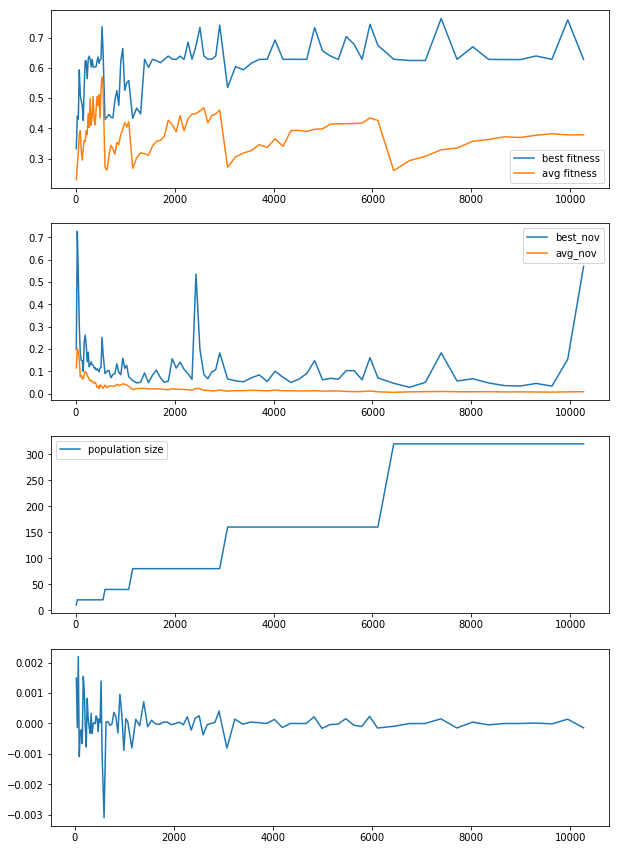

ipop_cmaes_17_3_18-13-1-1739_3251789039


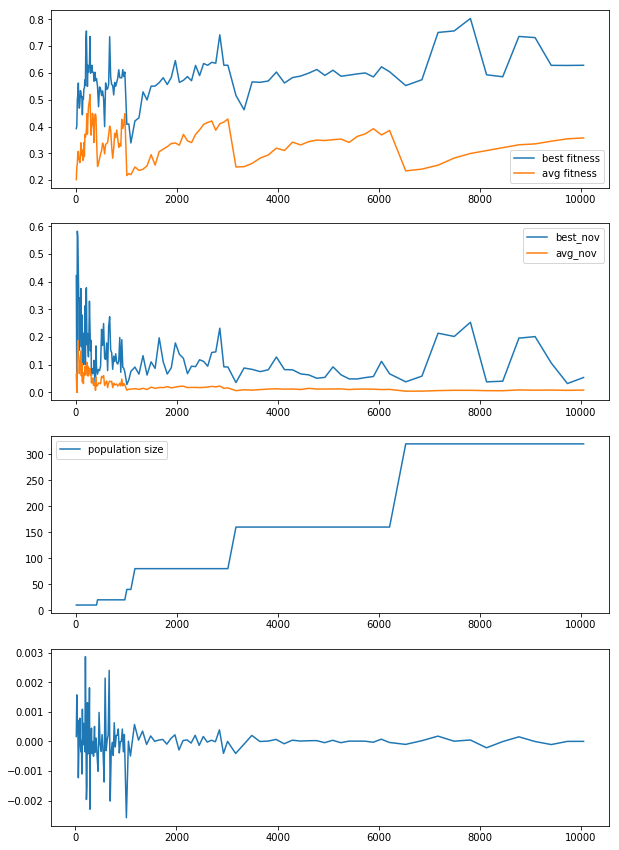

ipop_cmaes_18_3_10-20-31-1098_1024832457


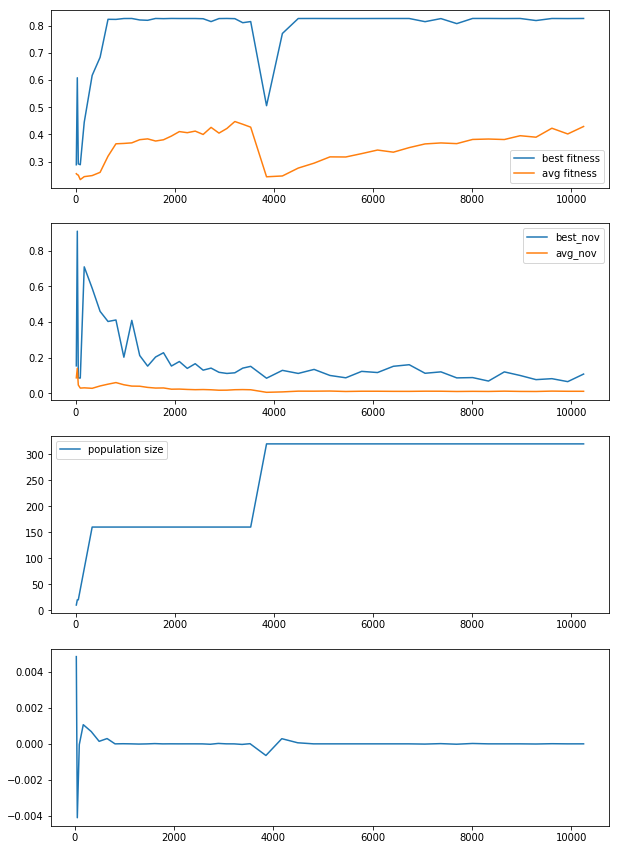

ipop_cmaes_17_3_15-45-4-4578_2408773417


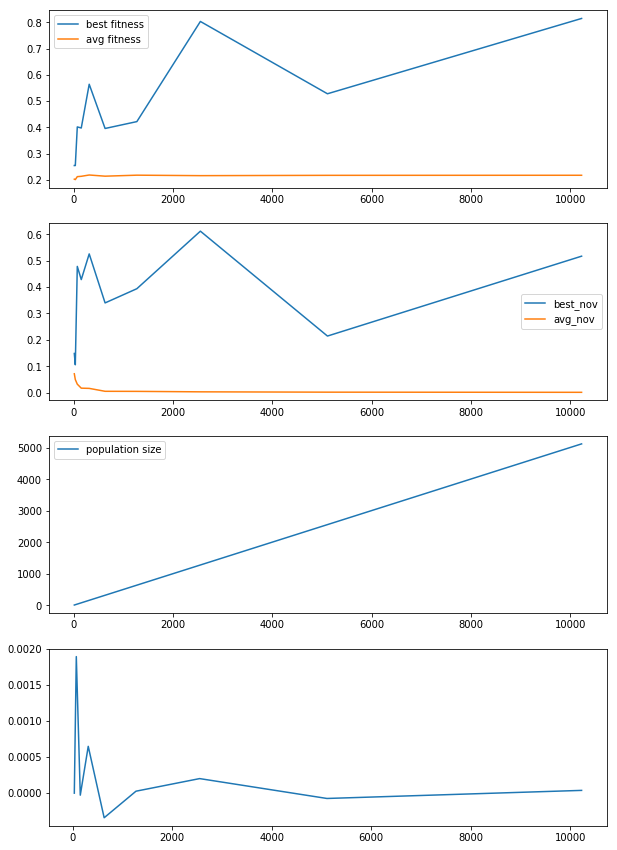

ipop_cmaes_18_3_10-23-12-2295_3116083306


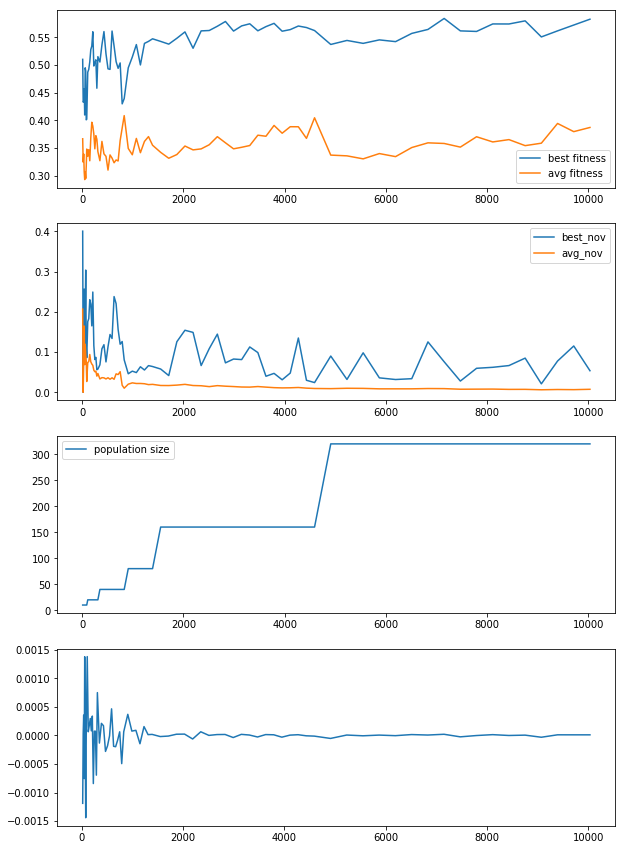

ipop_cmaes_17_3_15-44-29-9422_2546172924


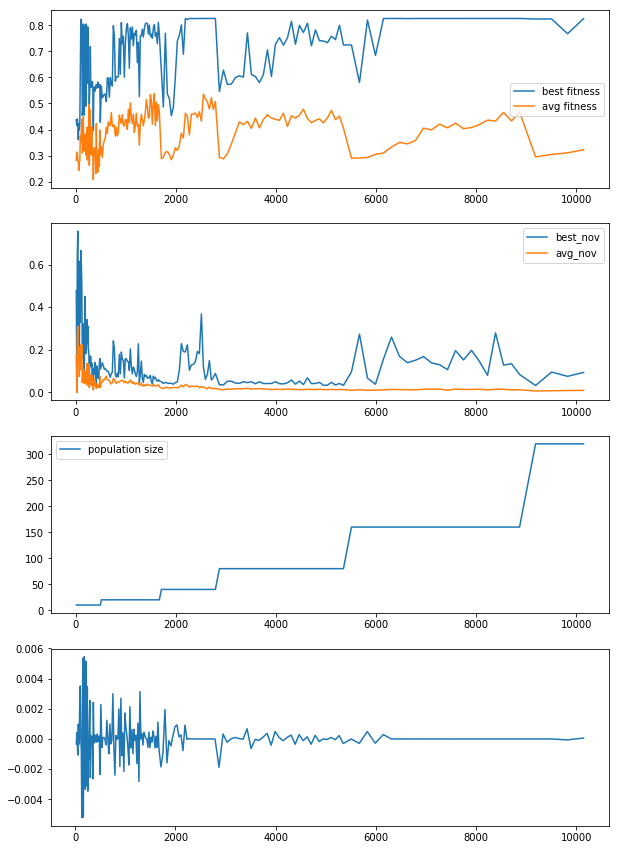

ipop_cmaes_17_3_15-45-10-469_1066909968


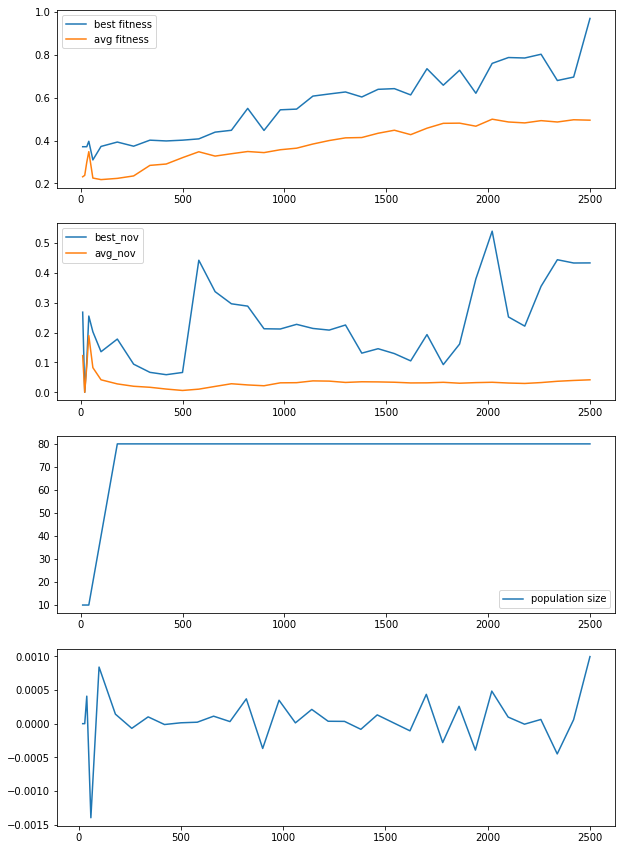

ipop_cmaes_18_3_10-20-46-6153_891907973


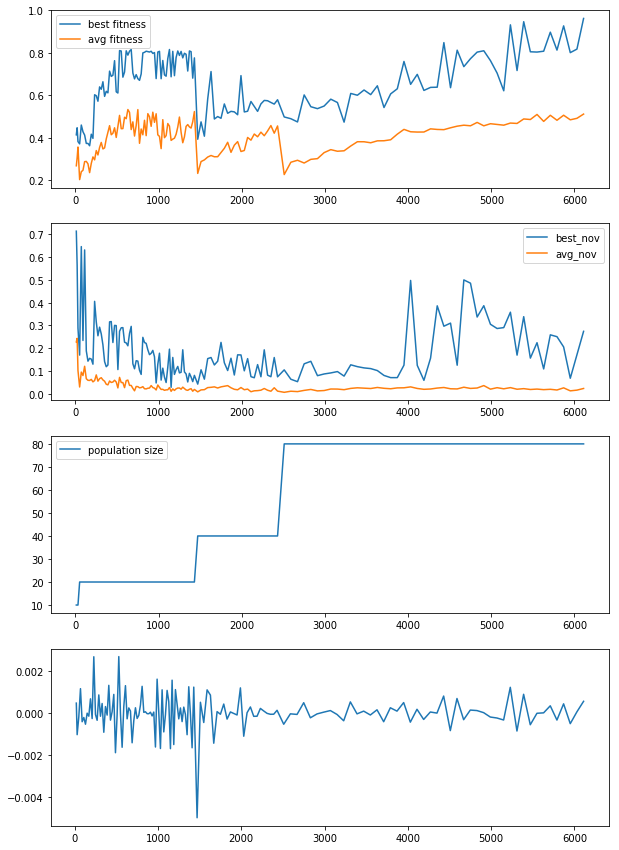

ipop_cmaes_17_3_19-12-33-3375_3792956216


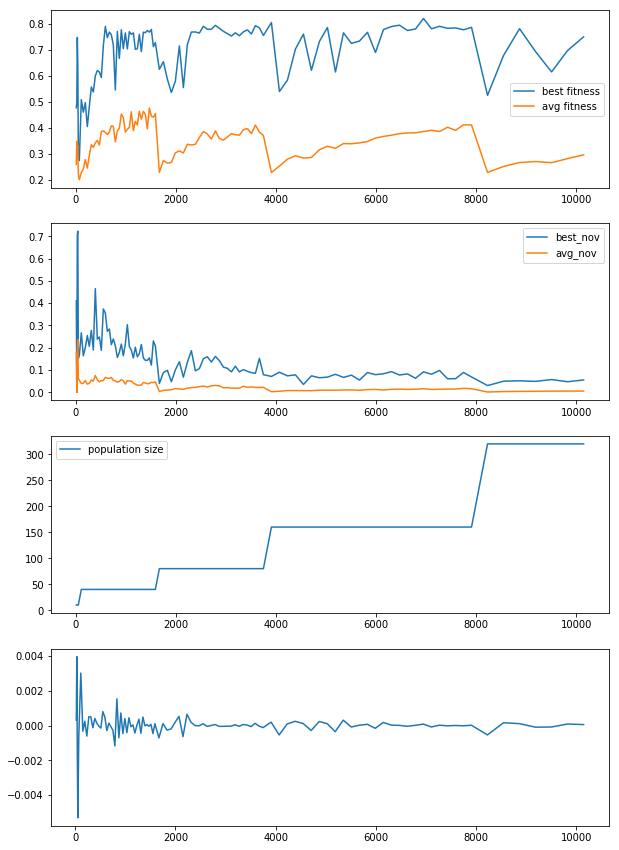

In [7]:
are_ipop_easy_fitnov = "/home/leni/are-logs/are_ipop_easy_fitnov/"
x_vec = []
y_vec = []
for folder in os.listdir(are_ipop_easy_fitnov) :
    if(not os.path.isdir(are_ipop_easy_fitnov + folder)) :
        continue
    print(folder)
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_ipop_easy_fitnov + folder + "/fitnesses.csv")
    neval, best_nov, avg_nov,pop_size = load_all_fitnesses(are_ipop_easy_fitnov + folder + "/novelty.csv")
    nbeval, eval_time = load_eval_time(are_ipop_easy_fitnov + folder + "/eval_durations.csv");

    
    gain = [(best_fit[i] - best_fit[i-1])/eval_time[i-1] for i in range(1,len(best_fit))]

    fig = plt.figure(figsize=[10,15])
    ax1 = fig.add_subplot(4,1,1)
    ax2 = fig.add_subplot(4,1,3)
    ax3 = fig.add_subplot(4,1,2)
    ax4 = fig.add_subplot(4,1,4)

#    ax1.set_ylim(0.4,1)
#    ax3.set_ylim(0.0,0.5)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    ax3.plot(neval,best_nov,label="best_nov")
    ax3.plot(neval,avg_nov,label="avg_nov")
    ax4.plot(neval[1:],gain,label='gain')
   # ax5.plot(eval_durations)

    
    ax1.legend()
    ax2.legend()
    ax3.legend()
    plt.show()
    animation_pop(are_ipop_easy_fitnov + folder,pop_size,1)

ipop_cmaes_18_3_10-42-51-1920_1504943530


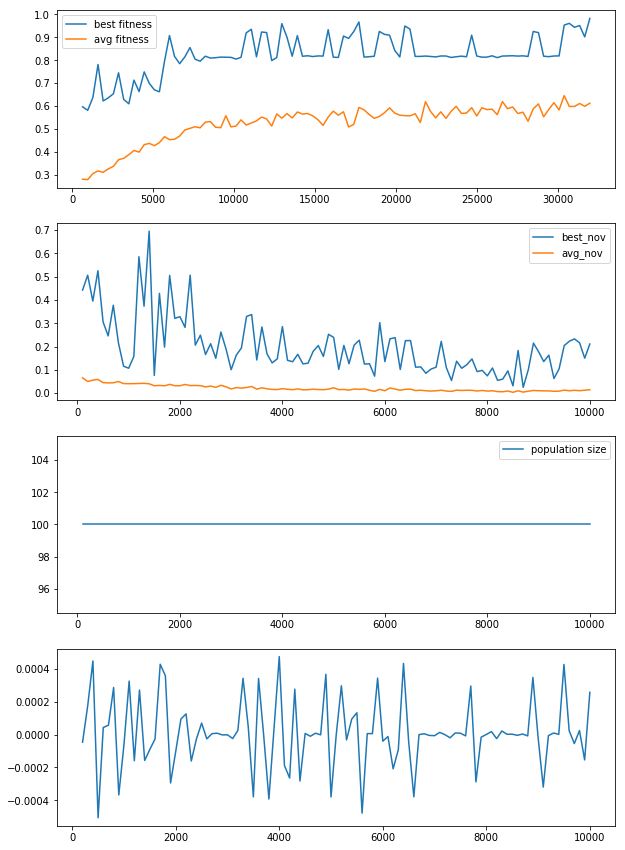

ipop_cmaes_18_3_10-42-41-1770_3165153035


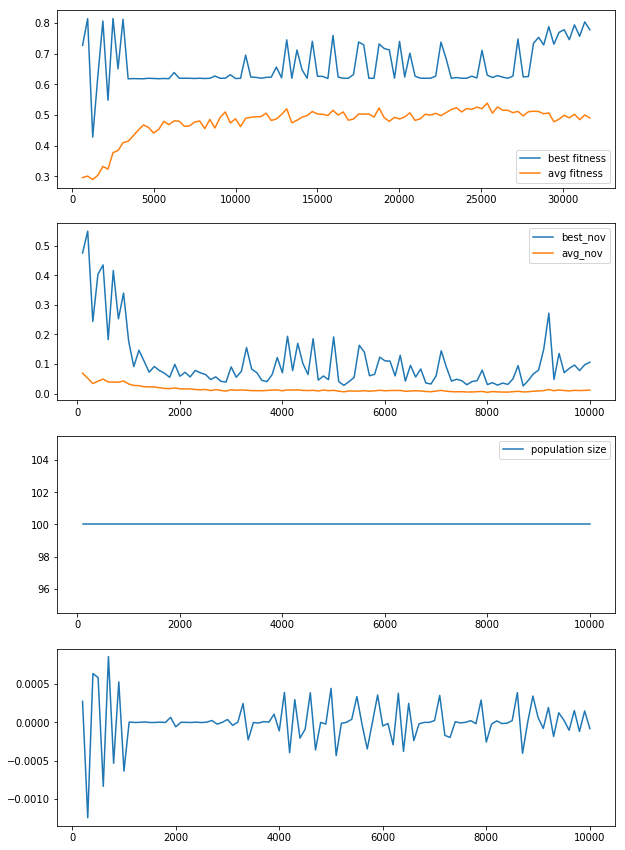

ipop_cmaes_18_3_10-42-40-203_40924774


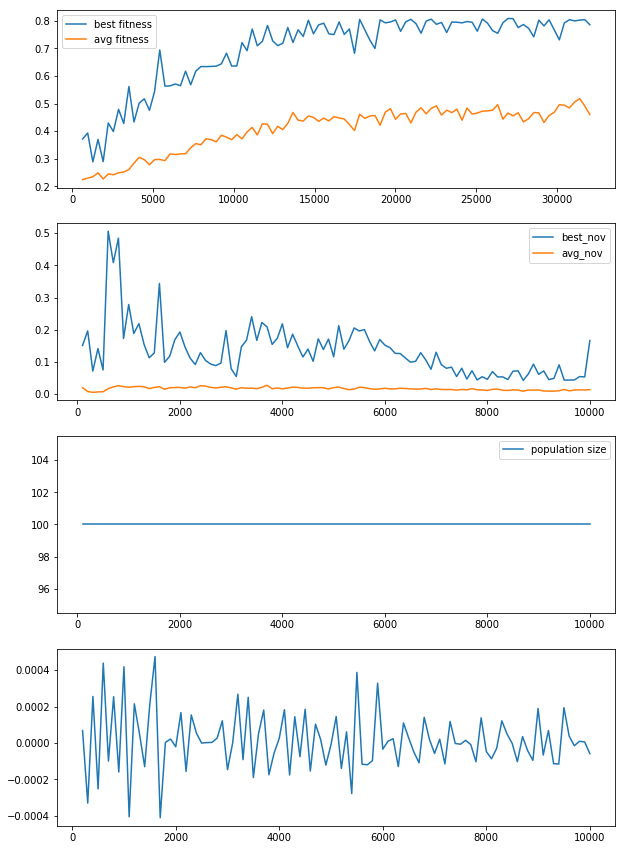

ipop_cmaes_18_3_10-42-28-8340_1807069120


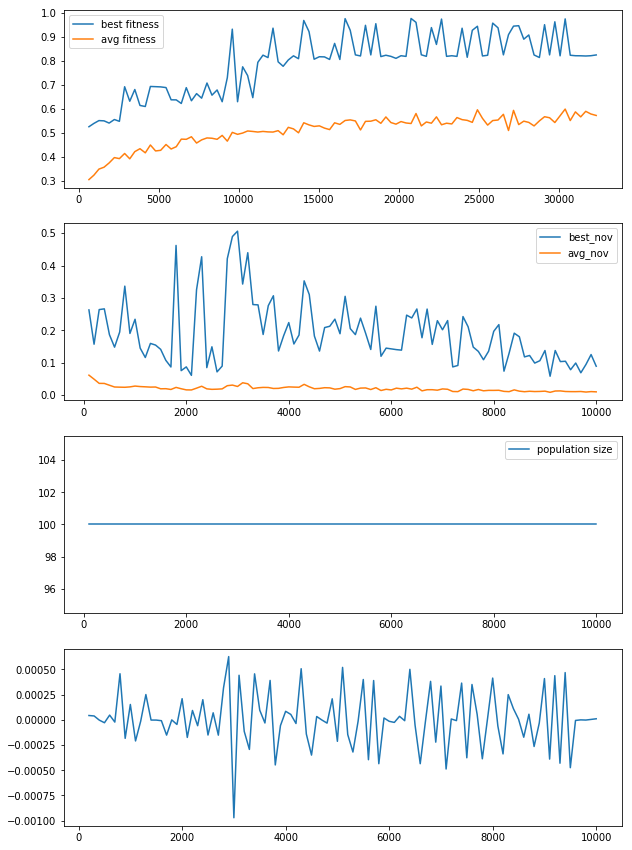

ipop_cmaes_18_3_10-42-51-1777_415061855


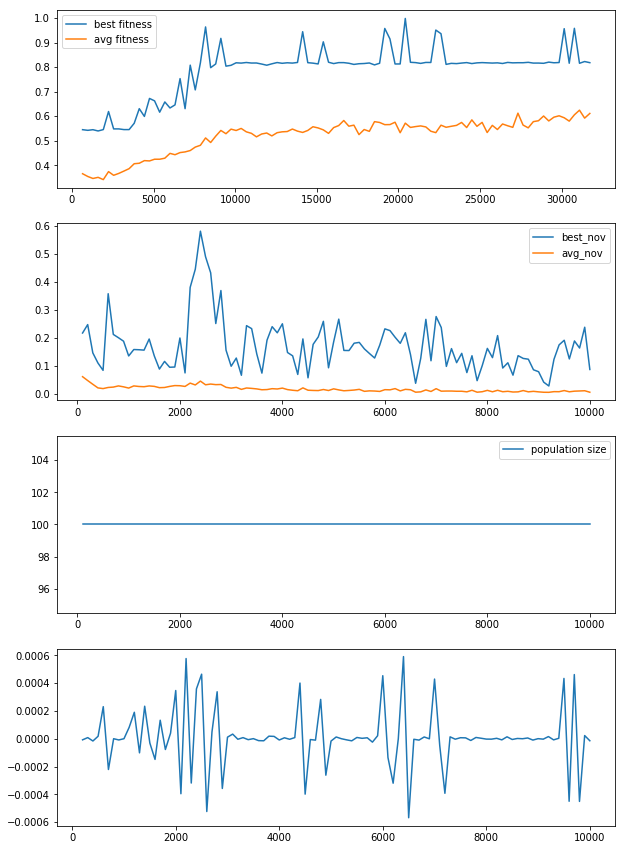

In [8]:
are_cmaes_easy_fitnov = "/home/leni/are-logs/are_cmaes_easy_fitnov/"
x_vec = []
y_vec = []
for folder in os.listdir(are_cmaes_easy_fitnov) :
    if(not os.path.isdir(are_cmaes_easy_fitnov + folder)) :
        continue
    print(folder)
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_cmaes_easy_fitnov + folder + "/fitnesses.csv")
    neval, best_nov, avg_nov,pop_size = load_all_fitnesses(are_cmaes_easy_fitnov + folder + "/novelty.csv")
    nbeval, eval_time = load_eval_time(are_cmaes_easy_fitnov + folder + "/eval_durations.csv");
    eval_times = [eval_time[0]]
    for et in eval_time :
        eval_times.append(et + eval_times[-1])
    
    
    gain = [(best_fit[i] - best_fit[i-1])/eval_time[i-1] for i in range(1,len(best_fit))]

    fig = plt.figure(figsize=[10,15])
    ax1 = fig.add_subplot(4,1,1)
    ax2 = fig.add_subplot(4,1,3)
    ax3 = fig.add_subplot(4,1,2)
    ax4 = fig.add_subplot(4,1,4)

#    ax1.set_ylim(0.4,1)
#    ax3.set_ylim(0.0,0.5)
    ax1.plot(eval_times[1:],best_fit,label="best fitness")
    ax1.plot(eval_times[1:],avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    ax3.plot(neval,best_nov,label="best_nov")
    ax3.plot(neval,avg_nov,label="avg_nov")
    ax4.plot(neval[1:],gain,label='gain')
   # ax5.plot(eval_durations)

    
    ax1.legend()
    ax2.legend()
    ax3.legend()
    plt.show()
   # animation_pop(are_cmaes_easy_fitnov + folder,pop_size,1)

ipop_cmaes_20_3_8-2-26-6657_518911916


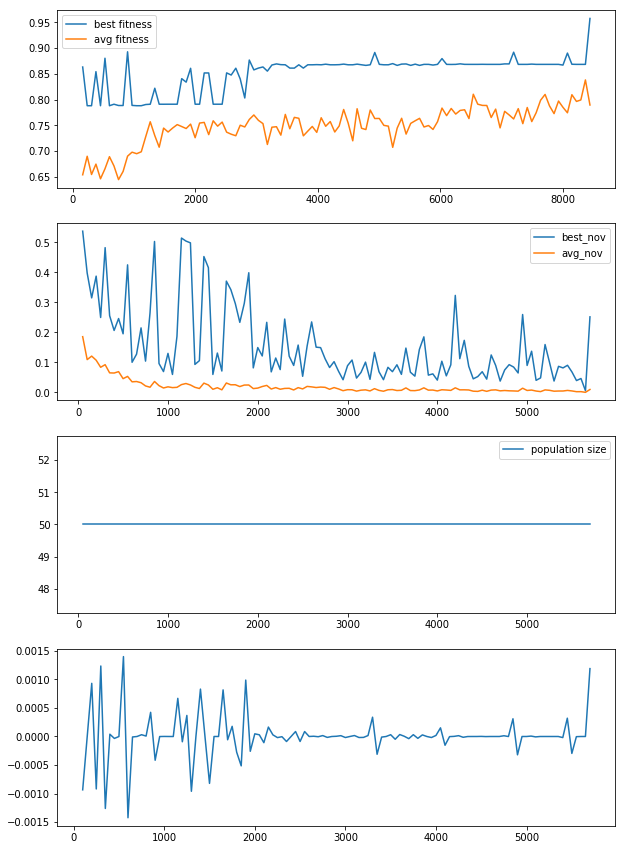

ipop_cmaes_20_3_8-4-54-4086_4022139624


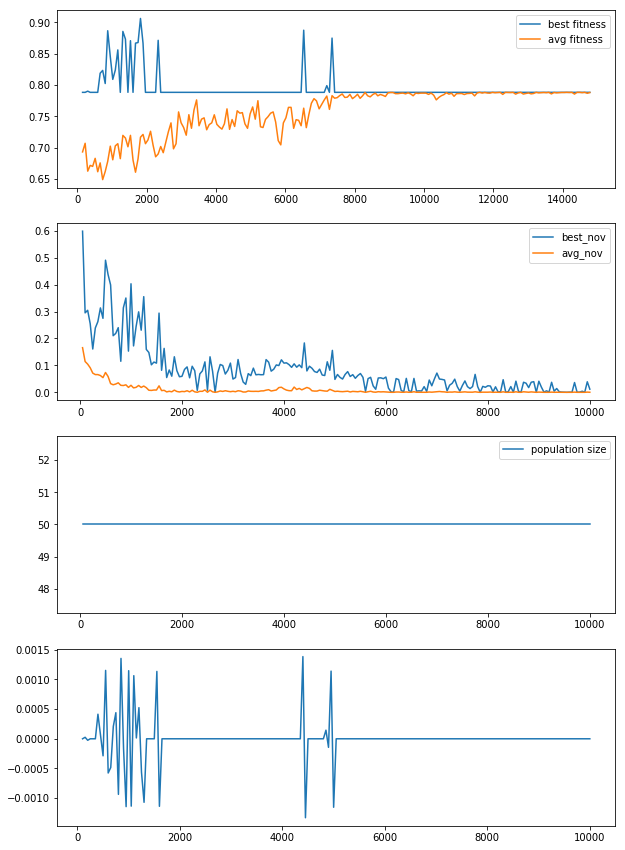

ipop_cmaes_20_3_8-2-36-6458_4207646431


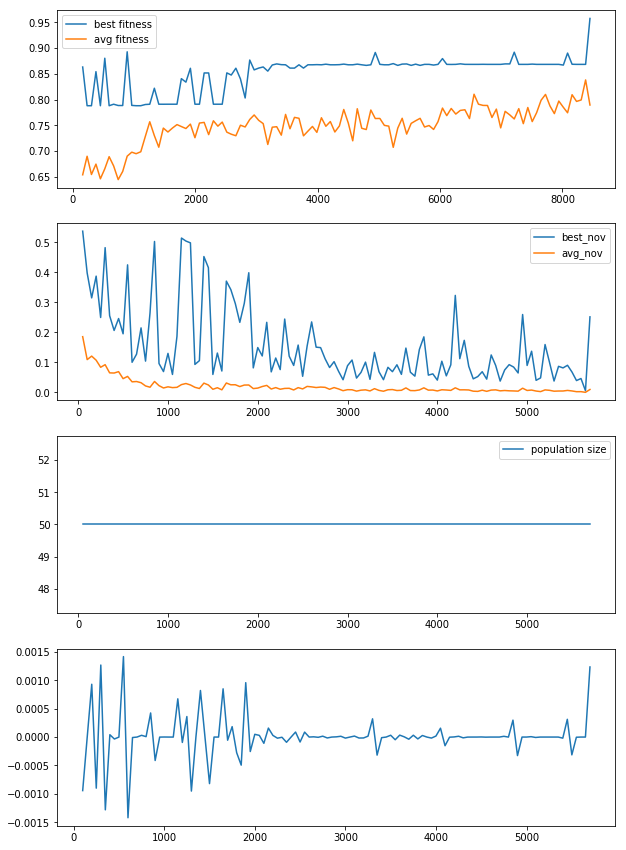

ipop_cmaes_20_3_8-2-9-9737_4246648827


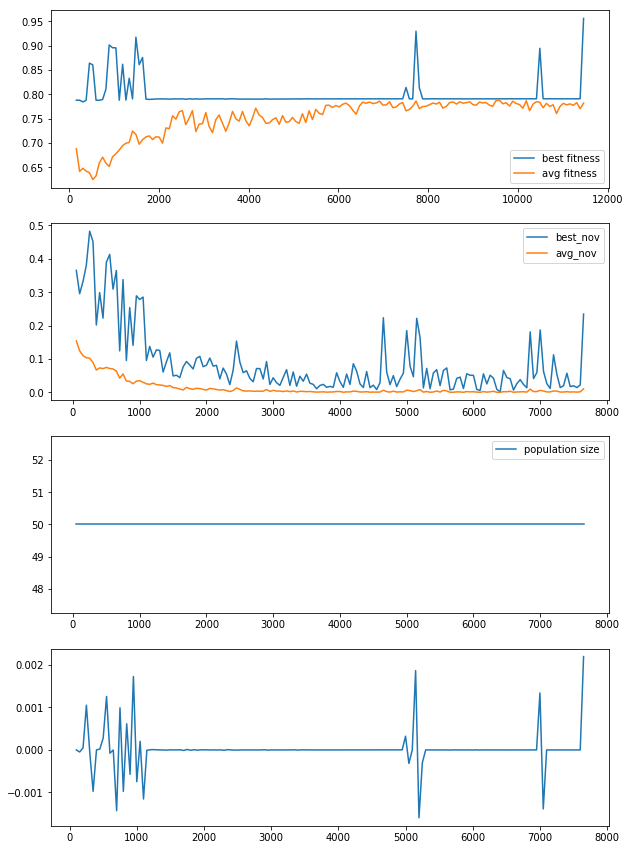

ipop_cmaes_20_3_8-2-3-3656_90825041


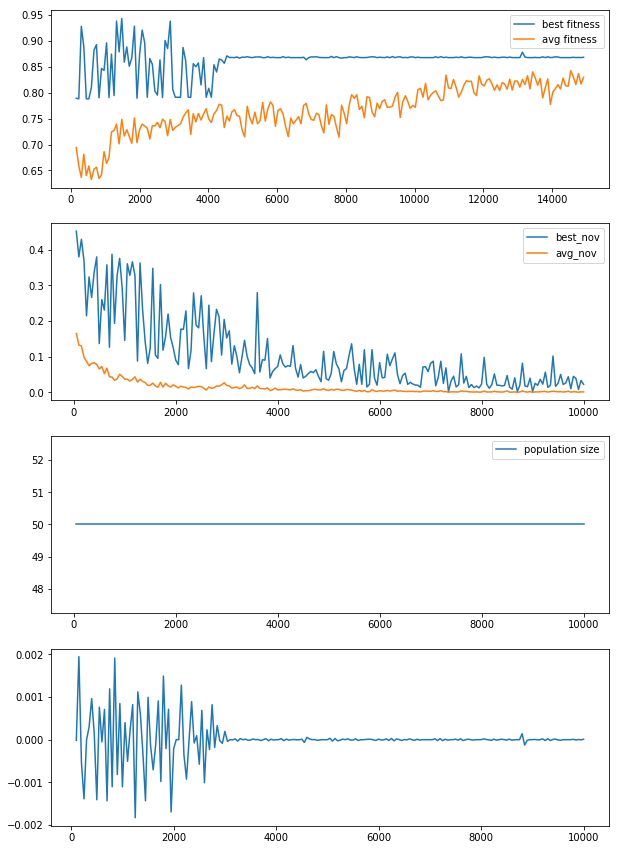

In [36]:
are_cmaes_middle_fitnov = "/home/leni/are-logs/are_cmaes_middle_fitnov/"
x_vec = []
y_vec = []
for folder in os.listdir(are_cmaes_middle_fitnov) :
    if(not os.path.isdir(are_cmaes_middle_fitnov + folder)) :
        continue
    print(folder)
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_cmaes_middle_fitnov + folder + "/fitnesses.csv")
    neval, best_nov, avg_nov,pop_size = load_all_fitnesses(are_cmaes_middle_fitnov + folder + "/novelty.csv")
    nbeval, eval_time = load_eval_time(are_cmaes_middle_fitnov + folder + "/eval_durations.csv");
    eval_times = [eval_time[0]]
    for et in eval_time :
        eval_times.append(et + eval_times[-1])
    
    
    gain = [(best_fit[i] - best_fit[i-1])/eval_time[i-1] for i in range(1,len(best_fit))]

    fig = plt.figure(figsize=[10,15])
    ax1 = fig.add_subplot(4,1,1)
    ax2 = fig.add_subplot(4,1,3)
    ax3 = fig.add_subplot(4,1,2)
    ax4 = fig.add_subplot(4,1,4)

#    ax1.set_ylim(0.4,1)
#    ax3.set_ylim(0.0,0.5)
    ax1.plot(eval_times[1:],best_fit,label="best fitness")
    ax1.plot(eval_times[1:],avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    ax3.plot(neval,best_nov,label="best_nov")
    ax3.plot(neval,avg_nov,label="avg_nov")
    ax4.plot(neval[1:],gain,label='gain')
   # ax5.plot(eval_durations)

    
    ax1.legend()
    ax2.legend()
    ax3.legend()
    plt.show()
   # animation_pop(are_cmaes_easy_fitnov + folder,pop_size,1)

ipop_cmaes_17_3_8-24-32-2450_3902837386


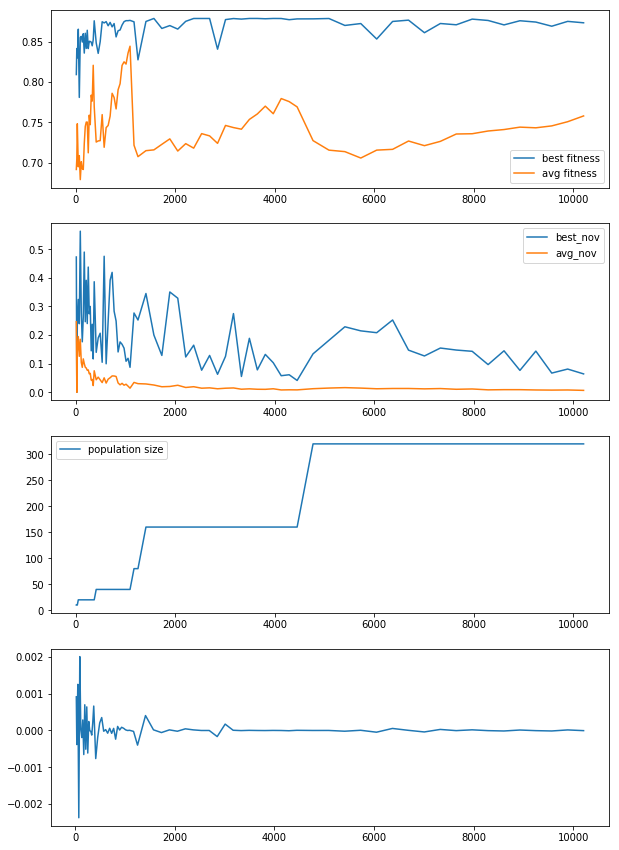

ipop_cmaes_17_3_8-24-38-8577_3368756536


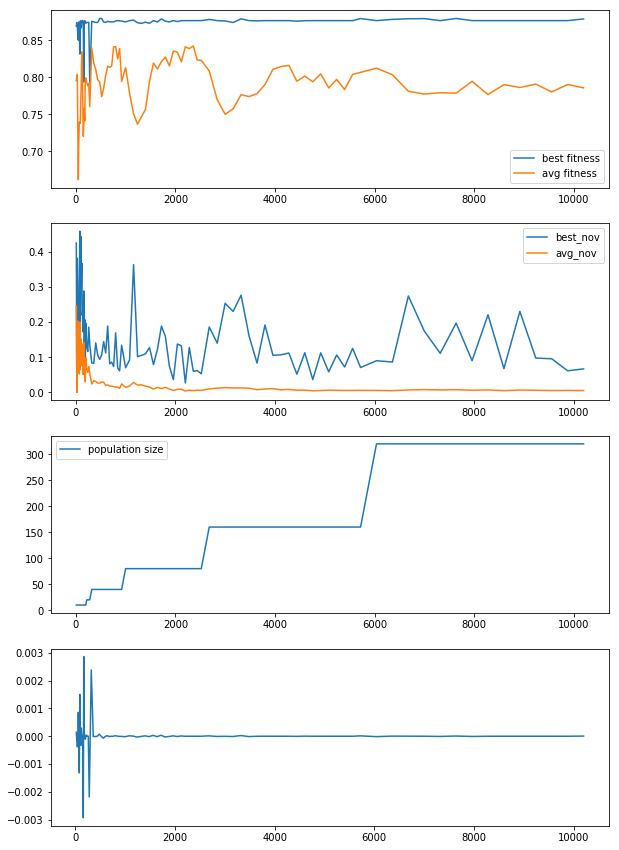

ipop_cmaes_17_3_8-24-36-6548_3981607639


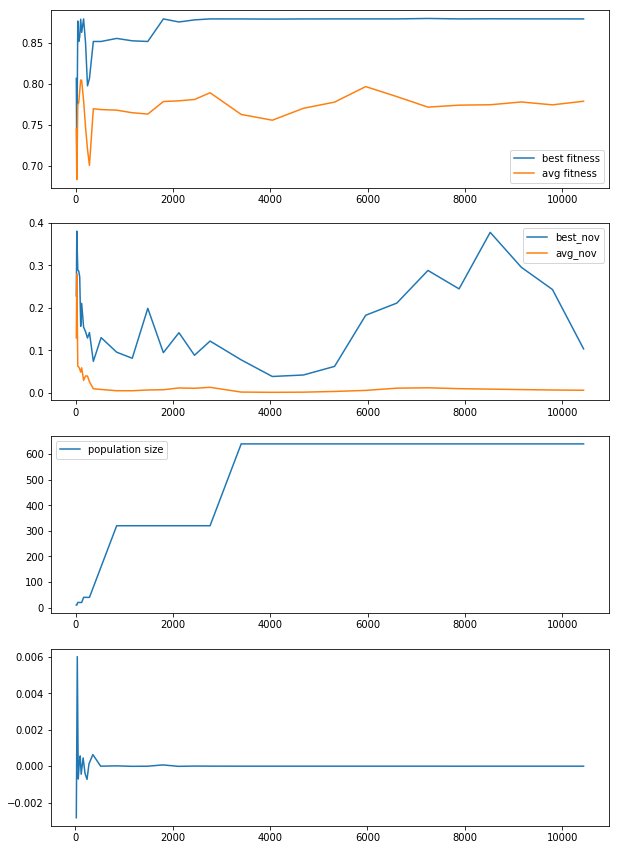

ipop_cmaes_16_3_14-16-50-194_3591780914


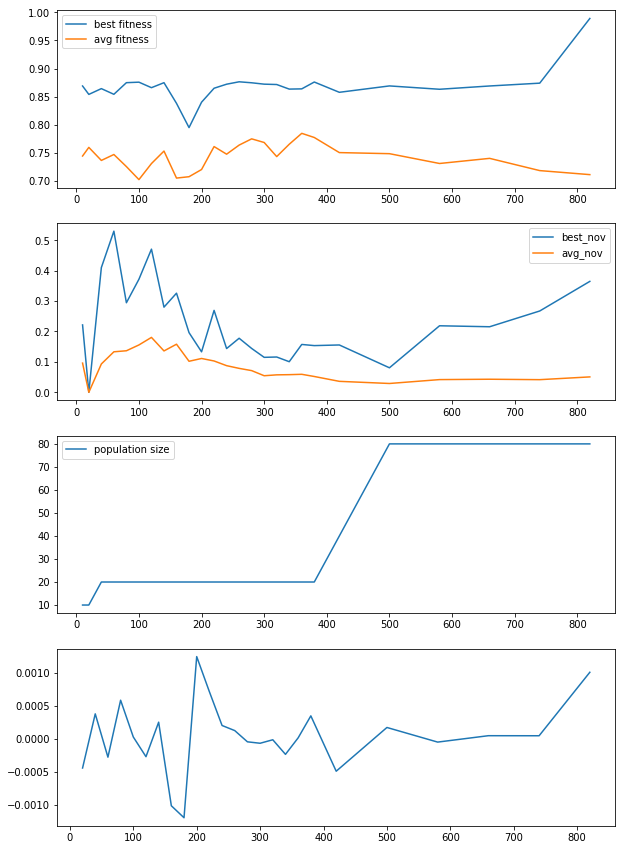

ipop_cmaes_17_3_8-24-45-5581_1950692772


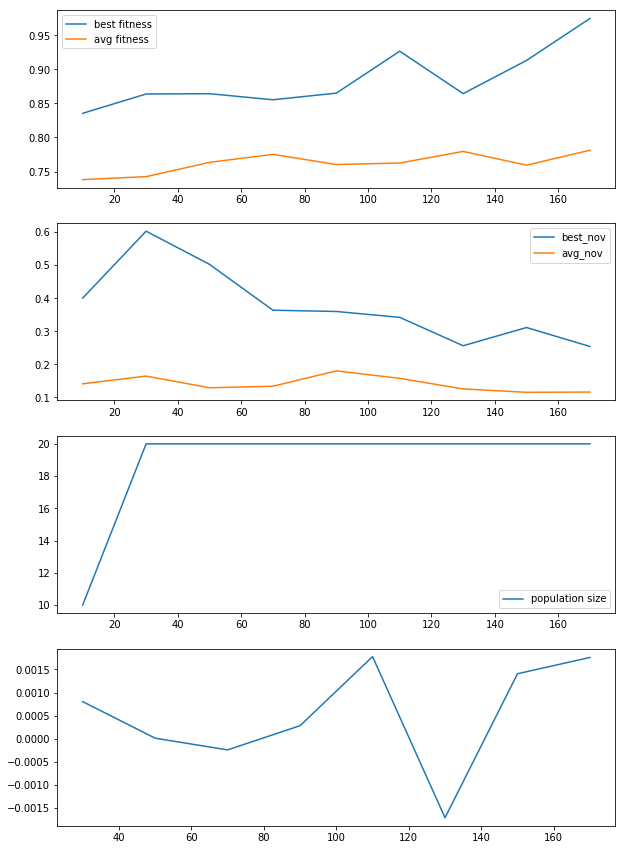

ipop_cmaes_16_3_14-14-38-8282_3839482143


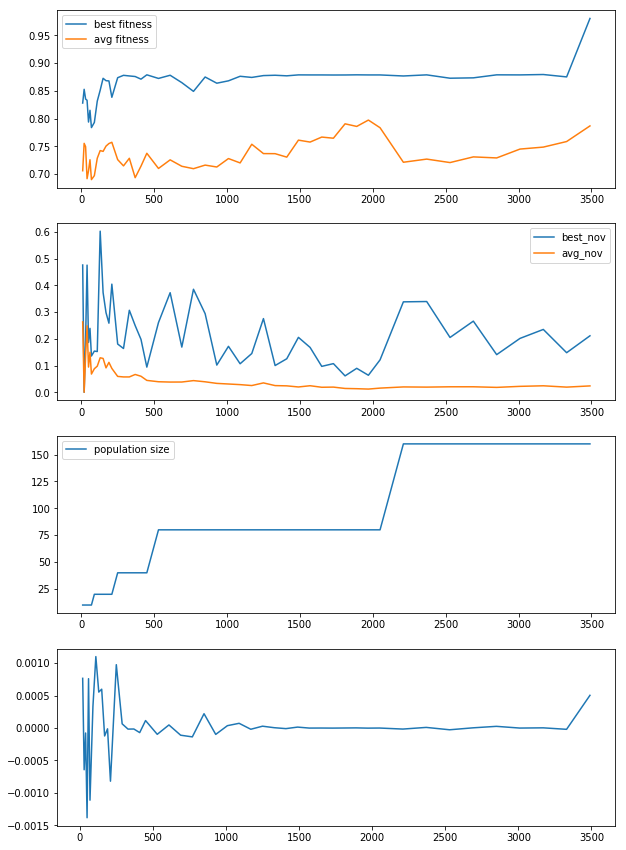

ipop_cmaes_17_3_8-24-25-5363_324505816


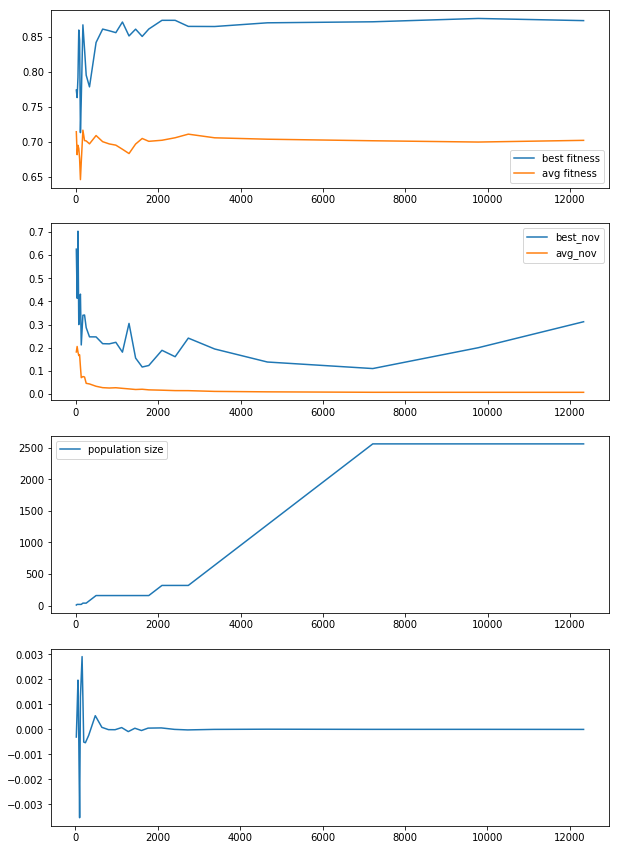

ipop_cmaes_16_3_14-15-3-3360_251561281


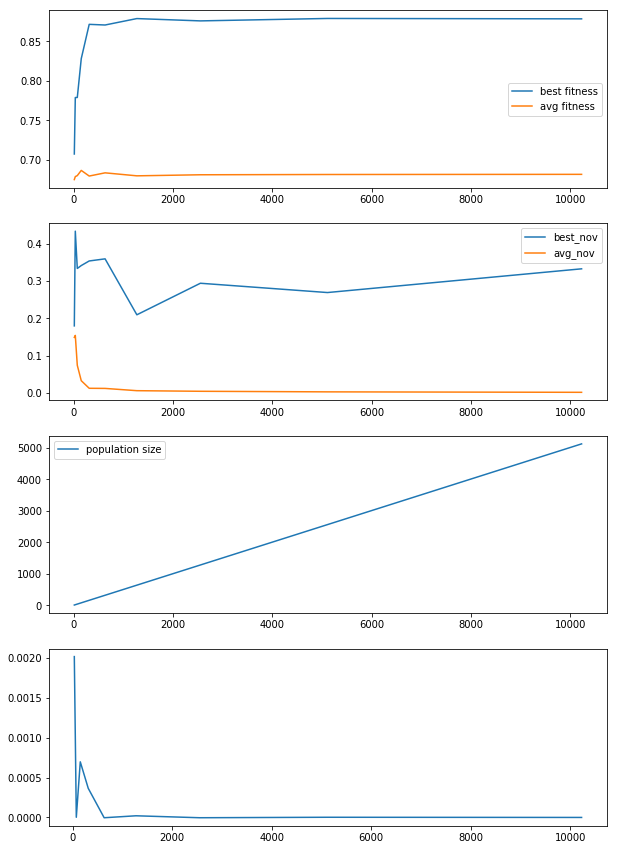

ipop_cmaes_16_3_14-17-3-3282_3222580296


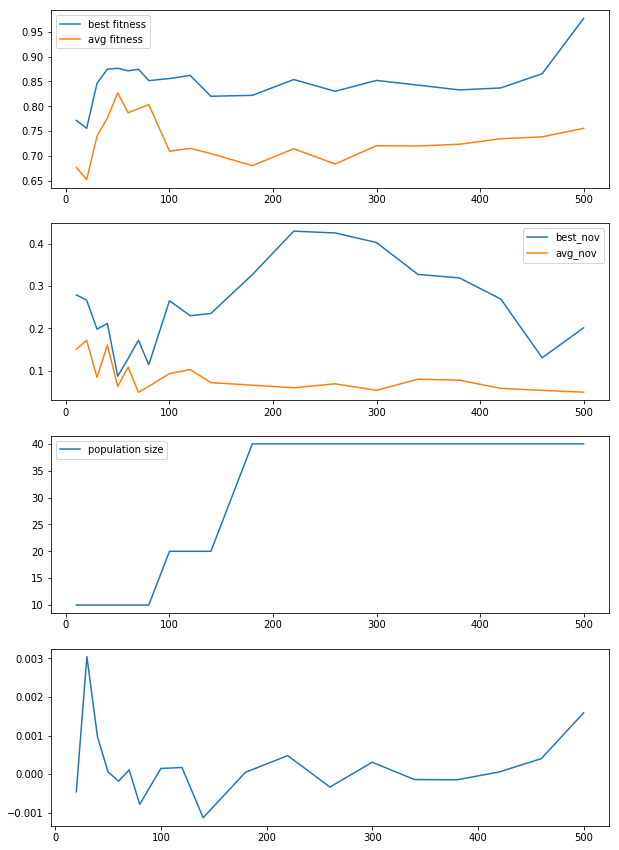

ipop_cmaes_16_3_14-17-11-1513_1714372207


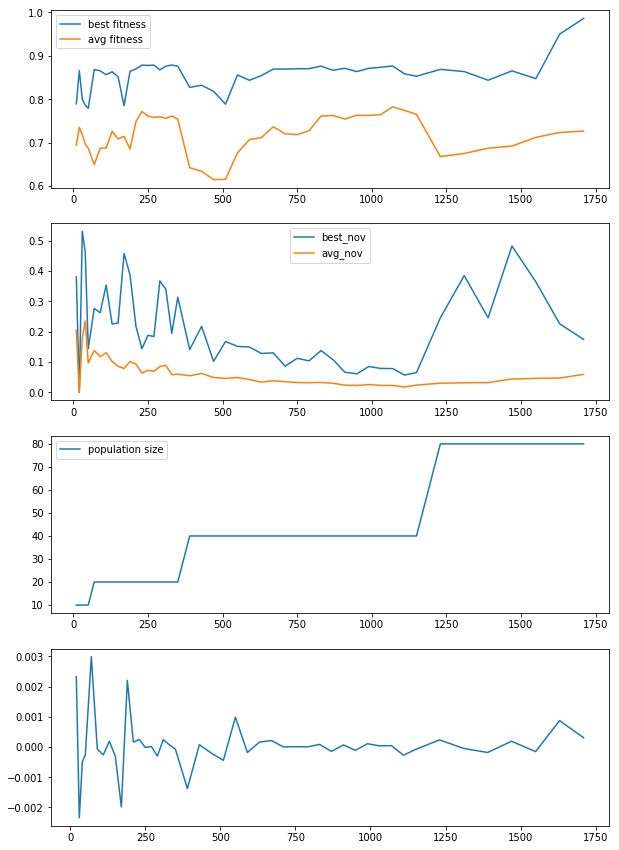

ipop_cmaes_16_3_14-14-28-8257_1640791065


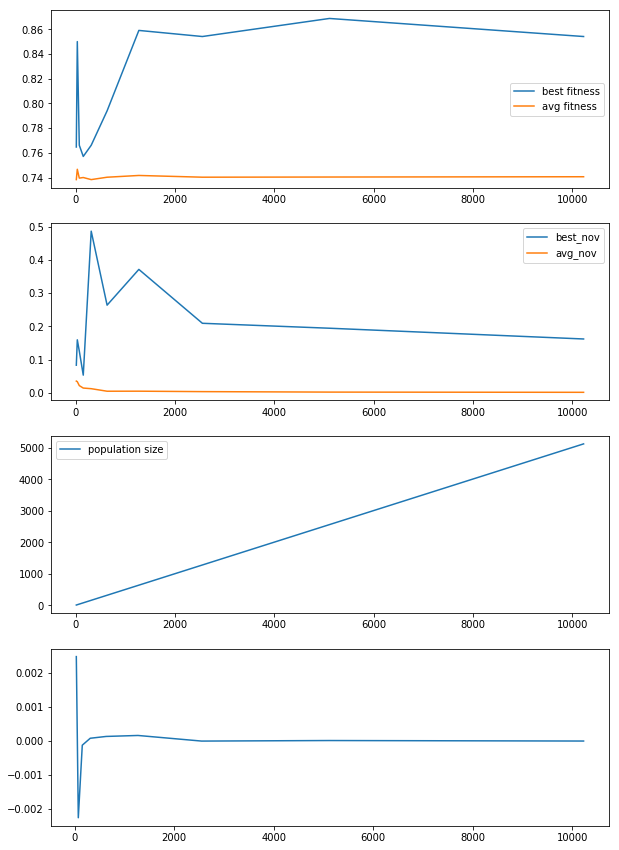

In [29]:
are_ipop_multi_fitnov = "/home/leni/are-logs/are_ipop_multi_fitnov/"
x_vec = []
y_vec = []
for folder in os.listdir(are_ipop_multi_fitnov) :
    if(not os.path.isdir(are_ipop_multi_fitnov + folder)) :
        continue
    print(folder)
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_ipop_multi_fitnov + folder + "/fitnesses.csv")
    neval, best_nov, avg_nov,pop_size = load_all_fitnesses(are_ipop_multi_fitnov + folder + "/novelty.csv")
    nbeval, eval_time = load_eval_time(are_ipop_multi_fitnov + folder + "/eval_durations.csv");

    
    gain = [(best_fit[i] - best_fit[i-1])/eval_time[i-1] for i in range(1,len(best_fit))]

    fig = plt.figure(figsize=[10,15])
    ax1 = fig.add_subplot(4,1,1)
    ax2 = fig.add_subplot(4,1,3)
    ax3 = fig.add_subplot(4,1,2)
    ax4 = fig.add_subplot(4,1,4)

#    ax1.set_ylim(0.4,1)
#    ax3.set_ylim(0.0,0.5)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    ax3.plot(neval,best_nov,label="best_nov")
    ax3.plot(neval,avg_nov,label="avg_nov")
    ax4.plot(neval[1:],gain,label='gain')
   # ax5.plot(eval_durations)

    
    ax1.legend()
    ax2.legend()
    ax3.legend()
    plt.show()
    animation_pop(are_ipop_multi_fitnov + folder,pop_size,1)

ipop_cmaes_16_3_15-16-23-3734_858056497


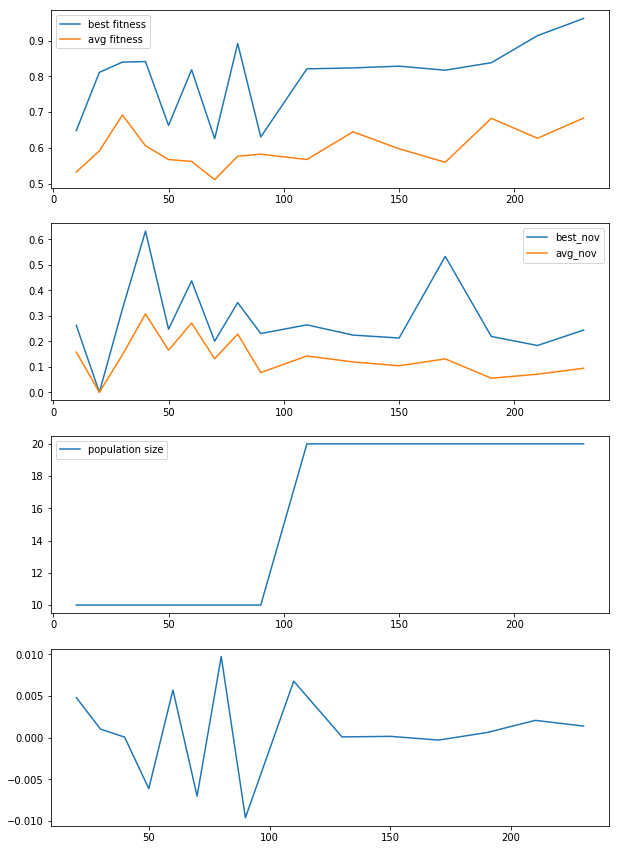

ipop_cmaes_16_3_15-16-43-3627_2078096848


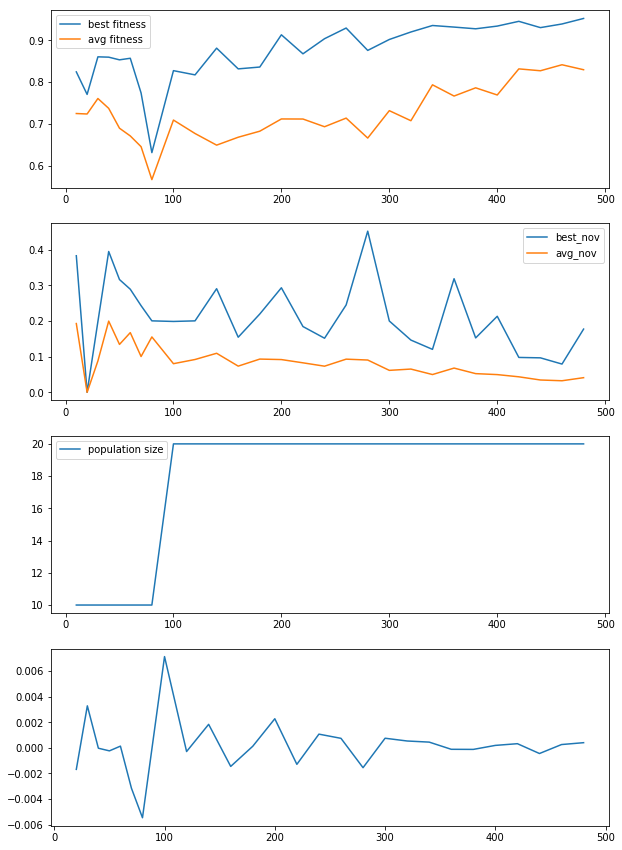

ipop_cmaes_16_3_14-6-53-3419_2370473248


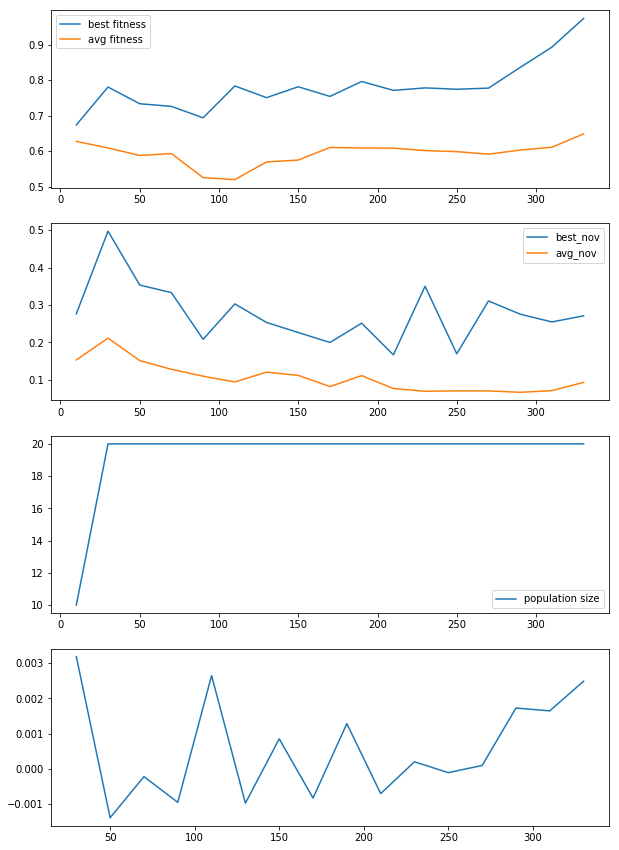

ipop_cmaes_16_3_15-16-26-6990_2834016376


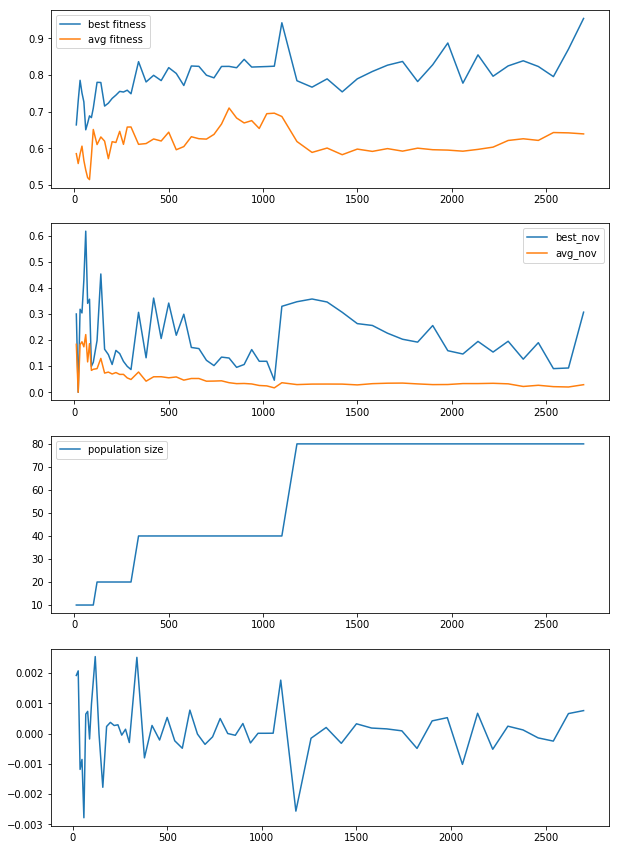

ipop_cmaes_16_3_14-3-43-3770_382106241


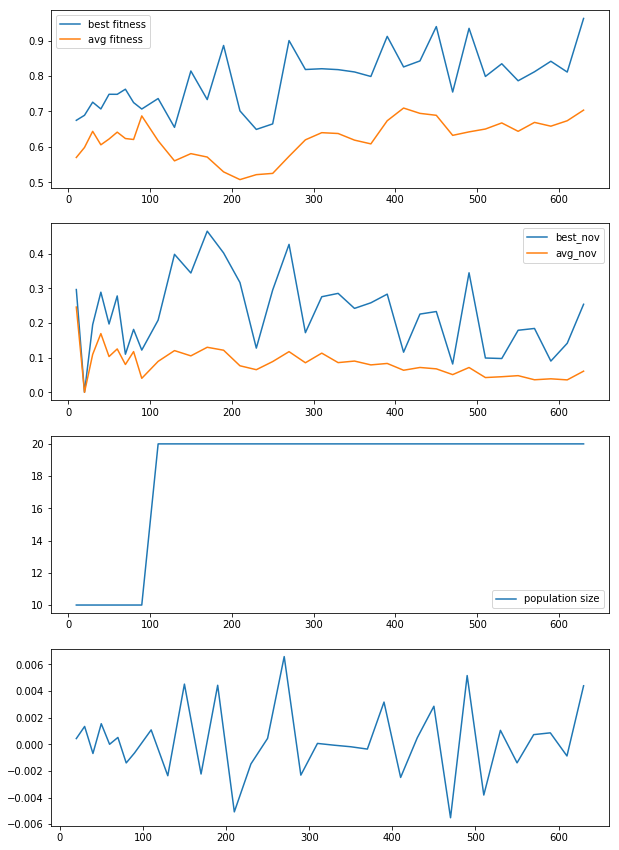

ipop_cmaes_16_3_14-4-1-1408_949772391


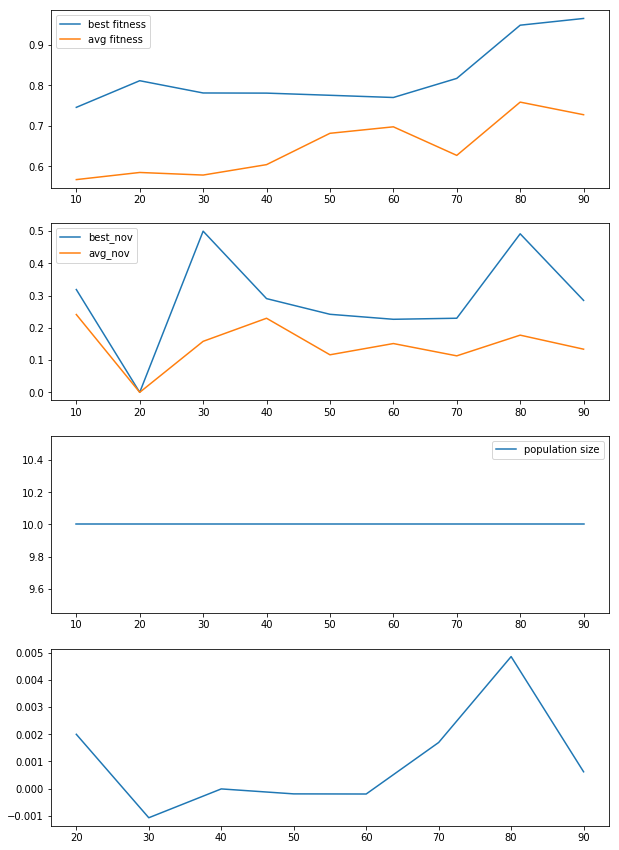

ipop_cmaes_16_3_14-3-40-564_127835263


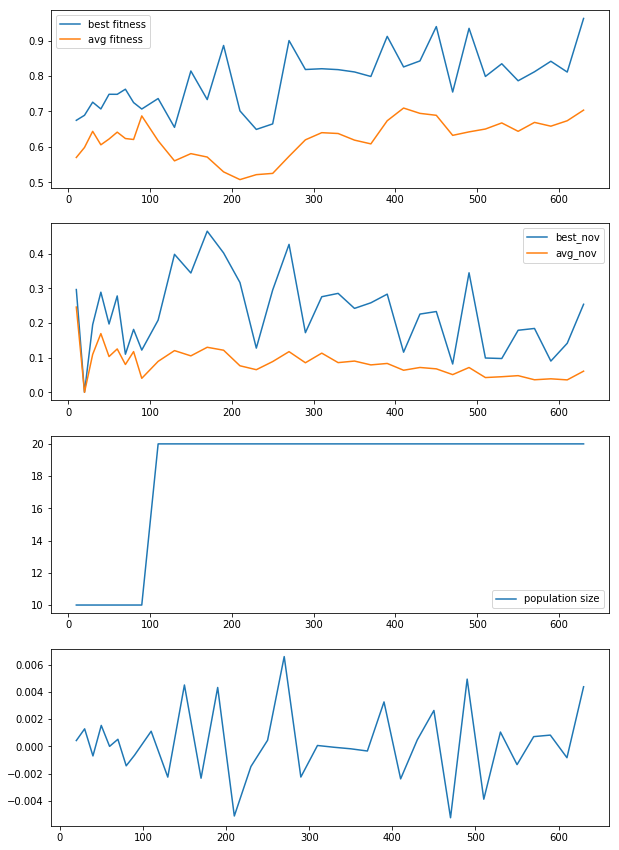

ipop_cmaes_16_3_15-16-26-6285_2808104465


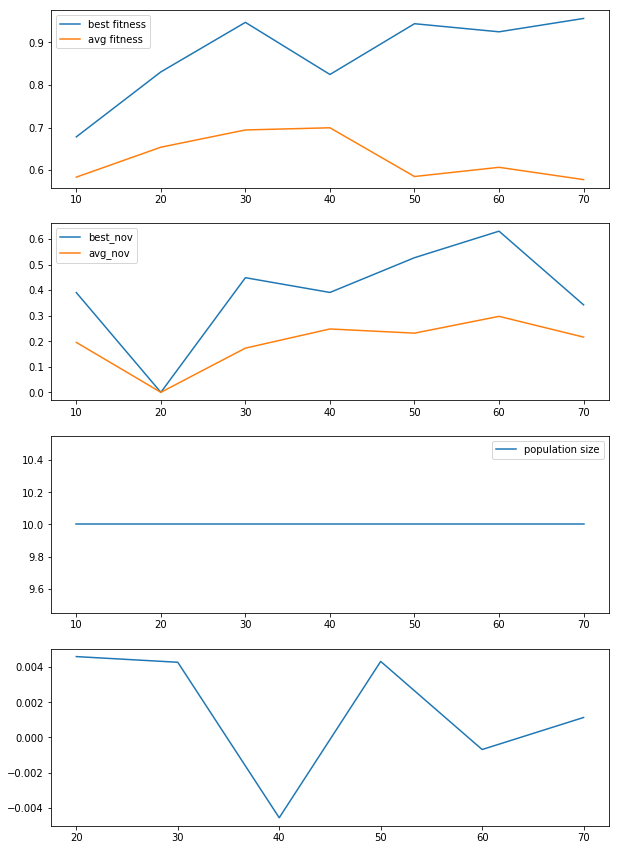

ipop_cmaes_16_3_15-16-25-5436_3300339701


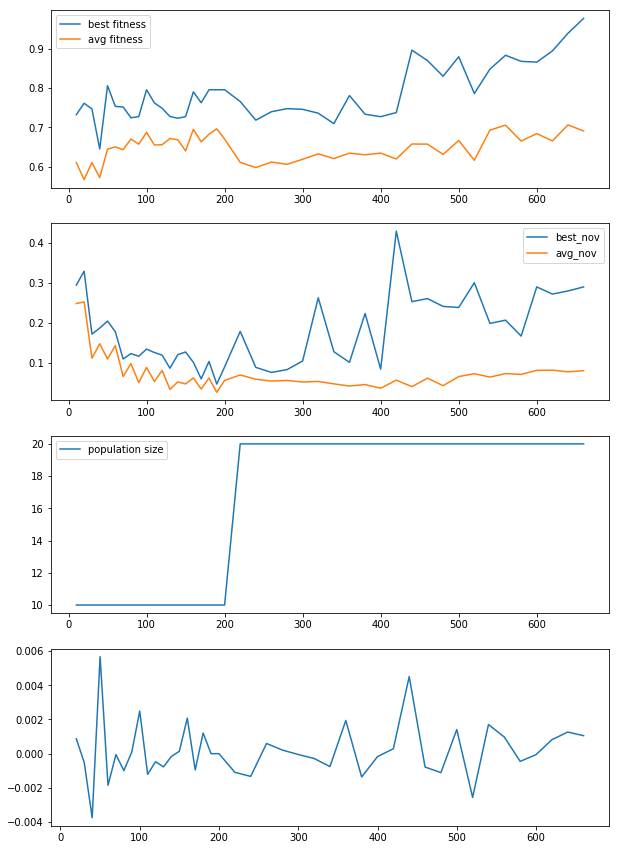

ipop_cmaes_16_3_15-10-18-8990_3066364970


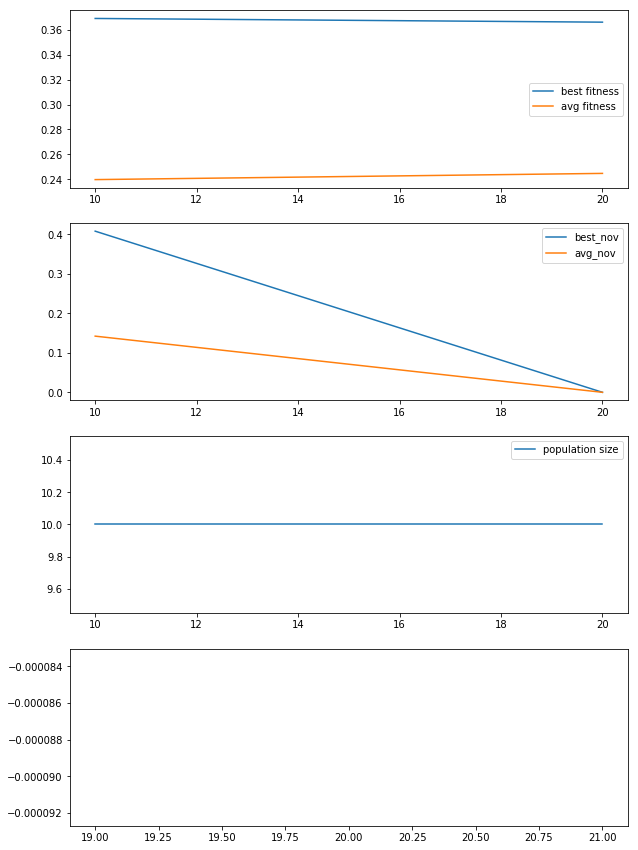

ipop_cmaes_16_3_14-6-47-7205_152514028


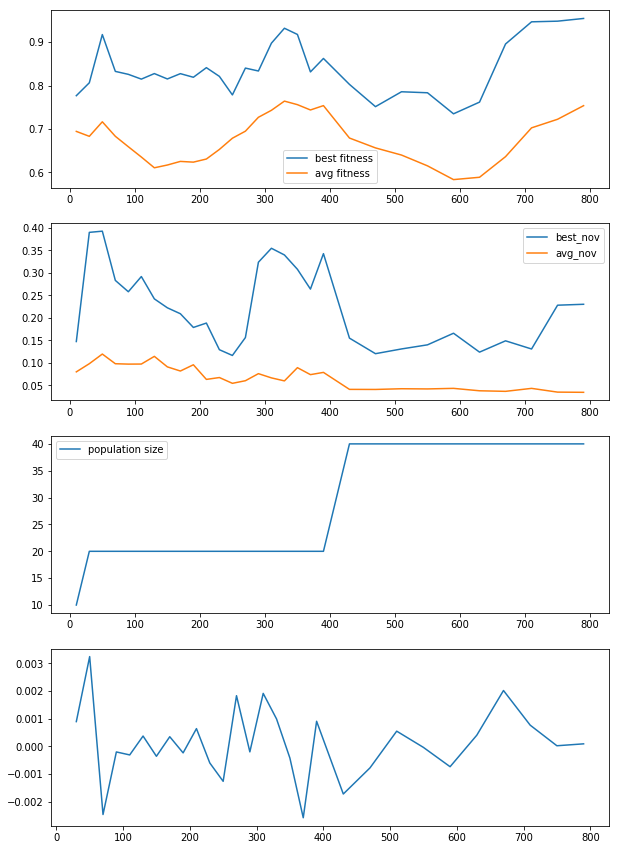

In [27]:
are_ipop_escape_fitnov = "/home/leni/are-logs/are_ipop_escape_fitnov/"
x_vec = []
y_vec = []
for folder in os.listdir(are_ipop_escape_fitnov) :
    if(not os.path.isdir(are_ipop_escape_fitnov + folder)) :
        continue
    print(folder)
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_ipop_escape_fitnov + folder + "/fitnesses.csv")
    neval, best_nov, avg_nov,pop_size = load_all_fitnesses(are_ipop_escape_fitnov + folder + "/novelty.csv")
    nbeval, eval_time = load_eval_time(are_ipop_escape_fitnov + folder + "/eval_durations.csv");

    
    gain = [(best_fit[i] - best_fit[i-1])/eval_time[i-1] for i in range(1,len(best_fit))]

    fig = plt.figure(figsize=[10,15])
    ax1 = fig.add_subplot(4,1,1)
    ax2 = fig.add_subplot(4,1,3)
    ax3 = fig.add_subplot(4,1,2)
    ax4 = fig.add_subplot(4,1,4)

#    ax1.set_ylim(0.4,1)
#    ax3.set_ylim(0.0,0.5)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    ax3.plot(neval,best_nov,label="best_nov")
    ax3.plot(neval,avg_nov,label="avg_nov")
    ax4.plot(neval[1:],gain,label='gain')
   # ax5.plot(eval_durations)

    
    ax1.legend()
    ax2.legend()
    ax3.legend()
    plt.show()
    animation_pop(are_ipop_escape_fitnov + folder,pop_size,1)

ipop_cmaes_16_3_14-12-41-1137_1276787388


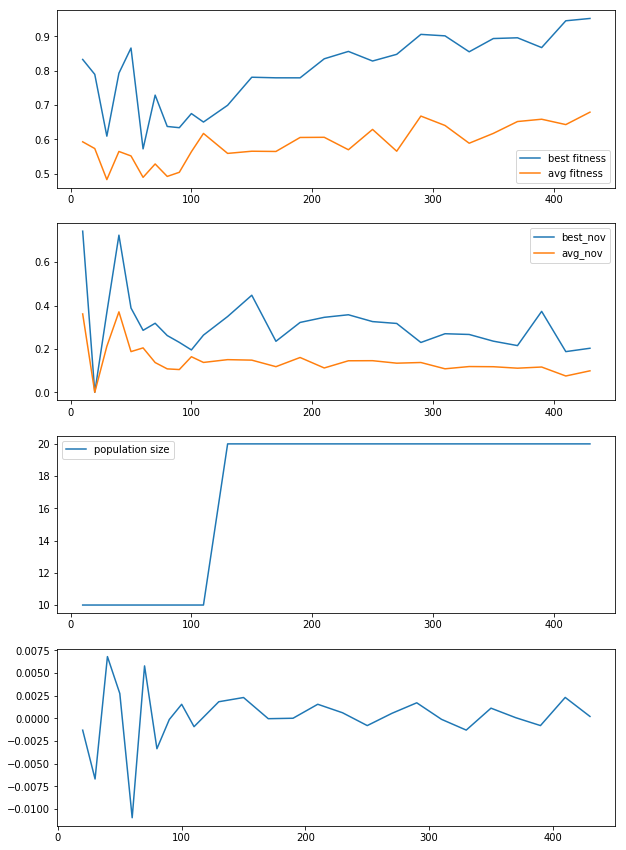

ipop_cmaes_16_3_14-12-42-2088_1152482548


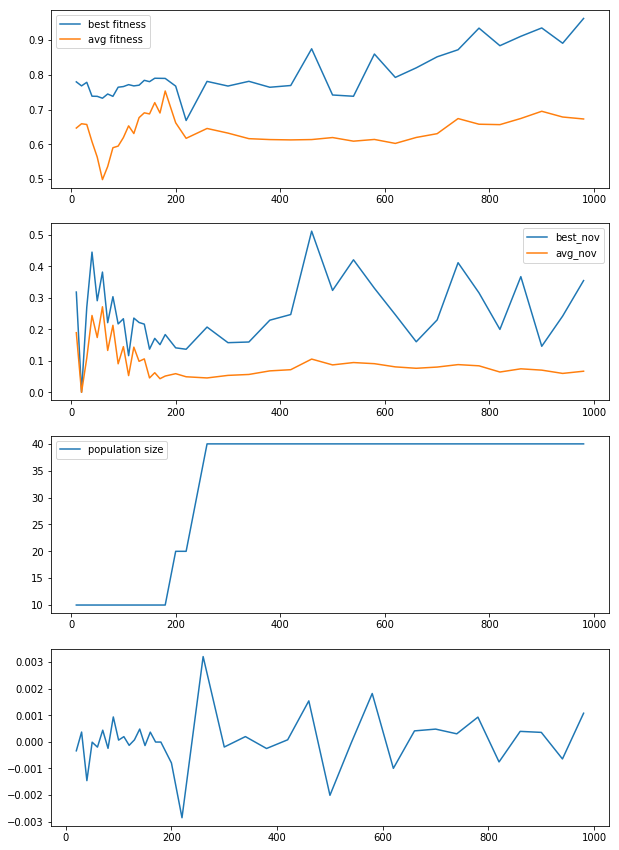

ipop_cmaes_16_3_14-12-52-2964_2692116341


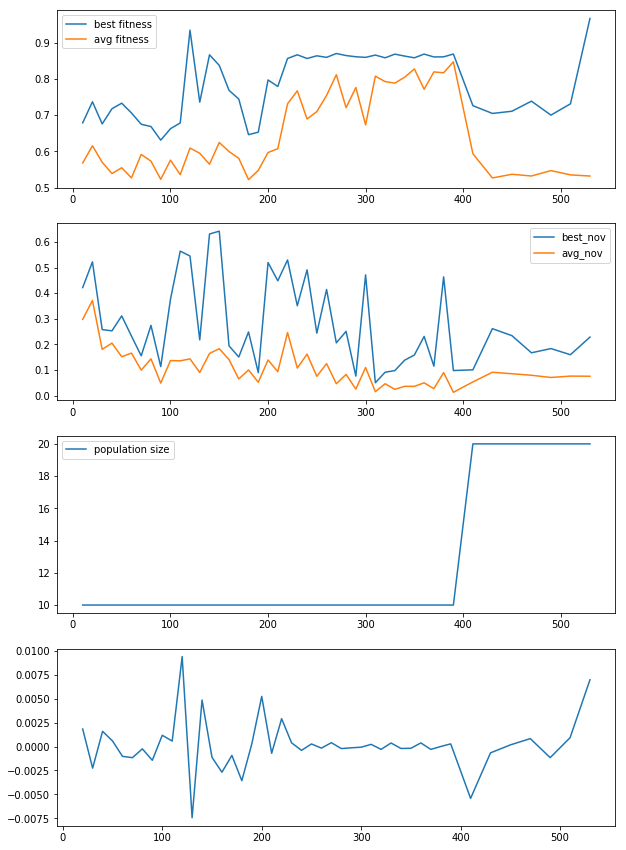

ipop_cmaes_16_3_14-12-35-5898_2048908700


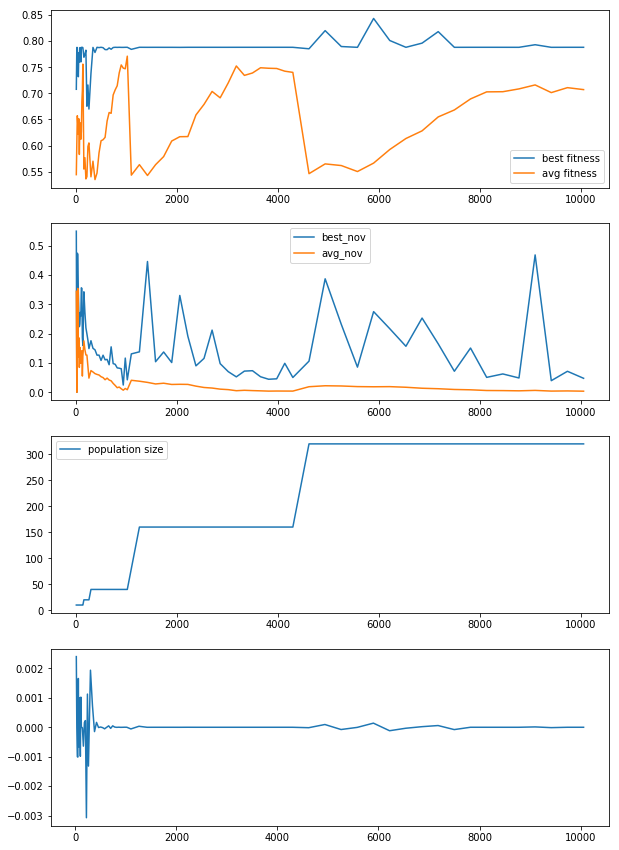

In [36]:
are_ipop_middle_fitnov = "/home/leni/are-logs/are_ipop_middle_fitnov/"
x_vec = []
y_vec = []
for folder in os.listdir(are_ipop_middle_fitnov) :
    if(not os.path.isdir(are_ipop_middle_fitnov + folder)) :
        continue
    print(folder)
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_ipop_middle_fitnov + folder + "/fitnesses.csv")
    neval, best_nov, avg_nov,pop_size = load_all_fitnesses(are_ipop_middle_fitnov + folder + "/novelty.csv")
    nbeval, eval_time = load_eval_time(are_ipop_middle_fitnov + folder + "/eval_durations.csv");

    
    gain = [(best_fit[i] - best_fit[i-1])/eval_time[i-1] for i in range(1,len(best_fit))]

    fig = plt.figure(figsize=[10,15])
    ax1 = fig.add_subplot(4,1,1)
    ax2 = fig.add_subplot(4,1,3)
    ax3 = fig.add_subplot(4,1,2)
    ax4 = fig.add_subplot(4,1,4)

#    ax1.set_ylim(0.4,1)
#    ax3.set_ylim(0.0,0.5)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    ax3.plot(neval,best_nov,label="best_nov")
    ax3.plot(neval,avg_nov,label="avg_nov")
    ax4.plot(neval[1:],gain,label='gain')
   # ax5.plot(eval_durations)

    
    ax1.legend()
    ax2.legend()
    ax3.legend()
    plt.show()
    animation_pop(are_ipop_middle_fitnov + folder,pop_size,1)

ipop_cmaes_20_3_8-2-26-6657_518911916


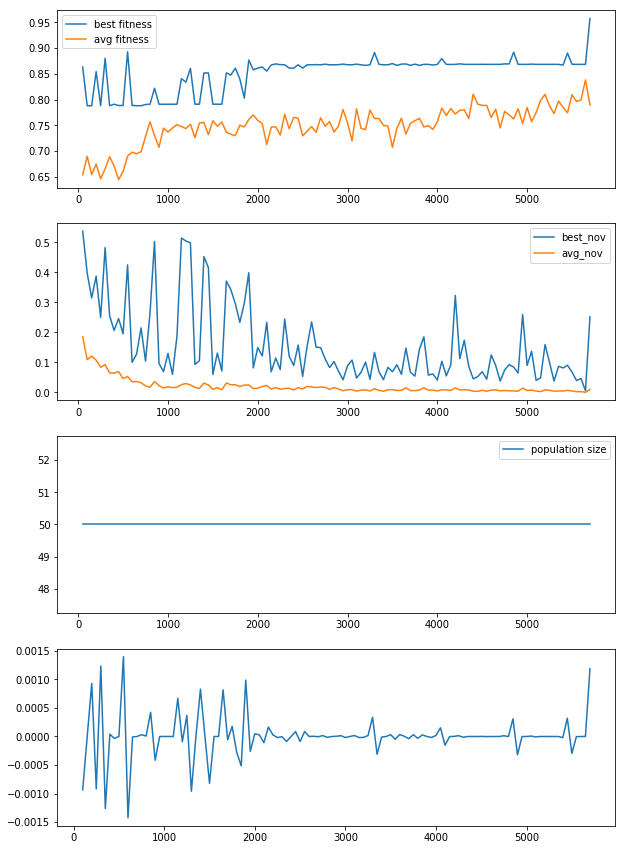

ipop_cmaes_20_3_8-4-54-4086_4022139624


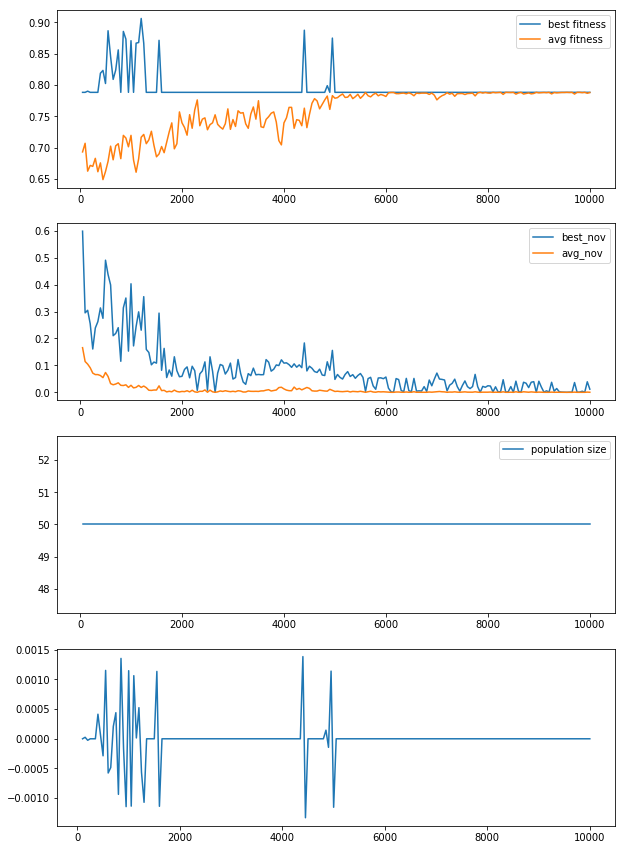

ipop_cmaes_20_3_8-2-36-6458_4207646431


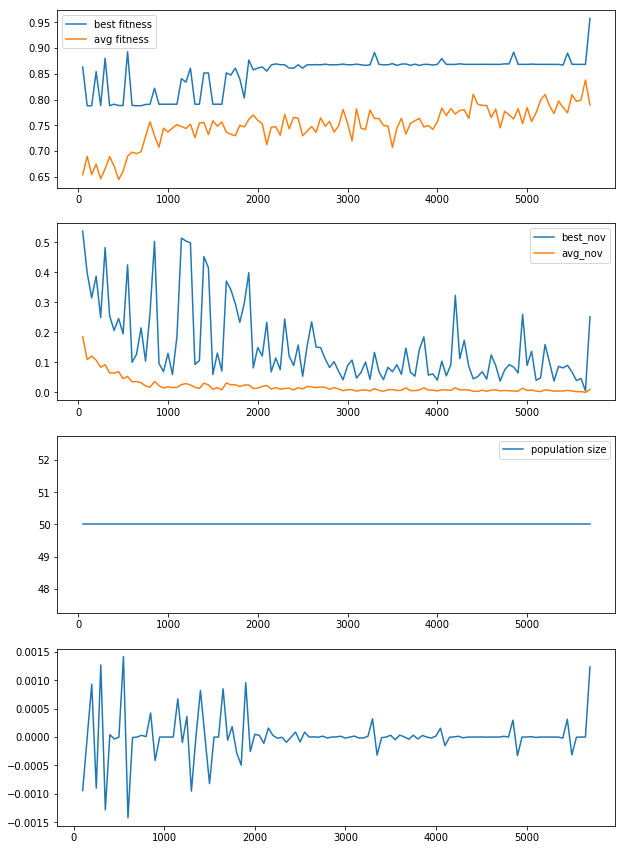

ipop_cmaes_20_3_8-2-9-9737_4246648827


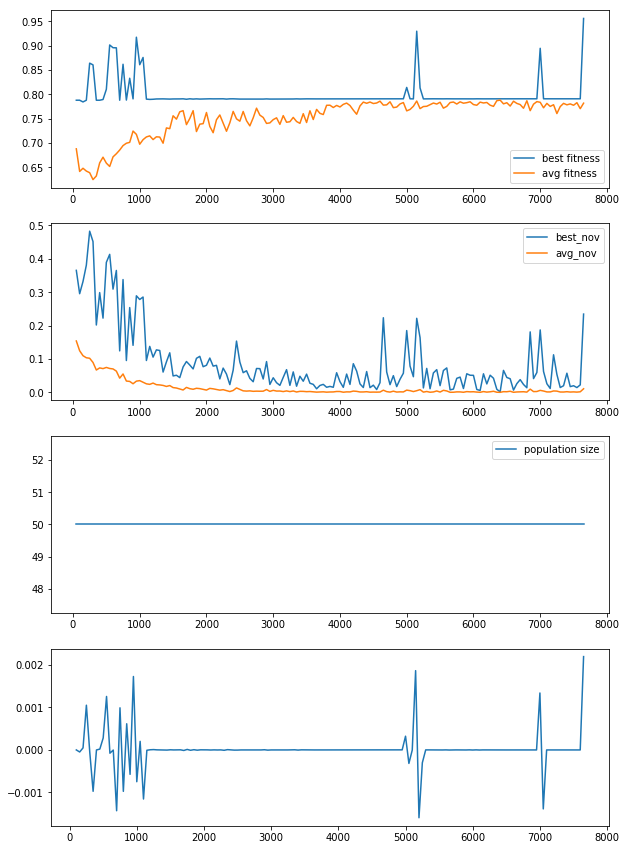

ipop_cmaes_20_3_8-2-3-3656_90825041


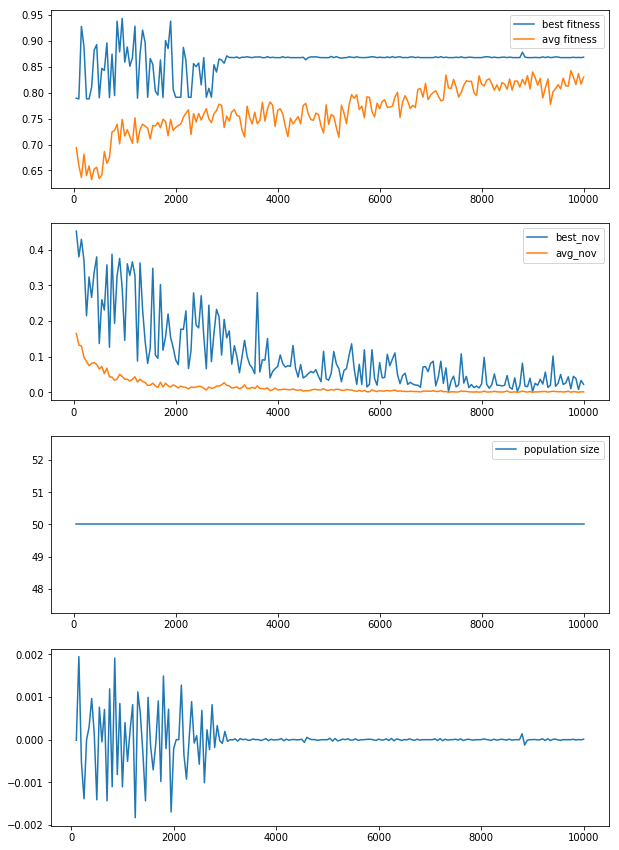

In [39]:
are_cmaes_middle_fitnov = "/home/leni/are-logs/are_cmaes_middle_fitnov/"
x_vec = []
y_vec = []
for folder in os.listdir(are_cmaes_middle_fitnov) :
    if(not os.path.isdir(are_cmaes_middle_fitnov + folder)) :
        continue
    print(folder)
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_cmaes_middle_fitnov + folder + "/fitnesses.csv")
    neval, best_nov, avg_nov,pop_size = load_all_fitnesses(are_cmaes_middle_fitnov + folder + "/novelty.csv")
    nbeval, eval_time = load_eval_time(are_cmaes_middle_fitnov + folder + "/eval_durations.csv");

    
    gain = [(best_fit[i] - best_fit[i-1])/eval_time[i-1] for i in range(1,len(best_fit))]

    fig = plt.figure(figsize=[10,15])
    ax1 = fig.add_subplot(4,1,1)
    ax2 = fig.add_subplot(4,1,3)
    ax3 = fig.add_subplot(4,1,2)
    ax4 = fig.add_subplot(4,1,4)

#    ax1.set_ylim(0.4,1)
#    ax3.set_ylim(0.0,0.5)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    ax3.plot(neval,best_nov,label="best_nov")
    ax3.plot(neval,avg_nov,label="avg_nov")
    ax4.plot(neval[1:],gain,label='gain')
   # ax5.plot(eval_durations)

    
    ax1.legend()
    ax2.legend()
    ax3.legend()
    plt.show()
    animation_pop(are_cmaes_middle_fitnov + folder,pop_size,1)

ipop_cmaes_18_3_10-42-51-1920_1504943530
ipop_cmaes_18_3_10-42-41-1770_3165153035
ipop_cmaes_18_3_10-42-40-203_40924774
ipop_cmaes_18_3_10-42-28-8340_1807069120
ipop_cmaes_18_3_10-42-51-1777_415061855


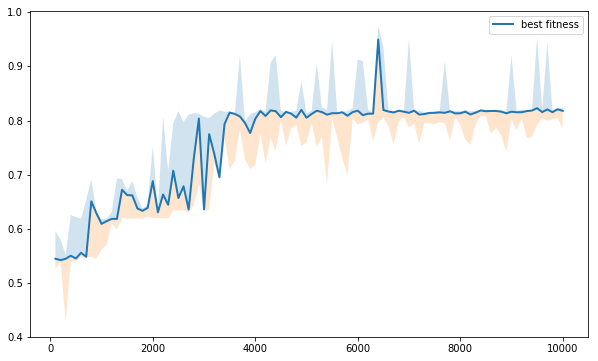

In [15]:
are_cmaes_easy_fitnov = "/home/leni/are-logs/are_cmaes_easy_fitnov/"
neval, med, p3, p1 = load_fit_from_folder(are_cmaes_easy_fitnov)

fig, ax1 = plt.subplots(figsize=(10,6))
ax1.plot(neval,med,linewidth=2,label="best fitness")
ax1.fill_between(neval,p3,med,alpha=.2)
ax1.fill_between(neval,p1,med,alpha=.2)
plt.legend()
plt.show()

In [44]:
are_cmaes_middle_fitnov = "/home/leni/are-logs/are_cmaes_middle_fitnov/"
neval, med, p3, p1 = load_fit_from_folder(are_cmaes_middle_fitnov,120)

fig, ax1 = plt.subplots(figsize=(10,6))
ax1.plot(neval[:120],med,linewidth=2,label="best fitness")
ax1.fill_between(neval[:120],p3,med,alpha=.2)
ax1.fill_between(neval[:120],p1,med,alpha=.2)
plt.legend()
plt.show()

ipop_cmaes_20_3_8-2-26-6657_518911916
ipop_cmaes_20_3_8-4-54-4086_4022139624
ipop_cmaes_20_3_8-2-36-6458_4207646431
ipop_cmaes_20_3_8-2-9-9737_4246648827
ipop_cmaes_20_3_8-2-3-3656_90825041


ValueError: cannot copy sequence with size 114 to array axis with dimension 120

ipop_cmaes_18_3_10-42-51-1920_1504943530
ipop_cmaes_18_3_10-42-41-1770_3165153035
ipop_cmaes_18_3_10-42-40-203_40924774
ipop_cmaes_18_3_10-42-28-8340_1807069120
ipop_cmaes_18_3_10-42-51-1777_415061855


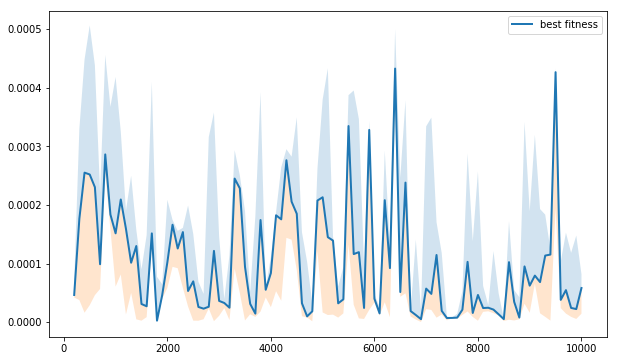

In [24]:
are_cmaes_easy_fitnov = "/home/leni/are-logs/are_cmaes_easy_fitnov/"
neval, med, p3, p1 = load_te_from_folder(are_cmaes_easy_fitnov)
fig, ax1 = plt.subplots(figsize=(10,6))
ax1.plot(neval[1:],med,linewidth=2,label="best fitness")
ax1.fill_between(neval[1:],p3,med,alpha=.2)
ax1.fill_between(neval[1:],p1,med,alpha=.2)
plt.legend()
plt.show()

In [55]:
are_cmaes_middle_fitnov = "/home/leni/are-logs/are_cmaes_middle_fitnov/"
for folder in os.listdir(are_cmaes_middle_fitnov) :
    if(not os.path.isdir(are_cmaes_middle_fitnov + folder)) :
        continue
    if(folder.split("_")[0] != "ipop") :
        continue
    print(folder)
    samples = load_samples(are_cmaes_middle_fitnov + folder)
    print(len(samples))
    print(np.std(samples[0]))
    print(np.max(samples[0]))
    print(np.min(samples[0]))

ipop_cmaes_20_3_8-2-26-6657_518911916
5700
2.6425919323511904
9.8431
-6.5537
ipop_cmaes_20_3_8-4-54-4086_4022139624
10000
1.9981148787575012
5.81217
-4.05982
ipop_cmaes_20_3_8-2-36-6458_4207646431
5700
2.6425919323511904
9.8431
-6.5537
ipop_cmaes_20_3_8-2-9-9737_4246648827
7650
2.319986803230927
5.63752
-6.19874
ipop_cmaes_20_3_8-2-3-3656_90825041
10000
2.1145705568254867
4.82506
-5.45464


In [57]:
are_cmaes_easy_fitnov = "/home/leni/are-logs/are_cmaes_easy_fitnov/"
for folder in os.listdir(are_cmaes_easy_fitnov) :
    if(not os.path.isdir(are_cmaes_easy_fitnov + folder)) :
        continue
    if(folder.split("_")[0] != "ipop") :
        continue
    print(folder)
    samples = load_samples(are_cmaes_easy_fitnov + folder)
    print(len(samples))
    print(np.std(samples[0]))
    print(np.max(samples[0]))
    print(np.min(samples[0]))

ipop_cmaes_18_3_10-42-51-1920_1504943530
10000
4.357464250513546
10.6842
-9.71576
ipop_cmaes_18_3_10-42-41-1770_3165153035
10000
4.36126077453735
10.8545
-11.2775
ipop_cmaes_18_3_10-42-40-203_40924774
10000
5.180267769210309
10.749
-13.6884
ipop_cmaes_18_3_10-42-28-8340_1807069120
10000
4.640362681684188
11.33
-12.8124
ipop_cmaes_18_3_10-42-51-1777_415061855
10000
4.583787968141632
10.0815
-11.8249


ipop_cmaes_20_3_7-19-20-717_3018757566


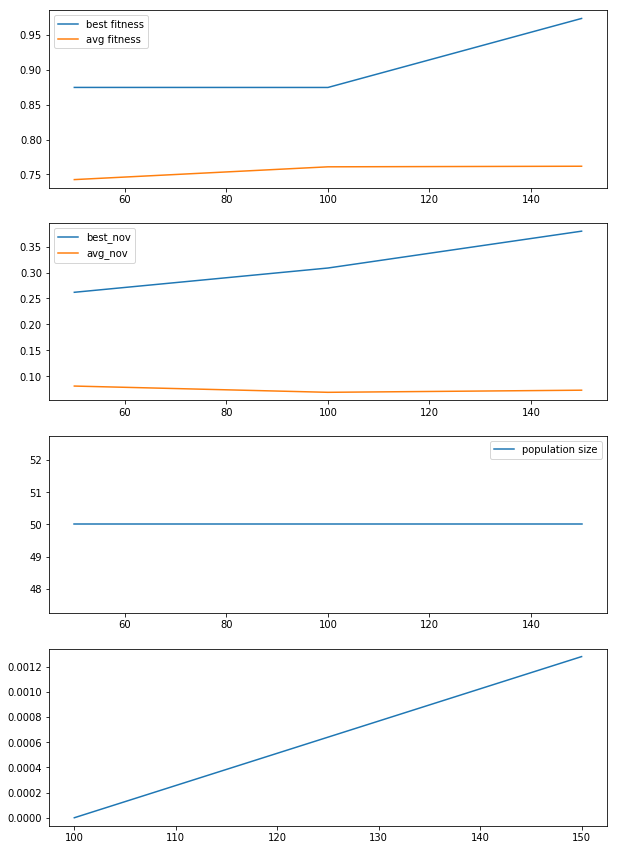

ipop_cmaes_20_3_7-19-41-1814_3782610


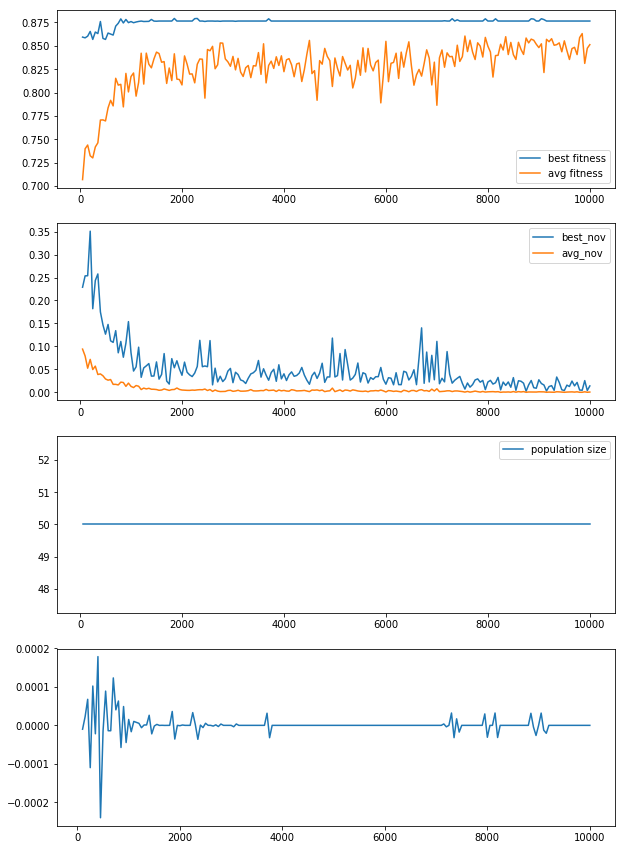

ipop_cmaes_20_3_7-19-41-1236_1599666773


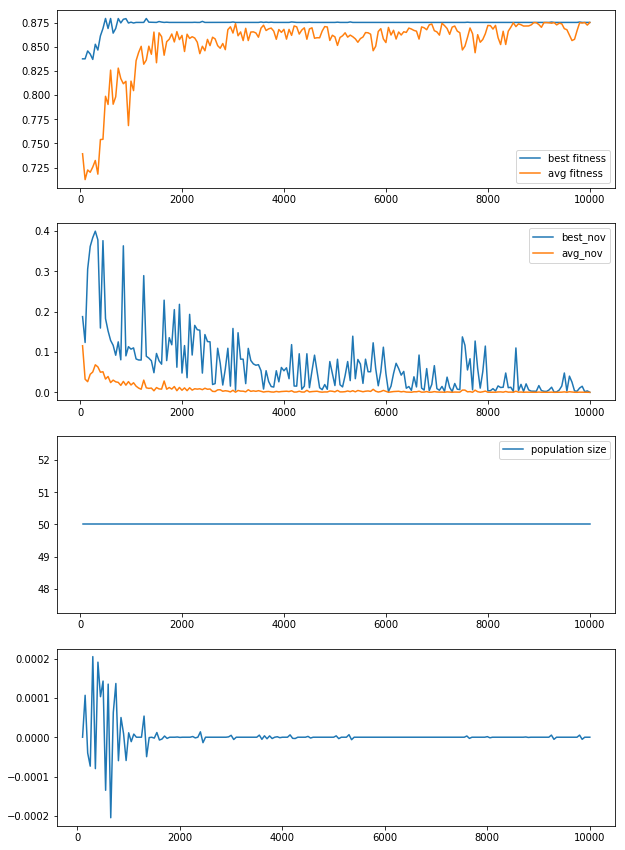

ipop_cmaes_20_3_7-19-30-726_4287323851


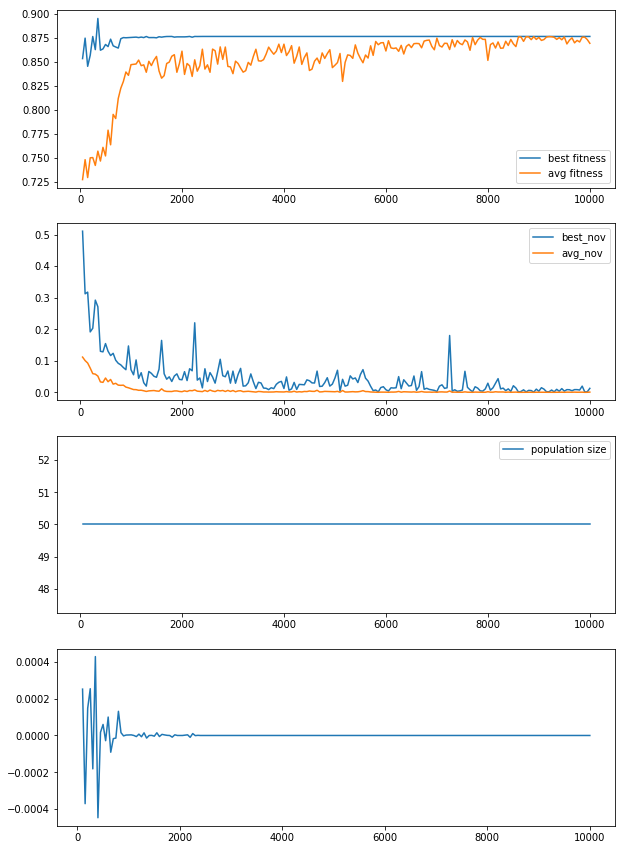

ipop_cmaes_20_3_7-19-38-8519_2296071266


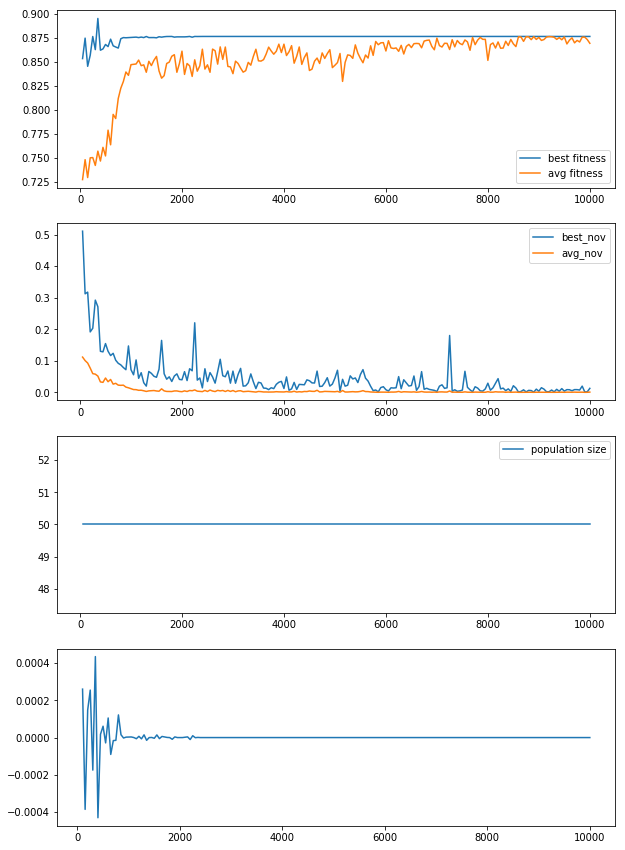

In [ ]:
are_cmaes_multi_fitnov = "/home/leni/are-logs/are_cmaes_multi_fitnov//"
x_vec = []
y_vec = []
for folder in os.listdir(are_cmaes_multi_fitnov) :
    if(not os.path.isdir(are_cmaes_multi_fitnov + folder)) :
        continue
    print(folder)
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_cmaes_multi_fitnov + folder + "/fitnesses.csv")
    neval, best_nov, avg_nov,pop_size = load_all_fitnesses(are_cmaes_multi_fitnov + folder + "/novelty.csv")
    nbeval, eval_time = load_eval_time(are_cmaes_multi_fitnov + folder + "/eval_durations.csv");

    
    gain = [(best_fit[i] - best_fit[i-1])/eval_time[i-1] for i in range(1,len(best_fit))]

    fig = plt.figure(figsize=[10,15])
    ax1 = fig.add_subplot(4,1,1)
    ax2 = fig.add_subplot(4,1,3)
    ax3 = fig.add_subplot(4,1,2)
    ax4 = fig.add_subplot(4,1,4)

#    ax1.set_ylim(0.4,1)
#    ax3.set_ylim(0.0,0.5)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    ax3.plot(neval,best_nov,label="best_nov")
    ax3.plot(neval,avg_nov,label="avg_nov")
    ax4.plot(neval[1:],gain,label='gain')
   # ax5.plot(eval_durations)

    
    ax1.legend()
    ax2.legend()
    ax3.legend()
    plt.show()
    animation_pop(are_cmaes_multi_fitnov + folder,pop_size,1)

ipop_cmaes_21_3_10-3-16-6656_2504209021


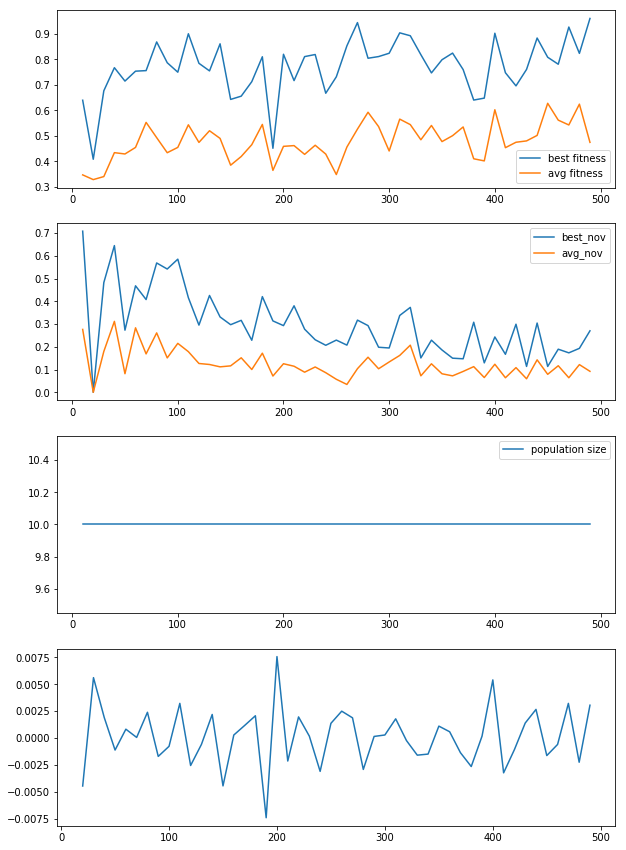

ipop_cmaes_21_3_10-3-5-5911_2101737028


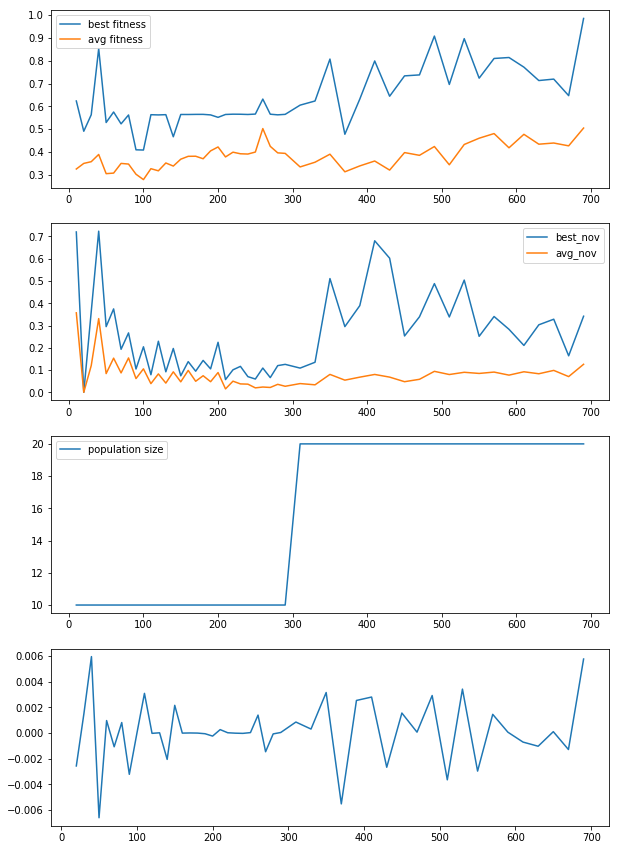

ipop_cmaes_21_3_10-3-4-4488_3542340875


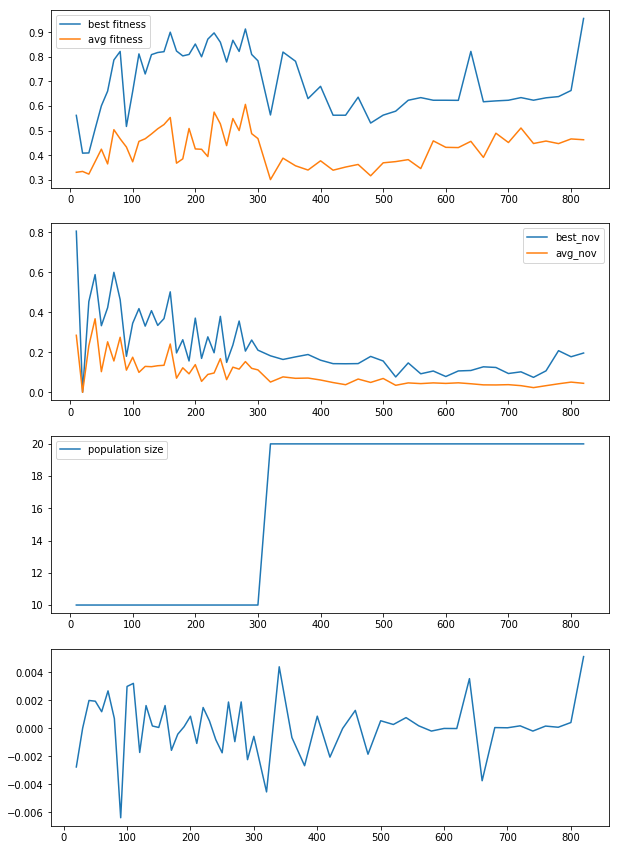

ipop_cmaes_21_3_10-3-9-9304_4113242958


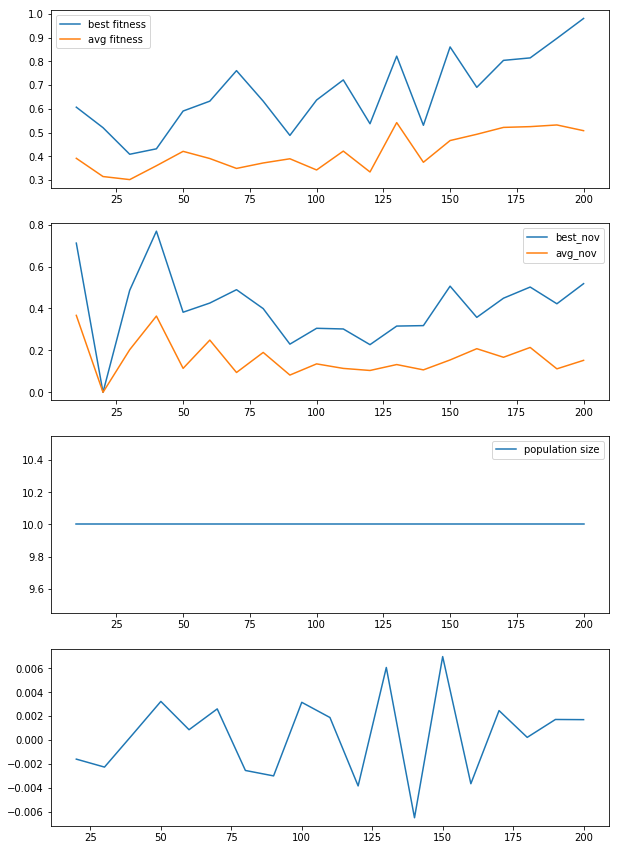

ipop_cmaes_21_3_10-3-11-1741_461679071


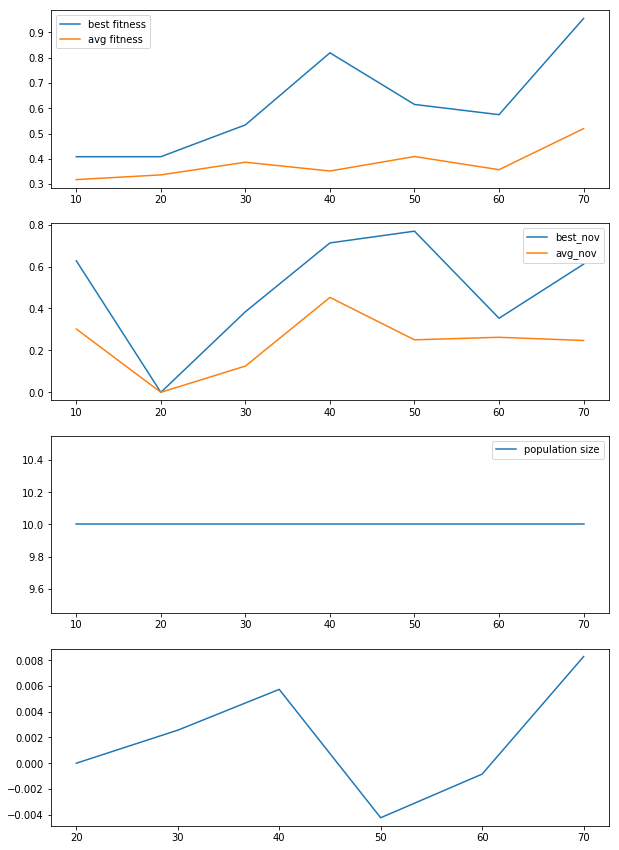

In [3]:
are_ipop_easy_fitnov = "/home/leni/are-logs/are_ipop_easy/"
x_vec = []
y_vec = []
for folder in os.listdir(are_ipop_easy_fitnov) :
    if(not os.path.isdir(are_ipop_easy_fitnov + folder)) :
        continue
    print(folder)
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_ipop_easy_fitnov + folder + "/fitnesses.csv")
    neval, best_nov, avg_nov,pop_size = load_all_fitnesses(are_ipop_easy_fitnov + folder + "/novelty.csv")
    nbeval, eval_time = load_eval_time(are_ipop_easy_fitnov + folder + "/eval_durations.csv");

    
    gain = [(best_fit[i] - best_fit[i-1])/eval_time[i-1] for i in range(1,len(best_fit))]

    fig = plt.figure(figsize=[10,15])
    ax1 = fig.add_subplot(4,1,1)
    ax2 = fig.add_subplot(4,1,3)
    ax3 = fig.add_subplot(4,1,2)
    ax4 = fig.add_subplot(4,1,4)

#    ax1.set_ylim(0.4,1)
#    ax3.set_ylim(0.0,0.5)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    ax3.plot(neval,best_nov,label="best_nov")
    ax3.plot(neval,avg_nov,label="avg_nov")
    ax4.plot(neval[1:],gain,label='gain')
   # ax5.plot(eval_durations)

    
    ax1.legend()
    ax2.legend()
    ax3.legend()
    plt.show()
    animation_pop(are_ipop_easy_fitnov + folder,pop_size,1)

ipop_cmaes_21_3_9-54-33-3081_4085676437


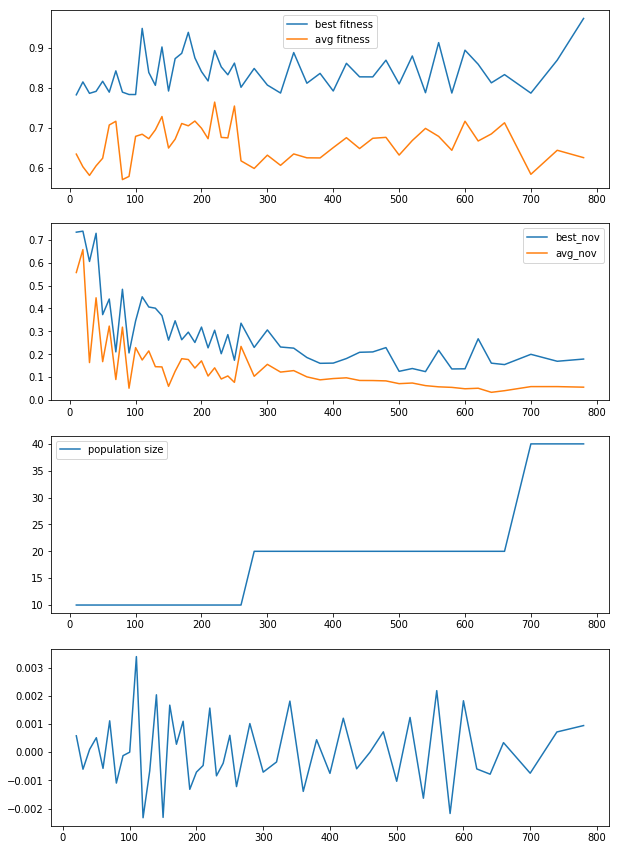

ipop_cmaes_21_3_9-54-36-6574_94676839


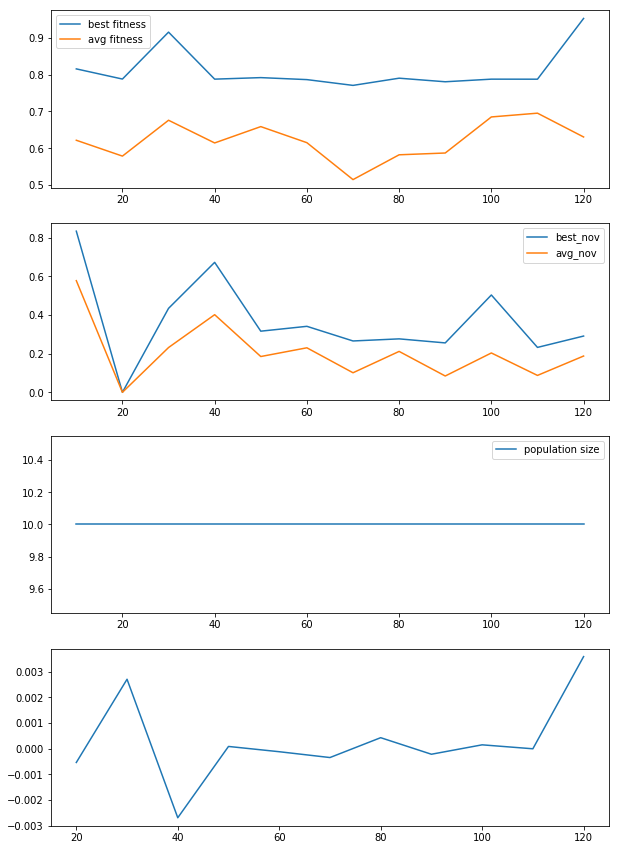

ipop_cmaes_21_3_9-54-39-9983_1302506593


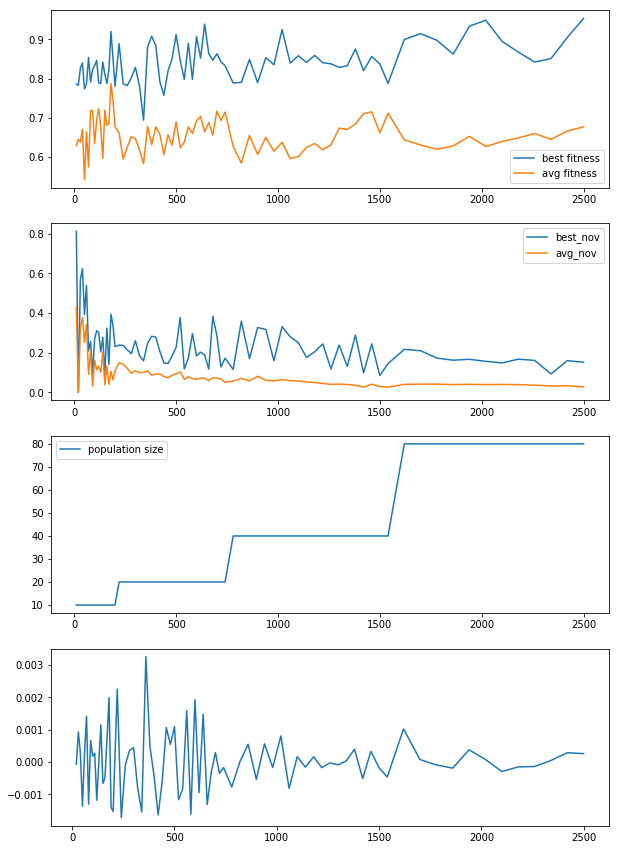

ipop_cmaes_21_3_9-54-41-1684_1829147415


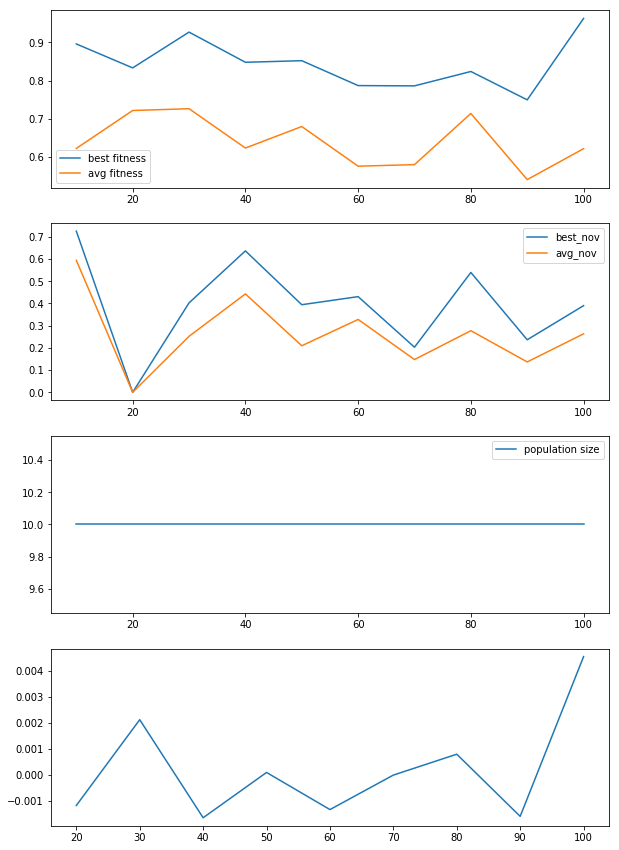

ipop_cmaes_21_3_9-54-48-8886_3651444625


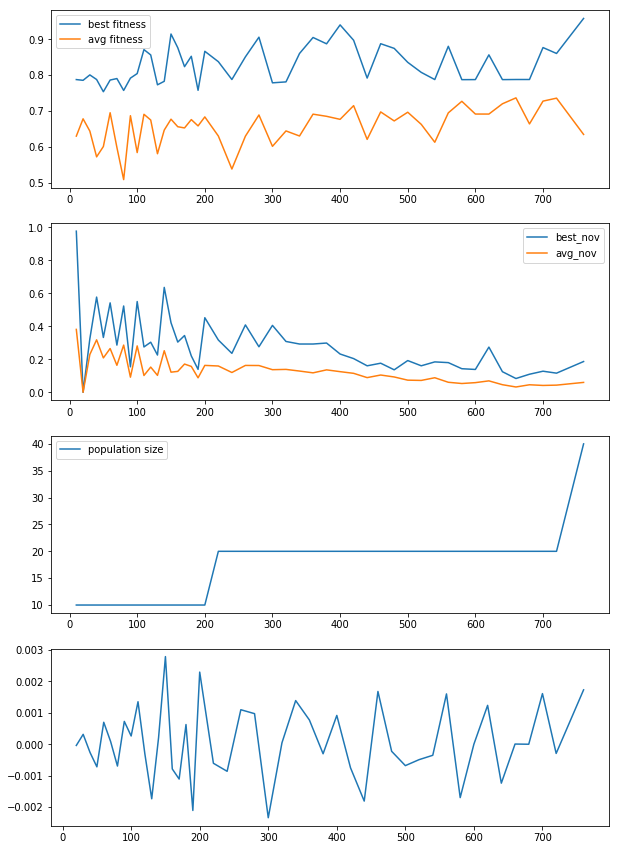

In [4]:
are_ipop_easy_fitnov = "/home/leni/are-logs/are_ipop_middle/"
x_vec = []
y_vec = []
for folder in os.listdir(are_ipop_easy_fitnov) :
    if(not os.path.isdir(are_ipop_easy_fitnov + folder)) :
        continue
    print(folder)
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_ipop_easy_fitnov + folder + "/fitnesses.csv")
    neval, best_nov, avg_nov,pop_size = load_all_fitnesses(are_ipop_easy_fitnov + folder + "/novelty.csv")
    nbeval, eval_time = load_eval_time(are_ipop_easy_fitnov + folder + "/eval_durations.csv");

    
    gain = [(best_fit[i] - best_fit[i-1])/eval_time[i-1] for i in range(1,len(best_fit))]

    fig = plt.figure(figsize=[10,15])
    ax1 = fig.add_subplot(4,1,1)
    ax2 = fig.add_subplot(4,1,3)
    ax3 = fig.add_subplot(4,1,2)
    ax4 = fig.add_subplot(4,1,4)

#    ax1.set_ylim(0.4,1)
#    ax3.set_ylim(0.0,0.5)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    ax3.plot(neval,best_nov,label="best_nov")
    ax3.plot(neval,avg_nov,label="avg_nov")
    ax4.plot(neval[1:],gain,label='gain')
   # ax5.plot(eval_durations)

    
    ax1.legend()
    ax2.legend()
    ax3.legend()
    plt.show()
    animation_pop(are_ipop_easy_fitnov + folder,pop_size,1)